In [1]:
%matplotlib inline

# This script downloads and reformats the wikipedia link dataset found at: http://snap.stanford.edu/data/index.html

Aim: to give each page a domain-level label, in addition to category level. Done by querying the wikipedia api for each category, and choosing domain to confer on submembers.

In [2]:
import os, sys, gc
import numpy as np
import pickle
import wikipediaapi
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from collections import Counter

In [3]:
wDir = '../../..'
dataDir = '{0}/WIKIdata'.format(wDir)
matDir = 'matrices2020'
figDir = 'figs2020'
os.listdir(dataDir)

['pages_to_categories2020.p',
 'wiki-topcats.txt',
 'wiki-topcats-categories.txt',
 '.DS_Store',
 'categories_to_domains2020.p',
 'catLens2020.npy',
 'catLens2020all.npy',
 'matrices2020',
 'categories_to_names2020.p',
 'wiki-topcats-page-names.txt',
 'categories_to_categories2020.p',
 'domains_to_names2020.p',
 'domains2020.npy',
 'figs2020']

In [4]:
with open('{0}/categories_to_categories2020.p'.format(dataDir), 'rb') as pfile:
    catsCatsMappings = pickle.load(pfile)

with open('{0}/categories_to_names2020.p'.format(dataDir), 'rb') as pfile:
    categoryNames = pickle.load(pfile)

with open('{0}/domains_to_names2020.p'.format(dataDir), 'rb') as pfile:
    domainNames = pickle.load(pfile)

with open('{0}/categories_to_domains2020.p'.format(dataDir), 'rb') as pfile:
    catDomMappings = pickle.load(pfile)

In [5]:
categories = list(catDomMappings.keys())
print(categories[0])
print(categoryNames[categories[0]])
print(catDomMappings[categories[0]][0])
print(domainNames[catDomMappings[categories[0]][0]])

5
Laboulbeniomycetes
0
Fungus classes


In [6]:
class domainObject:
    def __init__(self, name, idx):
        self.name = name
        self.idx = idx
        self.categories = []
        self.C = None
        self.edges = {}
        self.categoryMappings = {}

    def reduce_categories(self, categoryNames):
        """Use after compilation"""
        # below code used to remove self loops
        #for category in self.categories:
        #    if categoryNames[category].replace('_', ' ') == self.name:
        #        self.categories.remove(category)
        
        self.categories = list(set(self.categories))
        self.C = len(self.categories)
        for c, i in zip(self.categories, np.arange(len(self.categories))):
            self.categoryMappings[i] = c
            
        self.numCats = len(self.categories)
        labels = []
        for i in np.arange(self.numCats):
            labels.append(categoryNames[self.categoryMappings[i]])
        self.categoryLabels = labels
        assert len(self.categoryLabels) == self.C, "labels {} long, categories {} long".format(len(self.categoryLabels,
                                                                                         self.C))
        #assert self.C > 1
    def reduce_edges(self):
        """Use after self.categories fully compiled and reduced"""
        for source, edges in self.edges.items():
            self.edges[source] = [x for x in edges if x in self.categories]
            
    def create_frequency_matrix(self):
        """Run after above"""
        freqVec = np.empty(self.numCats)
        for i in np.arange(self.numCats):
            freqVec[i] = len(self.edges[self.categoryMappings[i]])
        self.freqVec = (freqVec / np.sum(freqVec))
        assert np.abs(np.sum(self.freqVec) - 1.0) < 0.01, "freqVec sum not 1: instead, {0}, {1}".format(self.freqVec, np.sum(self.freqVec))
        
        
    def create_interaction_matrix(self):
        interactionMatrix = np.empty((self.numCats, self.numCats))
        for i in np.arange(self.numCats):
            baseCat = self.categoryMappings[i]
            for j in np.arange(self.numCats):
                targetCat = self.categoryMappings[j]
                interactionMatrix[i, j] = len([x for x in self.edges[baseCat] if x == targetCat])
                
        self.interactionMatrix = interactionMatrix / np.sum(interactionMatrix, axis = 1)[:, np.newaxis]
        assert np.abs(np.sum(self.interactionMatrix[0, :]) - 1.0) < 0.01, "interactionMatrix[0, :]\
        sum not 1: instead, {0}".format(np.sum(self.interactionMatrix, axis = 1))
        
    def plot_interaction_matrix(self, savePath=False):
        fig = plt.figure(constrained_layout=True)
        gs = fig.add_gridspec(nrows=4, ncols=11) #, left=0.05, right=0.48, wspace=0.05)

        ax1 = fig.add_subplot(gs[:, :6])
        ax1.matshow(self.interactionMatrix, vmin = 0, vmax = 1, cmap='Greys')
        ax1.set_title('Interactions')
        ax2 = fig.add_subplot(gs[:, 8:])
        plt.sca(ax2)
        myPlot = ax2.matshow(self.freqVec[:, np.newaxis], vmin = 0, vmax = 1, cmap='Greys')
        ax2.set_title('Freq')
        plt.suptitle('Interaction matrix for domain: {0}'.format(self.name))
        
        ax1.set_yticklabels([''] + self.categoryLabels)
        
        ax1.set_xticklabels([''] + self.categoryLabels)
        ax1.xaxis.set_ticks_position('bottom')
        ax1.set_xticklabels(ax1.get_xticklabels(), rotation = 45, ha="right")

        ax2.set_xticks([])
        ax2.set_yticks([])
        left, bottom, width, height = ax2.get_position().bounds
        cax = fig.add_axes([left + 0.3, bottom + height - 0.3, width * 0.5, 0.25])
        cbar = plt.colorbar(myPlot, cax = cax)
        
        if savePath:
            try:
                plt.savefig('{0}.png'.format(savePath), bbox_inches = 'tight', bbox_extra_artist=(cbar,))
            except Exception as e:
                print('exception to print: {}'.format(e))
                try:
                    plt.savefig('{0}.png'.format(savePath.replace(".","-")), bbox_inches = 'tight', bbox_extra_artist=(cbar,))
                except Exception as e:
                    print("further exception to print: {}".format(e))
                
        plt.show()
        plt.close('all')
        
    def save_matrices(self, savePath):
        print('saving data in: {0}'.format(savePath))
        np.savez('{0}'.format(savePath), intMat = self.interactionMatrix, freqVec = self.freqVec,
                name=np.asarray(self.name), categoryNames = self.categoryLabels, C = self.C)
        
testDomain = domainObject(domainNames[catDomMappings[categories[0]][0]], catDomMappings[categories[0]][0])
print(testDomain.name)


Fungus classes


In [7]:
domainDict = {}
for i, category in enumerate(categories):
    print('at category: {0}, {1} ({2})'.format(i, category, categoryNames[category]))
    edges = catsCatsMappings[category]
    domains = catDomMappings[category]
    for domain in domains:
        if domain in domainDict.keys():
            print('adding to domain {0} ({1})'.format(domain, domainNames[domain]))
            domainDict[domain].categories.append(category)
            domainDict[domain].edges[category] = edges
        else:
            print('\n making new domain: {0} ({1})'.format(domain, domainNames[domain]))
            domainDict[domain] = domainObject(domainNames[domain], domain)

at category: 0, 5 (Laboulbeniomycetes)

 making new domain: 0 (Fungus classes)
at category: 1, 13 (Euphorbia)

 making new domain: 3 (Taxa named by Carl Linnaeus)

 making new domain: 1 (Medicinal plants)

 making new domain: 2 (Poisonous plants)
at category: 2, 32 (RNA)

 making new domain: 4 (Biotechnology)

 making new domain: 6 (RNA)

 making new domain: 5 (Molecular biology)
at category: 3, 33 (Anatomy)

 making new domain: 7 (Branches of biology)
at category: 4, 34 (History_of_medicine)

 making new domain: 8 (History of science by discipline)
at category: 5, 35 (Bacteriology)

 making new domain: 9 (Bacteriology)
at category: 6, 38 (Metabolism)

 making new domain: 10 (Metabolism)
at category: 7, 39 (Microbiology)
adding to domain 7 (Branches of biology)
at category: 8, 40 (Membrane_biology)

 making new domain: 11 (Biophysics)
at category: 9, 41 (Proteins)
adding to domain 5 (Molecular biology)
at category: 10, 42 (Cell_biology)

 making new domain: 12 (Cell biology)
adding to 

adding to domain 97 (Architectural styles)
at category: 511, 3866 (Pashas)
adding to domain 258 (Noble titles)
at category: 512, 3893 (Lakes_of_Finland)
adding to domain 294 (Lists of lakes by country)
at category: 513, 3907 (Royal_Navy)

 making new domain: 416 (British Armed Forces)

 making new domain: 417 (Military of the United Kingdom)
at category: 514, 3962 (Oakland_Athletics_seasons)

 making new domain: 418 (Major League Baseball teams seasons)
at category: 515, 3979 (Philadelphia_Phillies_seasons)
adding to domain 418 (Major League Baseball teams seasons)
at category: 516, 3984 (Chicago_Cubs_seasons)
adding to domain 418 (Major League Baseball teams seasons)
at category: 517, 3994 (Chicago_White_Sox_seasons)
adding to domain 418 (Major League Baseball teams seasons)
at category: 518, 4000 (Baseball_terminology)
adding to domain 205 (Glossaries of sports)
at category: 519, 4006 (San_Francisco_Giants_seasons)
adding to domain 418 (Major League Baseball teams seasons)
at categor

at category: 693, 5505 (Individual_dogs)

 making new domain: 496 (Lists of dogs)
at category: 694, 5508 (Dog_diseases)
adding to domain 496 (Lists of dogs)
at category: 695, 5509 (Livestock)
adding to domain 80 (Webarchive template webcite links)
at category: 696, 5517 (National_Historic_Sites_in_Ontario)

 making new domain: 497 (Ontario-related lists)
at category: 697, 5518 (Sheriffs_of_the_City_of_London)

 making new domain: 499 (Local government in London)

 making new domain: 498 (City of London)
at category: 698, 5519 (Lord_Mayors_of_London)
adding to domain 499 (Local government in London)
adding to domain 498 (City of London)
at category: 699, 5529 (Alumni_of_the_University_of_Birmingham)

 making new domain: 500 (Lists of people by university or college in England)
at category: 700, 5572 (Old_Harrovians)

 making new domain: 501 (Lists of people by school affiliation in London)
at category: 701, 5577 (Old_Etonians)
adding to domain 441 (Racquets venues)
adding to domain 443 

adding to domain 34 (Portal templates with all redlinked portals)
at category: 1077, 8767 (Landscape_architecture)
adding to domain 44 (Environmental social science)

 making new domain: 638 (Landscape architecture)
at category: 1078, 8792 (Political_parties_in_New_Zealand)
adding to domain 566 (Lists of political parties by country)
at category: 1079, 8802 (New_Zealand_writers)
adding to domain 239 (Lists of writers by nationality)
at category: 1080, 8824 (New_Zealand_international_footballers)
adding to domain 212 (Lists of association football players by national team)
at category: 1081, 8845 (Salticidae)
adding to domain 477 (Extant Eocene first appearances)
at category: 1082, 8857 (Mountains_of_Catalonia)
adding to domain 457 (Catalonia-related lists)
at category: 1083, 8876 (Ambassadors_of_the_United_States)
adding to domain 592 (United States Department of State)
at category: 1084, 8882 (Diplomacy)

 making new domain: 639 (Diplomacy)
at category: 1085, 8905 (Dynamo_Dresden_play

at category: 1275, 10697 (2010s_horror_films)
adding to domain 429 (Lists of film lists)
adding to domain 675 (Lists of horror films by decade)
at category: 1276, 10698 (Military_brats)
adding to domain 453 (Military terminology)
adding to domain 399 (Family)
at category: 1277, 10710 (Chinese_film_directors)
adding to domain 680 (Lists of film directors by nationality)
at category: 1278, 10717 (Japanese_films)
adding to domain 429 (Lists of film lists)
adding to domain 430 (Lists of films by country of production)
at category: 1279, 10718 (Japanese_film_directors)
adding to domain 680 (Lists of film directors by nationality)
adding to domain 404 (Lists of Japanese people by occupation)
at category: 1280, 10722 (Japanese_actors)
adding to domain 404 (Lists of Japanese people by occupation)
adding to domain 425 (Lists of actors by nationality)
at category: 1281, 10730 (Japanese-language_films)
adding to domain 209 (CatAutoTOC generates Large category TOC)
at category: 1282, 10733 (Erotic

at category: 1823, 16193 (Cucurbitaceae)
adding to domain 612 (Taxonbars with 25–29 taxon IDs)
at category: 1824, 16194 (Japanese_cuisine)
adding to domain 517 (Region topic template using suffix)
at category: 1825, 16225 (Taoism)
adding to domain 158 (Philosophical traditions)
at category: 1826, 16235 (Chinese_painters)
adding to domain 268 (Lists of painters by nationality)
at category: 1827, 16239 (Lasiocampidae)
adding to domain 580 (Moth families)
at category: 1828, 16240 (Tineidae)
adding to domain 580 (Moth families)
at category: 1829, 16242 (Burmese_monarchs)
adding to domain 261 (Lists of monarchs)
at category: 1830, 16244 (Hsawlaw_Township)

 making new domain: 761 (Townships of Kachin State)

 making new domain: 760 (Kachin State geography stubs)
at category: 1831, 16245 (Chipwi_Township)
adding to domain 761 (Townships of Kachin State)
adding to domain 760 (Kachin State geography stubs)
at category: 1832, 16246 (Bhamo_Township)
adding to domain 761 (Townships of Kachin Stat

at category: 2012, 17206 (Norman_architecture)
adding to domain 274 (Architectural history)
at category: 2013, 17214 (Church_architecture)
adding to domain 97 (Architectural styles)
adding to domain 412 (Church architecture)
at category: 2014, 17215 (Georgian_architecture)
adding to domain 96 (American architectural styles)
adding to domain 413 (18th-century architecture)
adding to domain 414 (19th-century architecture)
adding to domain 388 (House styles)
adding to domain 97 (Architectural styles)
at category: 2015, 17237 (Alumni_of_the_University_of_Leeds)
adding to domain 500 (Lists of people by university or college in England)
at category: 2016, 17257 (Archbishops_of_York)

 making new domain: 780 (Lists of Church of England bishops and archbishops)
at category: 2017, 17259 (Bishops_of_Hereford)
adding to domain 780 (Lists of Church of England bishops and archbishops)
at category: 2018, 17260 (Bishops_of_Rochester)
adding to domain 780 (Lists of Church of England bishops and archbi

old domain idx
0
[7969, 15883, 7972, 7974]
new domain idx
0
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_0.npz


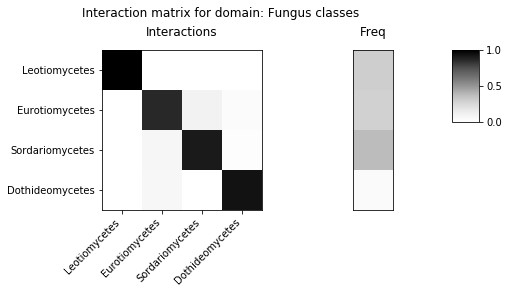

old domain idx
3
[14345, 8557, 14255, 8564, 8436, 8569, 7578, 8539, 16479]
new domain idx
1
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_1.npz


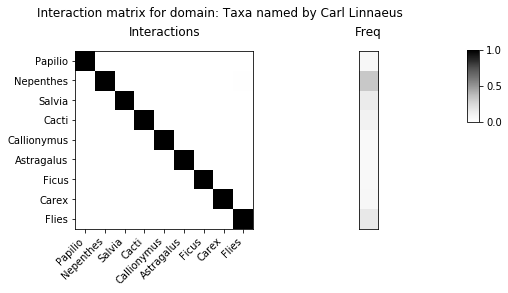

old domain idx
1
[8485, 8555, 14255, 8595, 8569, 8666]
new domain idx
2
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_2.npz


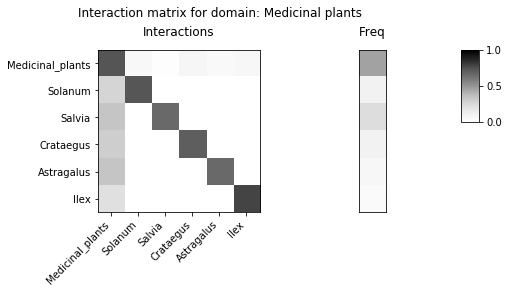

old domain idx
2
[8466, 8660, 8565, 8502, 8666]
new domain idx
3
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_3.npz


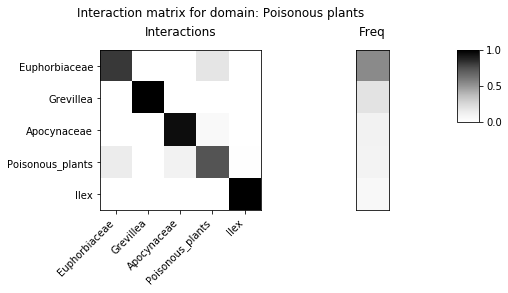

old domain idx
4
[352, 4484, 44, 47, 52]
new domain idx
4
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_4.npz


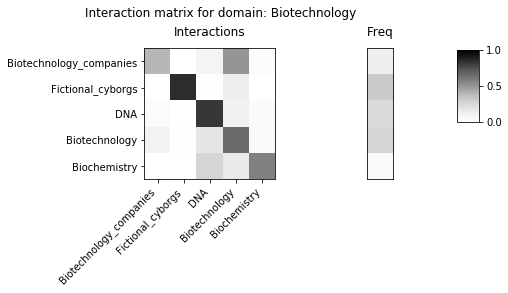

old domain idx
5
[129, 130, 161, 132, 41, 42, 45, 178, 243, 52]
new domain idx
5
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_5.npz


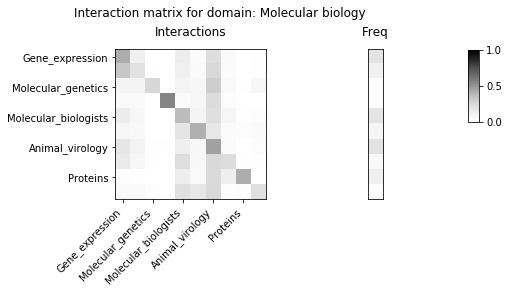

old domain idx
7
[82, 5243, 39]
new domain idx
6
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_6.npz


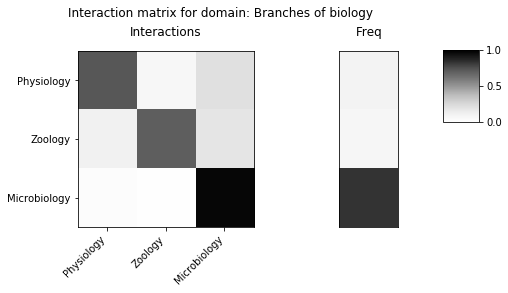

old domain idx
8
[6147, 10885, 10823, 6151, 11015, 14830, 2898]
new domain idx
7
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_7.npz


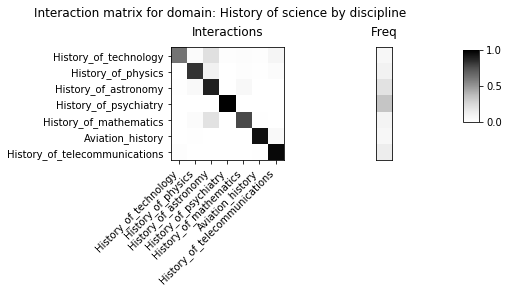

old domain idx
10
[16185, 58, 43]
new domain idx
8
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_8.npz


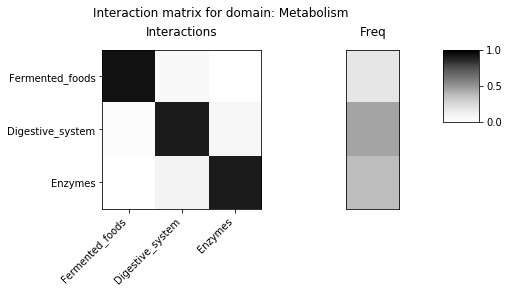

old domain idx
12
[113, 161, 45]
new domain idx
9
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_9.npz


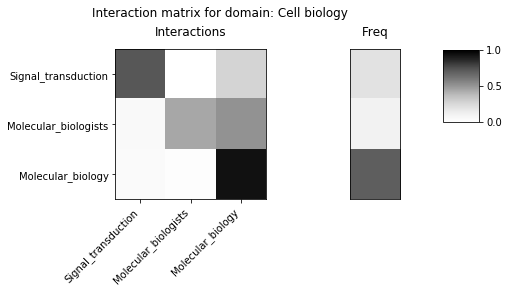

old domain idx
14
[352, 90, 102]
new domain idx
10
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_10.npz


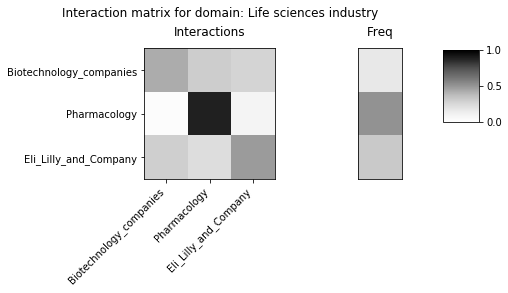

old domain idx
18
[90, 243, 172, 106]
new domain idx
11
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_11.npz


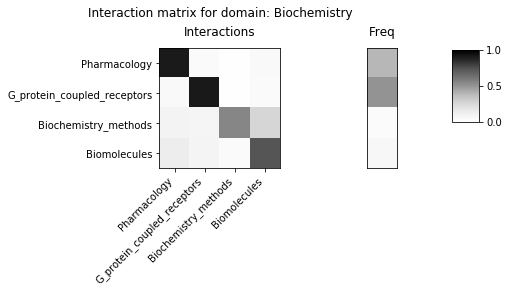

old domain idx
19
[1704, 5040, 5039]
new domain idx
12
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_12.npz


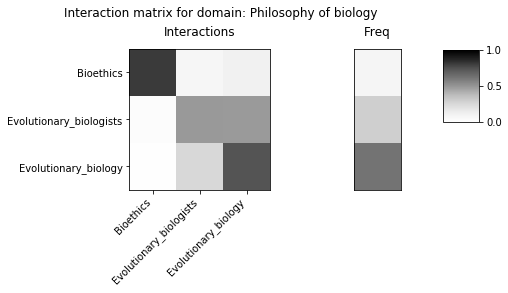

old domain idx
20
[64, 65, 260, 200]
new domain idx
13
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_13.npz


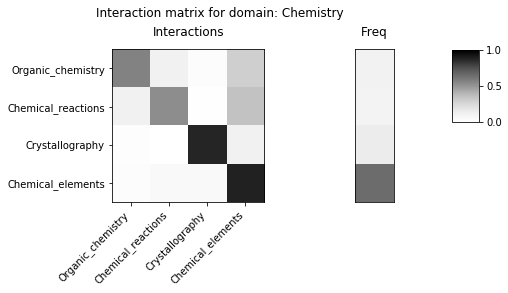

old domain idx
21
[166, 104, 105, 168, 171, 286, 152, 83, 86, 120, 154, 92, 93, 158, 127]
new domain idx
14
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_14.npz


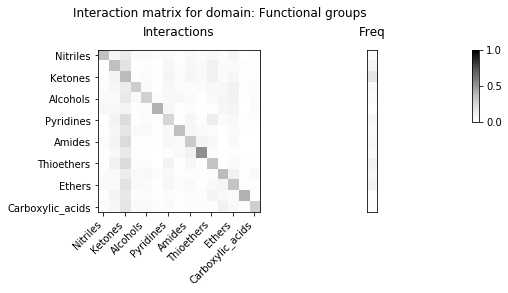

old domain idx
24
[7296, 17125, 7750, 202, 151, 287]
new domain idx
15
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_15.npz


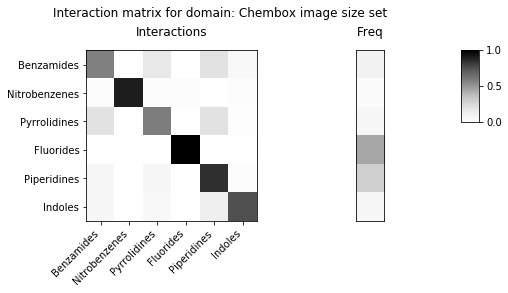

old domain idx
30
[4604, 16793, 140]
new domain idx
16
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_16.npz


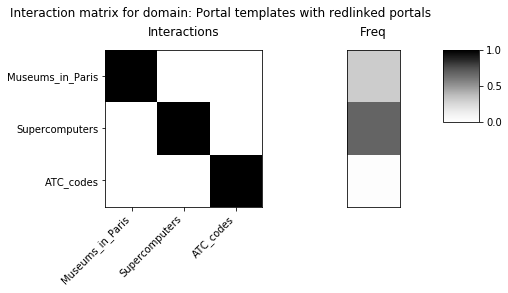

old domain idx
28
[7296, 76, 7749, 7750]
new domain idx
17
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_17.npz


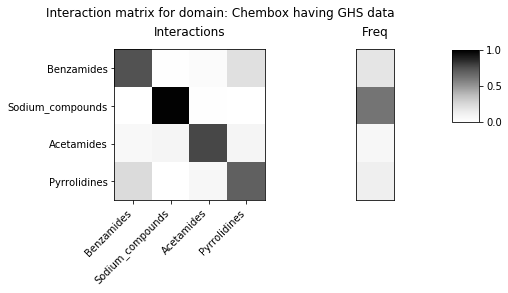

old domain idx
32
[88, 175, 16185, 87]
new domain idx
18
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_18.npz


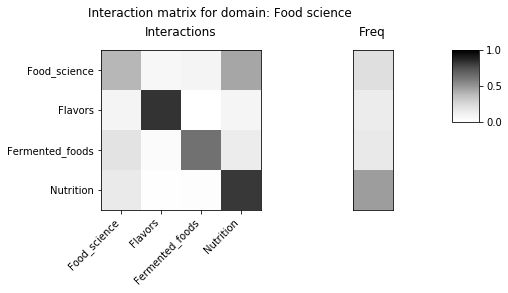

old domain idx
34
[8763, 8387, 11206]
new domain idx
19
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_19.npz


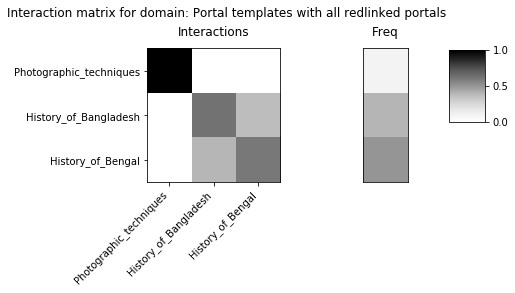

old domain idx
35
[291, 123, 148, 15863]
new domain idx
20
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_20.npz


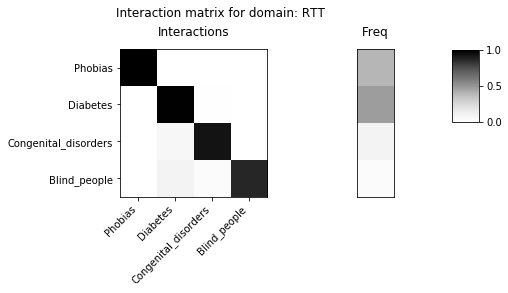

old domain idx
37
[2899, 16268, 9557]
new domain idx
21
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_21.npz


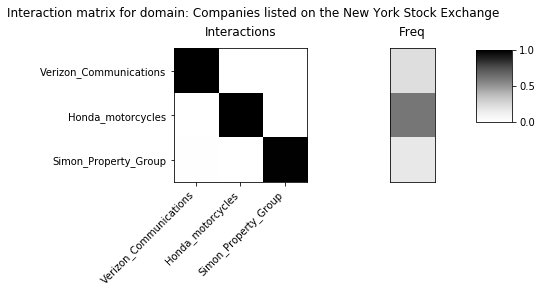

old domain idx
39
[672, 668, 4589]
new domain idx
22
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_22.npz


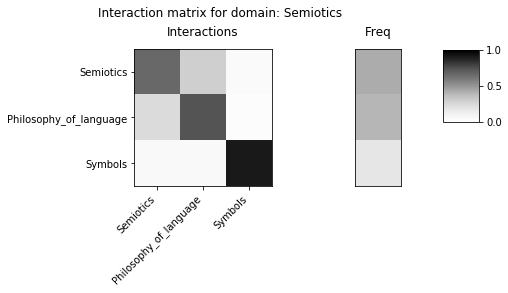

old domain idx
42
[243, 116, 15896, 9277, 159]
new domain idx
23
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_23.npz


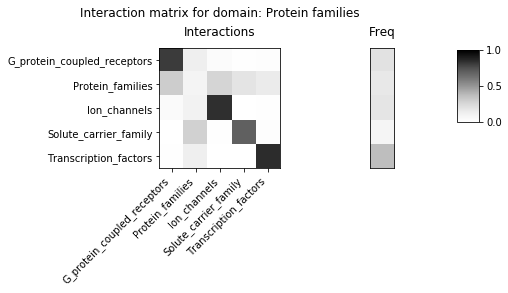

old domain idx
44
[4481, 10917, 6215, 12391, 4368, 634, 318, 8767]
new domain idx
24
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_24.npz


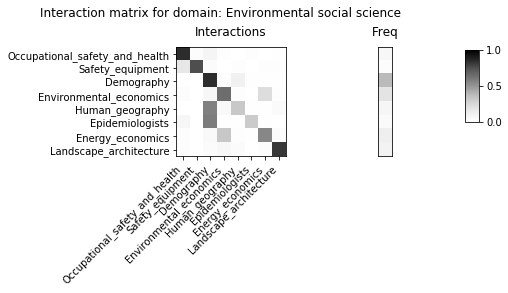

old domain idx
47
[6598, 2889, 10923, 4396, 12715, 16114, 11029, 2872, 2876, 10910, 6623]
new domain idx
25
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_25.npz


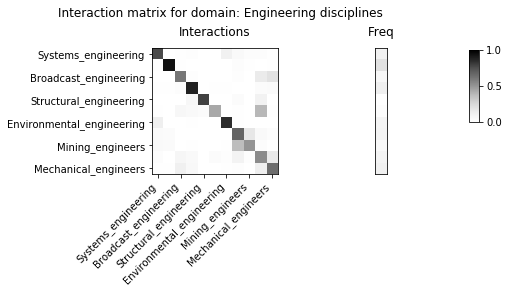

old domain idx
49
[168, 17125, 287]
new domain idx
26
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_26.npz


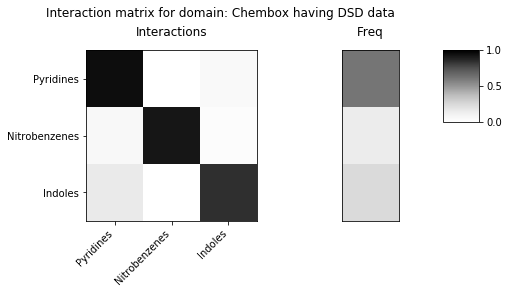

old domain idx
52
[2859, 10871, 8759]
new domain idx
27
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_27.npz


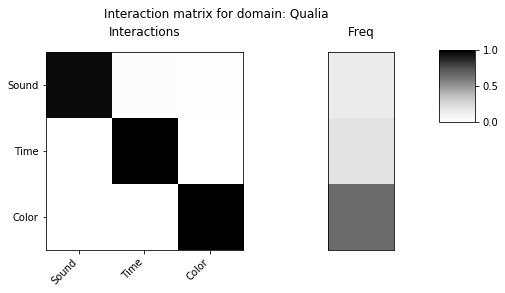

old domain idx
55
[8050, 404, 9196]
new domain idx
28
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_28.npz


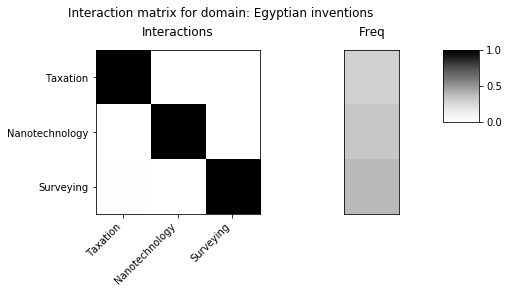

old domain idx
57
[13729, 3106, 4419, 4619, 5452, 6159, 16624, 3857, 5426, 595, 10867, 4661, 4664, 1561, 476, 5886]
new domain idx
29
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_29.npz


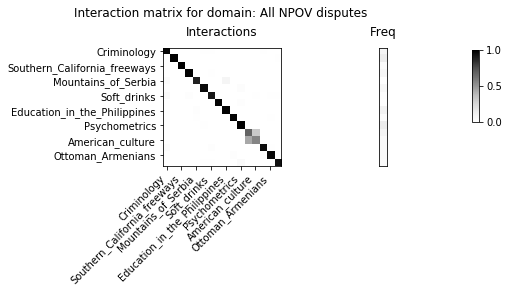

old domain idx
59
[6155, 683, 6159, 6162, 6710]
new domain idx
30
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_30.npz


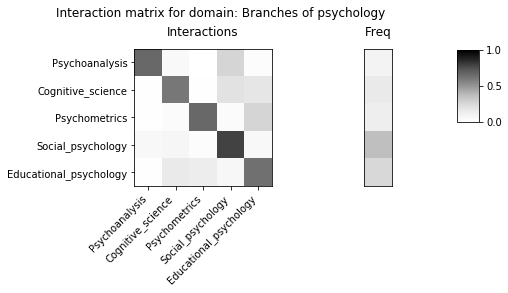

old domain idx
60
[17087, 16479, 15279]
new domain idx
31
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_31.npz


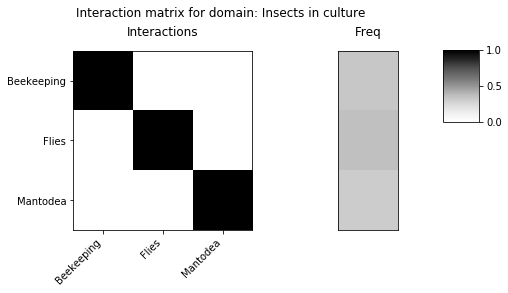

old domain idx
62
[10887, 10888, 10919, 10862, 10831, 10894, 8721, 10866]
new domain idx
32
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_32.npz


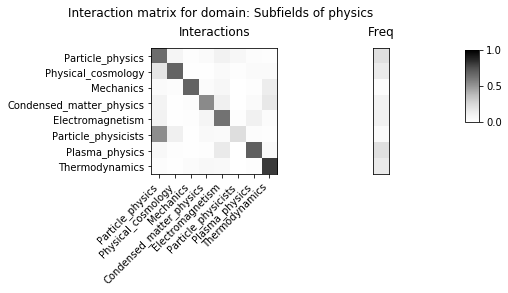

old domain idx
61
[10882, 10886, 10919, 10890, 11024, 8721, 10866, 10869, 10870, 10871]
new domain idx
33
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_33.npz


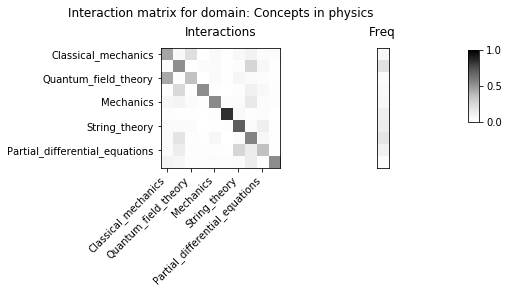

old domain idx
67
[10408, 1381, 2894]
new domain idx
34
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_34.npz


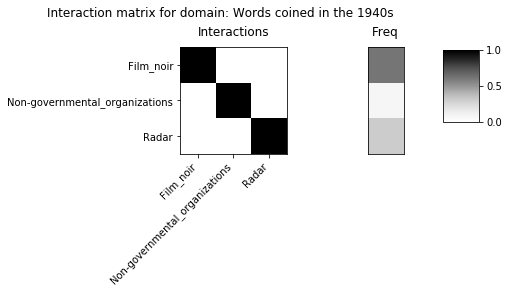

old domain idx
66
[4942, 1427, 4475, 4478]
new domain idx
35
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_35.npz


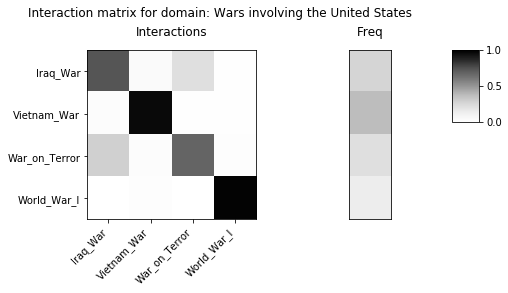

old domain idx
64
[11424, 2152, 4876, 1884, 349, 350]
new domain idx
36
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_36.npz


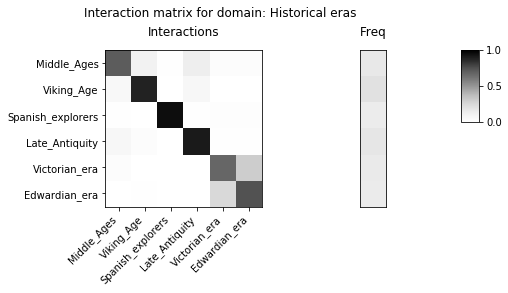

old domain idx
65
[13827, 15235, 16676, 11117, 719, 4958]
new domain idx
37
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_37.npz


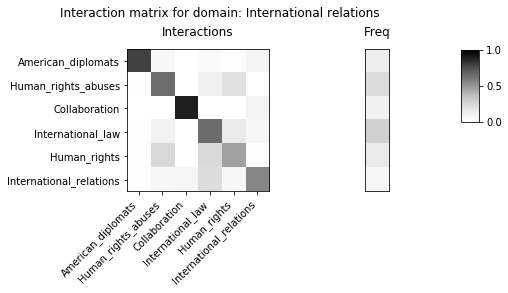

old domain idx
69
[9200, 14004, 1495]
new domain idx
38
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_38.npz


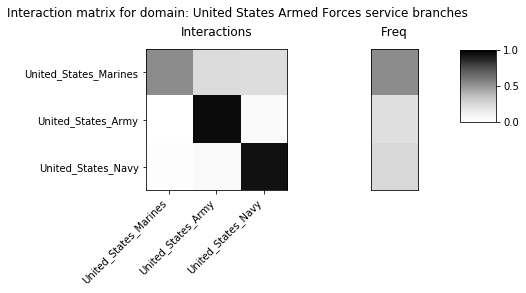

old domain idx
68
[9200, 14004, 1495]
new domain idx
39
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_39.npz


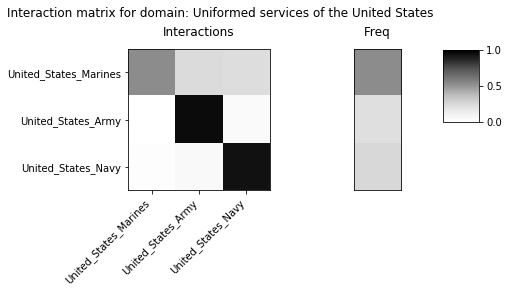

old domain idx
71
[10918, 2821, 10862]
new domain idx
40
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_40.npz


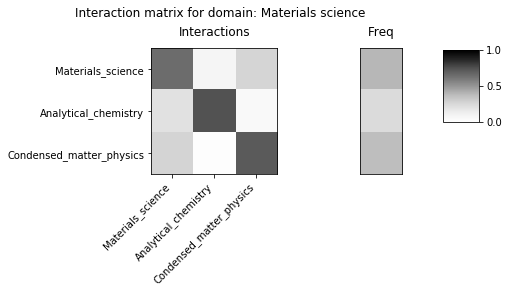

old domain idx
74
[385, 12387, 266, 14383, 4370, 12372, 12376, 1502]
new domain idx
41
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_41.npz


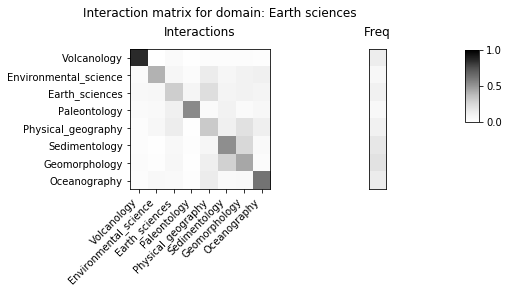

old domain idx
73
[10881, 10850, 10859, 1502]
new domain idx
42
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_42.npz


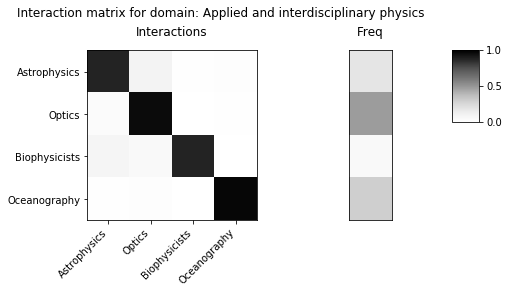

old domain idx
78
[3108, 3117, 3412]
new domain idx
43
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_43.npz


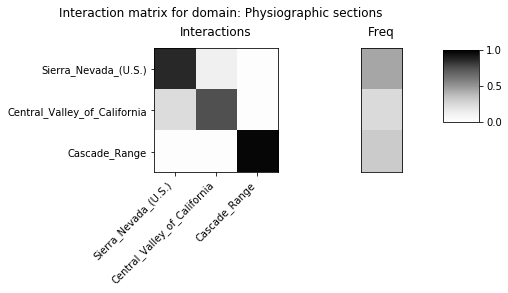

old domain idx
76
[4394, 5035, 12395, 4366, 4370, 12372, 12376, 5721, 1502]
new domain idx
44
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_44.npz


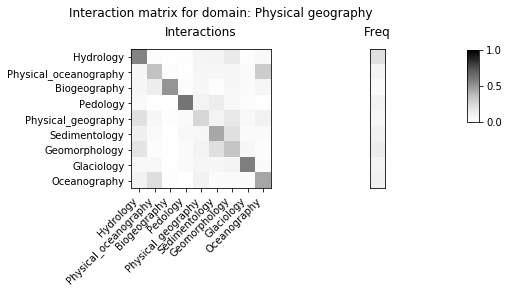

old domain idx
79
[4610, 16357, 11273, 11274, 11373, 12366, 7759, 12143, 12498, 5813, 7127, 12154, 11259, 11260]
new domain idx
45
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_45.npz


/Users/ruairidh/miniconda3/envs/blockmodels/lib/python3.7/site-packages/ipykernel_launcher.py:52: RuntimeWarning: invalid value encountered in true_divide


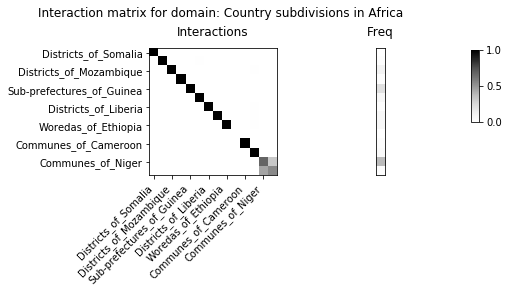

old domain idx
80
[15745, 5509, 12934, 1799, 13669, 13834, 14777, 428, 16778, 12559, 11187, 13972, 16824, 14489, 2908, 17054, 4671]
new domain idx
46
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_46.npz


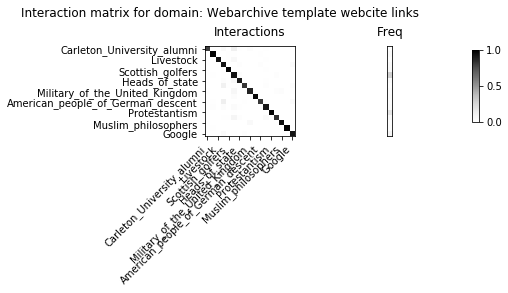

old domain idx
81
[13740, 1380, 6180]
new domain idx
47
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_47.npz


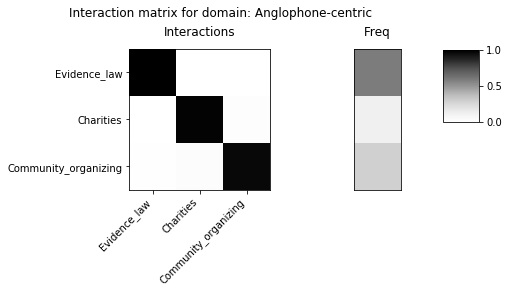

old domain idx
83
[10922, 10907, 10918, 6623]
new domain idx
48
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_48.npz


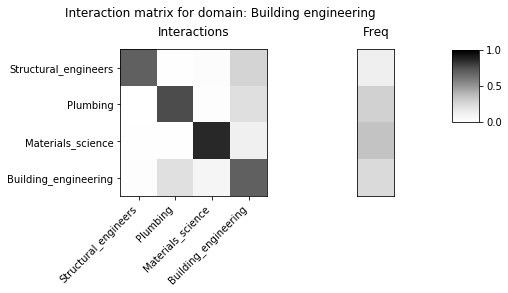

old domain idx
85
[8482, 12395, 4396]
new domain idx
49
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_49.npz


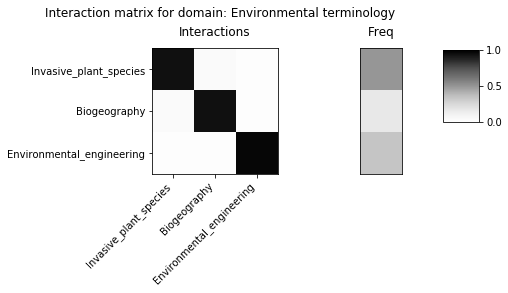

old domain idx
87
[17121, 14215, 8621, 14480, 7996]
new domain idx
50
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_50.npz


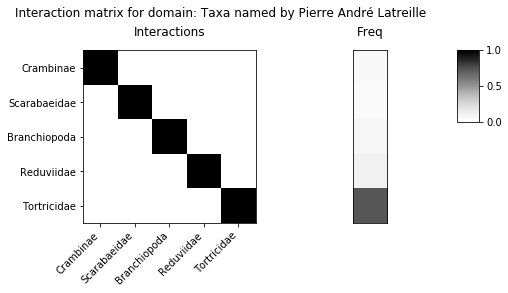

old domain idx
89
[13697, 962, 13698, 13699, 11208, 11441]
new domain idx
51
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_51.npz


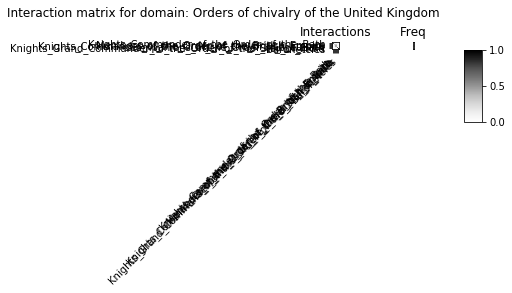

old domain idx
92
[5359, 5040, 14383, 5039, 5369]
new domain idx
52
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_52.npz


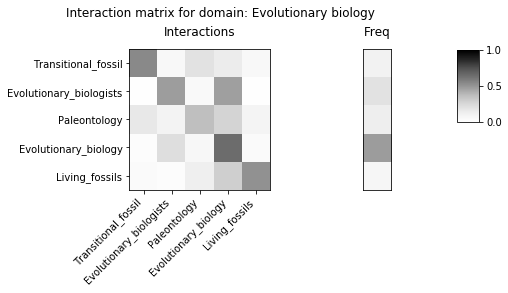

old domain idx
93
[14189, 4368, 6169, 14397, 11551]
new domain idx
53
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_53.npz


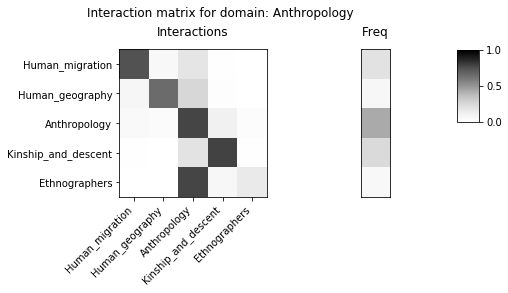

old domain idx
96
[3464, 11156, 11157, 17215]
new domain idx
54
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_54.npz


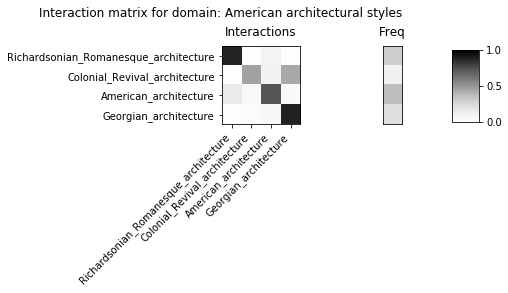

old domain idx
97
[12263, 3464, 12232, 6352, 17214, 6356, 11158, 11159, 3865, 9694, 17215]
new domain idx
55
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_55.npz


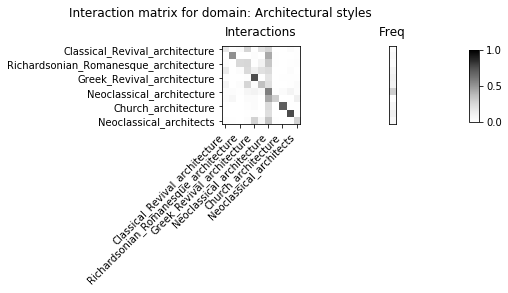

old domain idx
98
[6615, 16563, 10957, 2895]
new domain idx
56
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_56.npz


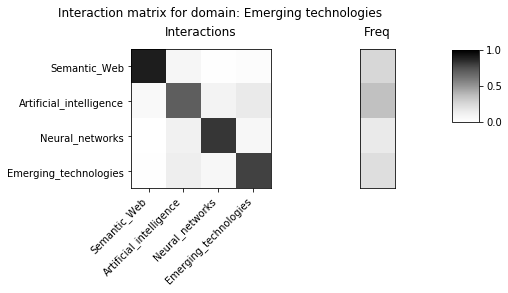

old domain idx
100
[2274, 715, 5389, 15607, 6524, 16701]
new domain idx
57
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_57.npz


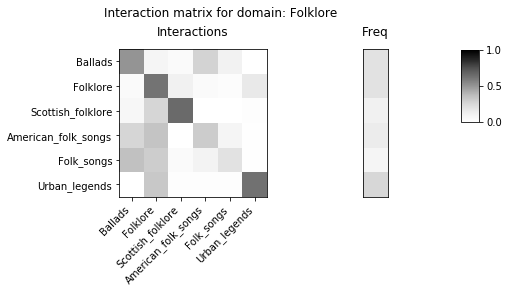

old domain idx
102
[434, 420, 421, 14469]
new domain idx
58
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_58.npz


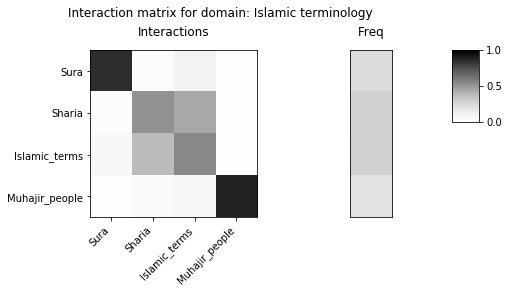

old domain idx
103
[4664, 15989, 4661]
new domain idx
59
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_59.npz


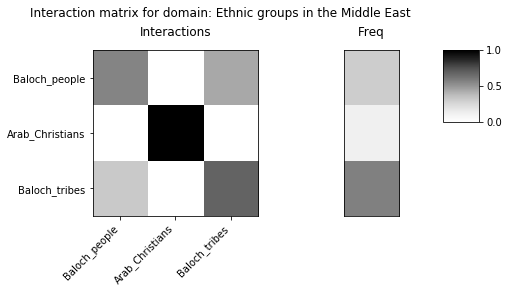

old domain idx
104
[13735, 14819, 13737, 13727]
new domain idx
60
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_60.npz


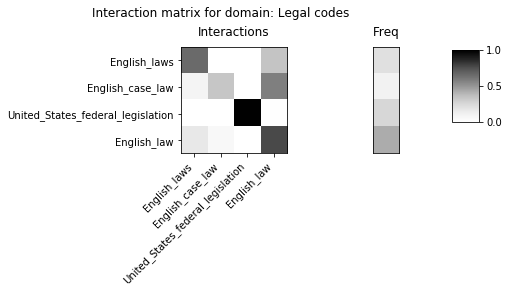

old domain idx
105
[3865, 4362, 7114]
new domain idx
61
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_61.npz


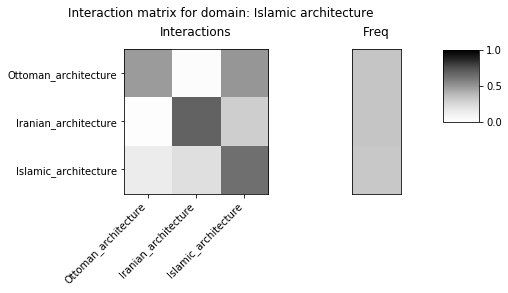

old domain idx
106
[4674, 14188, 6062, 433, 14193, 444]
new domain idx
62
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_62.npz


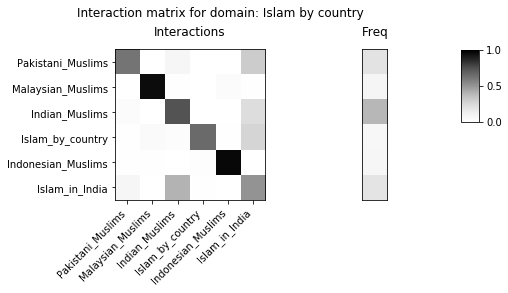

old domain idx
107
[4945, 1860, 1884]
new domain idx
63
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_63.npz


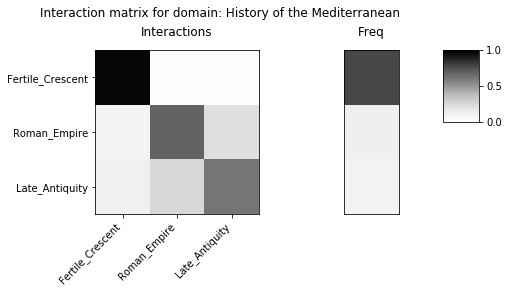

old domain idx
108
[5715, 13124, 13126]
new domain idx
64
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_64.npz


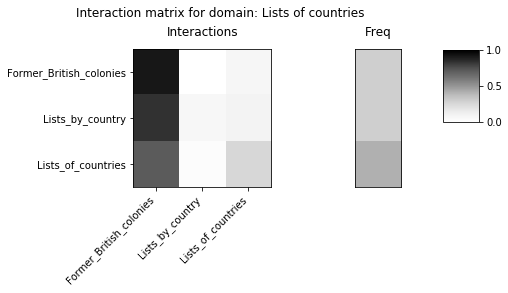

old domain idx
109
[4664, 13280, 4661]
new domain idx
65
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_65.npz


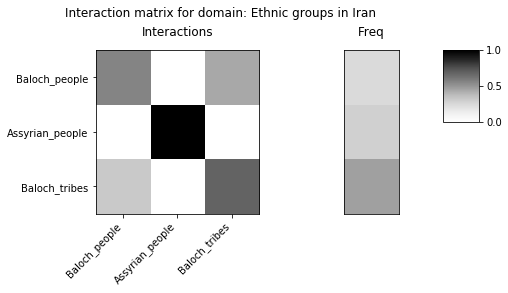

old domain idx
112
[13280, 12193, 509, 15989]
new domain idx
66
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_66.npz


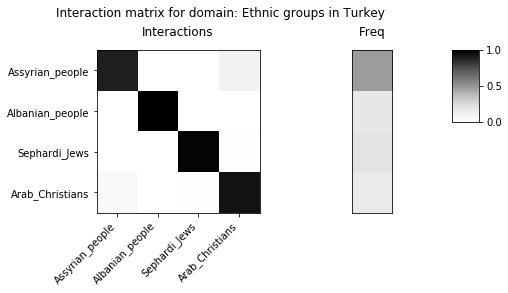

old domain idx
113
[3696, 3690, 13191]
new domain idx
67
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_67.npz


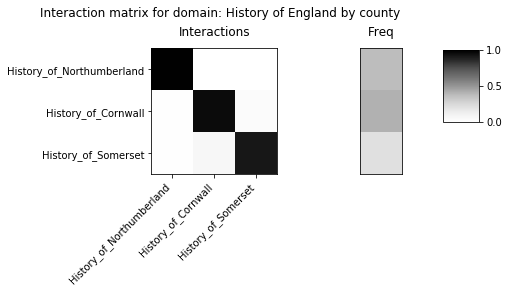

old domain idx
114
[6147, 2885, 14830]
new domain idx
68
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_68.npz


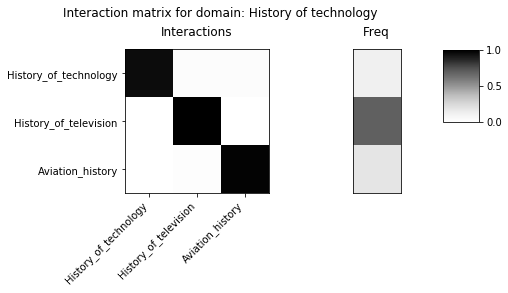

old domain idx
117
[4866, 9518, 9203, 2869, 9206]
new domain idx
69
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_69.npz


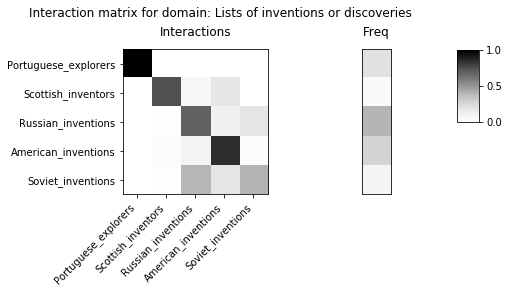

old domain idx
118
[4944, 530, 15295]
new domain idx
70
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_70.npz


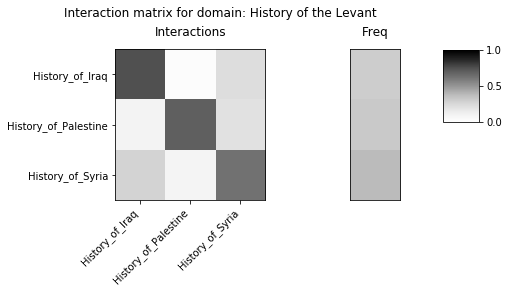

old domain idx
121
[8978, 508, 509, 511]
new domain idx
71
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_71.npz


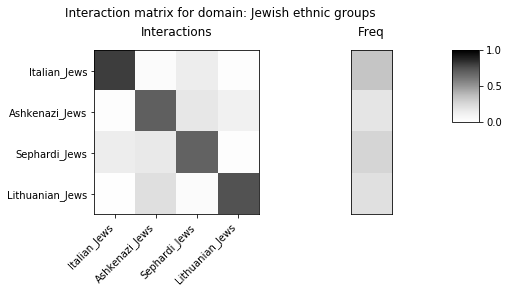

old domain idx
122
[520, 523, 507]
new domain idx
72
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_72.npz


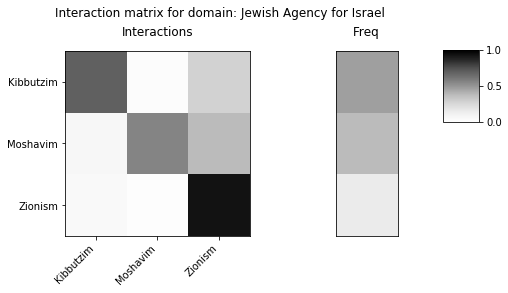

old domain idx
124
[14716, 1817, 507, 6187]
new domain idx
73
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_73.npz


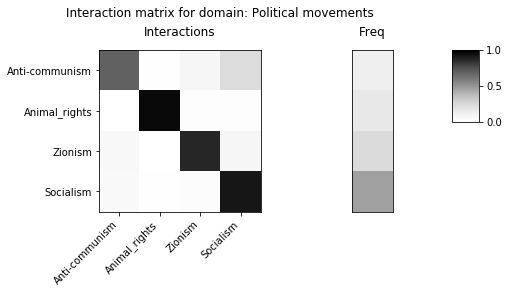

old domain idx
128
[6376, 6386, 14280]
new domain idx
74
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_74.npz


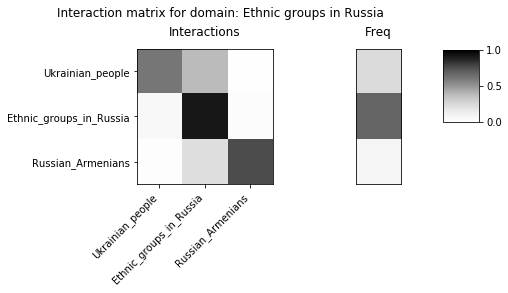

old domain idx
129
[13129, 2030, 3569, 14711, 11641, 509]
new domain idx
75
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_75.npz


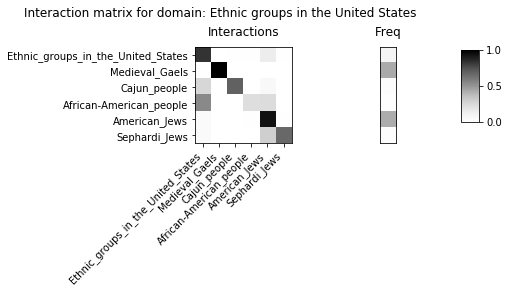

old domain idx
130
[532, 15989, 7142]
new domain idx
76
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_76.npz


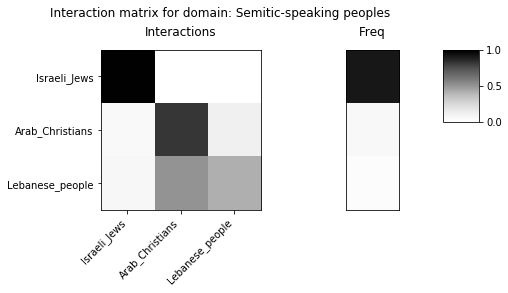

old domain idx
131
[12193, 7460, 4405]
new domain idx
77
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_77.npz


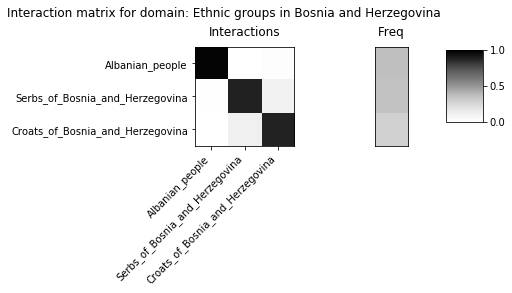

old domain idx
133
[10118, 5672, 3691, 13709, 2030]
new domain idx
78
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_78.npz


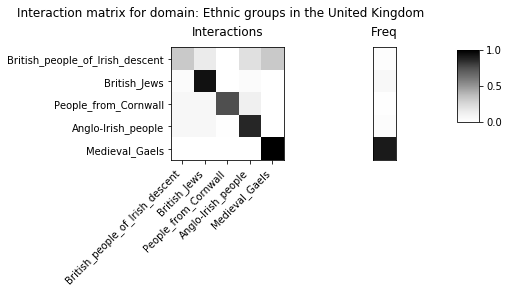

old domain idx
134
[11643, 12809, 7243, 1620]
new domain idx
79
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_79.npz


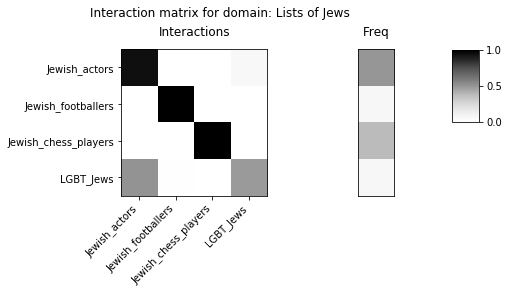

old domain idx
135
[15460, 2329, 14554, 14556, 14557, 16830]
new domain idx
80
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_80.npz


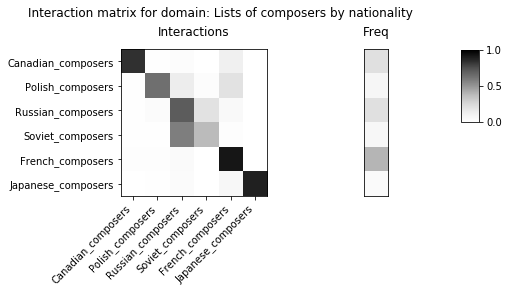

old domain idx
138
[15874, 6185, 6187, 3859, 696]
new domain idx
81
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_81.npz


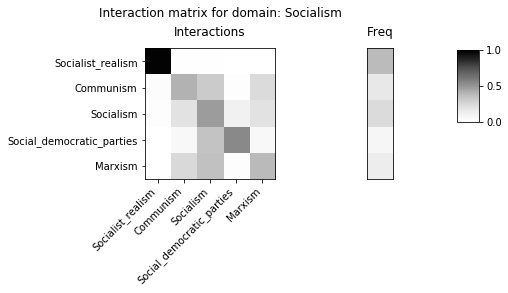

old domain idx
139
[641, 3786, 7978, 11213]
new domain idx
82
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_82.npz


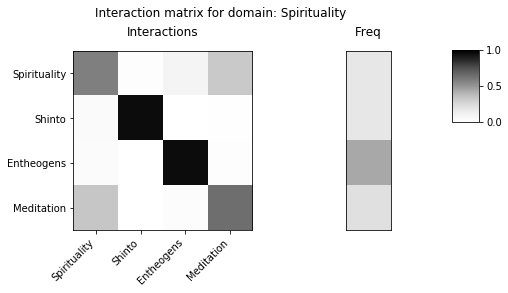

old domain idx
141
[7978, 11213, 606]
new domain idx
83
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_83.npz


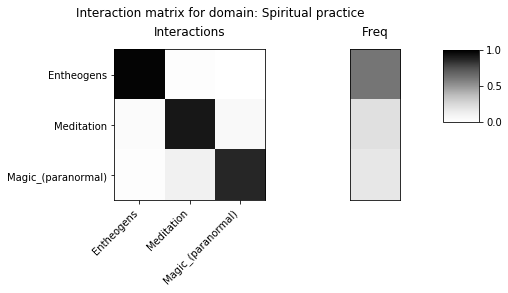

old domain idx
140
[7298, 6697, 14777, 4748, 1996, 14770, 7129, 14778, 14782]
new domain idx
84
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_84.npz


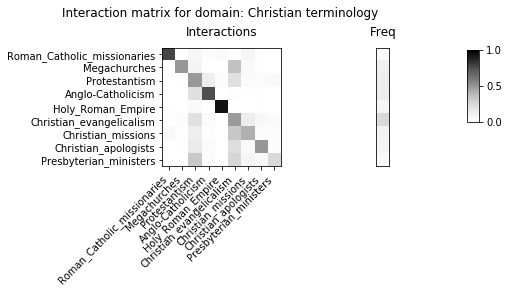

old domain idx
142
[608, 625, 1802]
new domain idx
85
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_85.npz


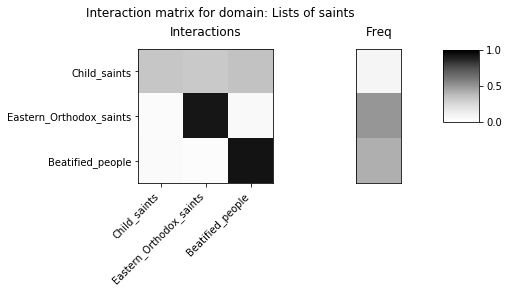

old domain idx
143
[9698, 12483, 9733, 9645, 15871]
new domain idx
86
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_86.npz


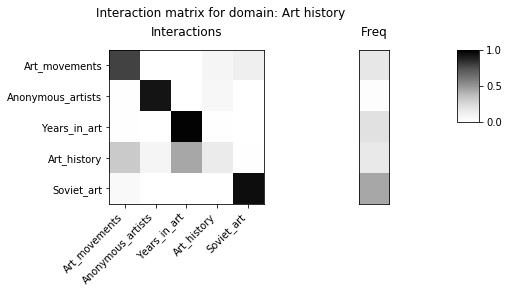

old domain idx
145
[6592, 648, 650, 686, 688]
new domain idx
87
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_87.npz


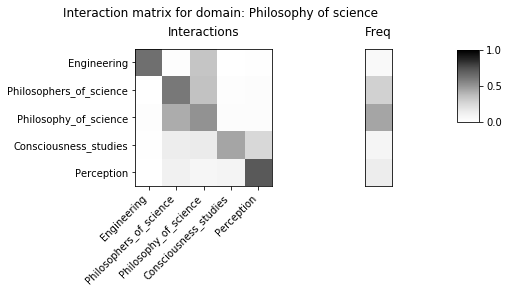

old domain idx
144
[674, 681, 686, 688, 10871, 670]
new domain idx
88
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_88.npz


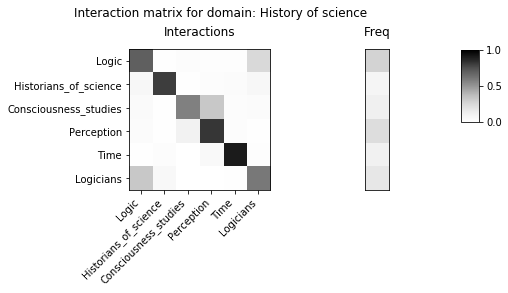

old domain idx
146
[688, 686, 10871]
new domain idx
89
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_89.npz


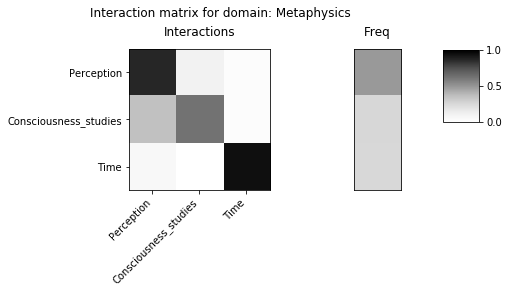

old domain idx
148
[673, 11213, 686, 688, 661]
new domain idx
90
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_90.npz


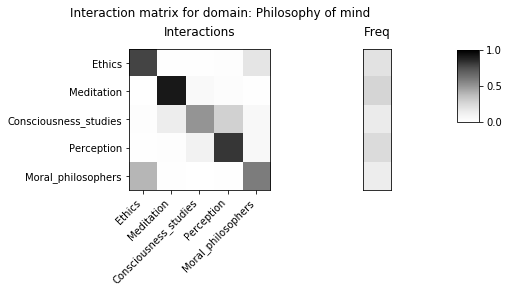

old domain idx
149
[9136, 16624, 8306, 4815]
new domain idx
91
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_91.npz


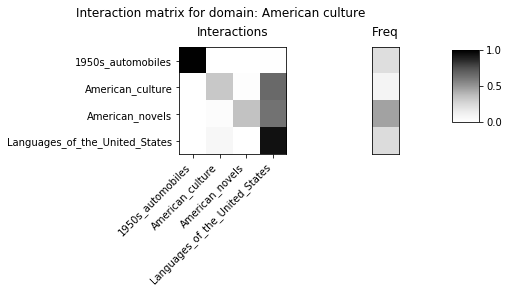

old domain idx
150
[14116, 648, 650, 686, 688]
new domain idx
92
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_92.npz


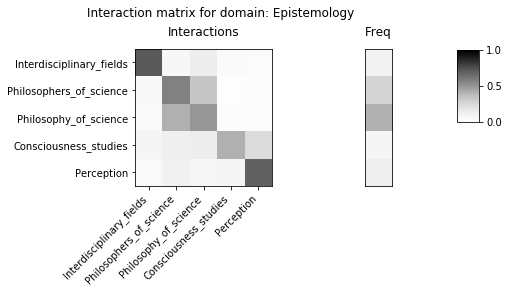

old domain idx
155
[688, 674, 670]
new domain idx
93
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_93.npz


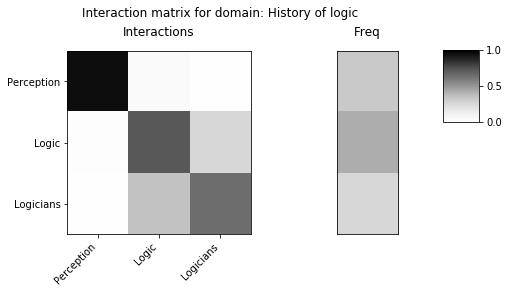

old domain idx
154
[673, 674, 686, 688, 8062, 661, 10871, 6712, 700, 670]
new domain idx
94
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_94.npz


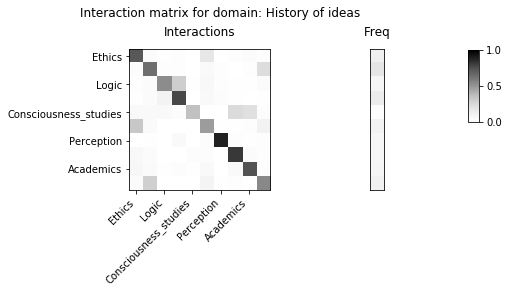

old domain idx
158
[696, 16225, 698]
new domain idx
95
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_95.npz


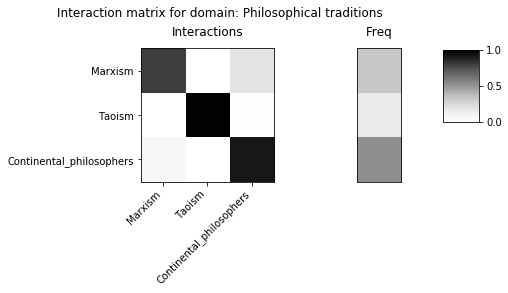

old domain idx
156
[673, 674, 686, 688, 661, 10871, 670]
new domain idx
96
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_96.npz


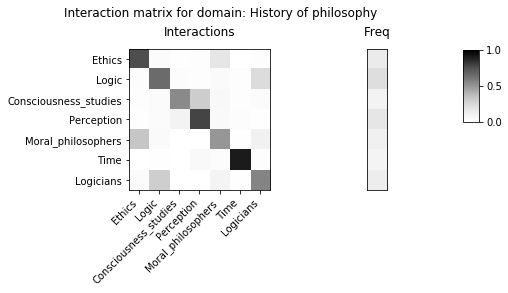

old domain idx
159
[674, 675, 15235, 719, 670]
new domain idx
97
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_97.npz


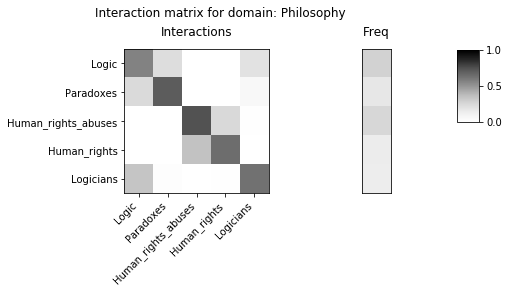

old domain idx
161
[673, 1634, 689, 691, 3859, 693, 695, 4824, 16636]
new domain idx
98
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_98.npz


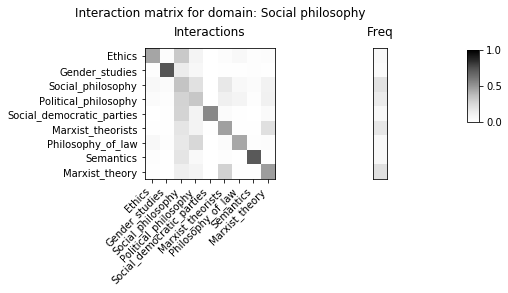

old domain idx
160
[1704, 673, 6592]
new domain idx
99
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_99.npz


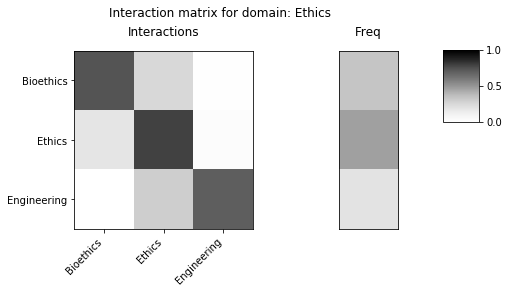

old domain idx
162
[9673, 699, 10892, 9694]
new domain idx
100
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_100.npz


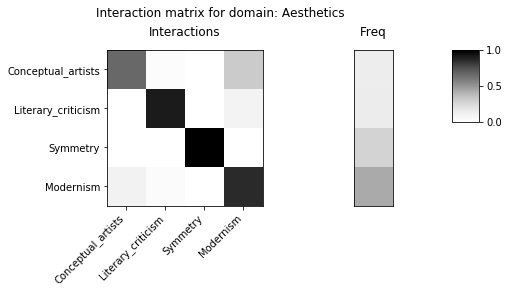

old domain idx
170
[688, 674, 675, 687]
new domain idx
101
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_101.npz


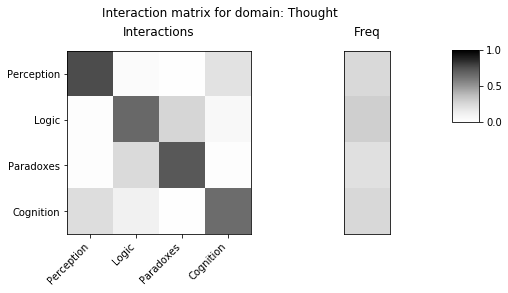

old domain idx
165
[674, 686, 688, 14805, 700]
new domain idx
102
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_102.npz


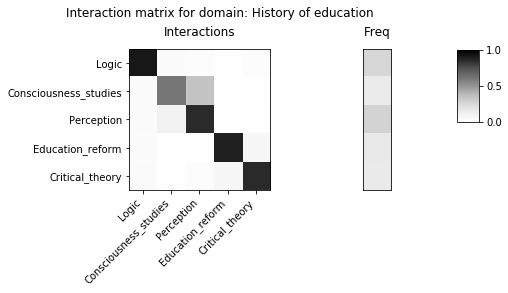

old domain idx
168
[674, 11213, 686, 687, 688]
new domain idx
103
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_103.npz


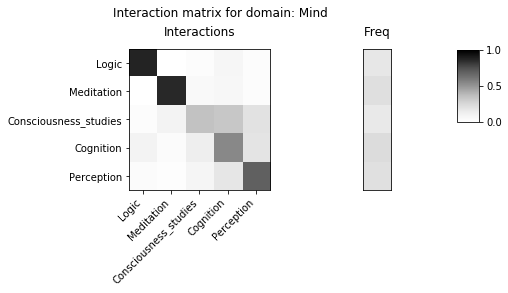

old domain idx
167
[688, 674, 675]
new domain idx
104
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_104.npz


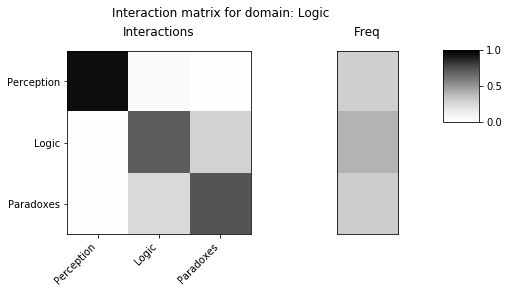

old domain idx
166
[10977, 674, 11015]
new domain idx
105
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_105.npz


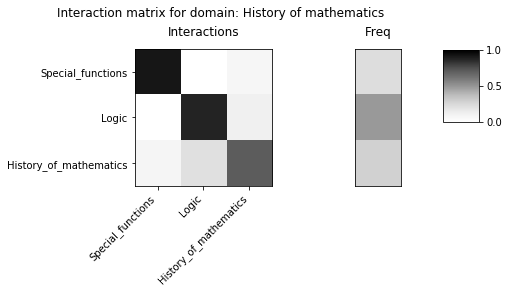

old domain idx
164
[6626, 674, 12777, 10956, 7408, 5043, 16563, 16629, 8059, 10940]
new domain idx
106
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_106.npz


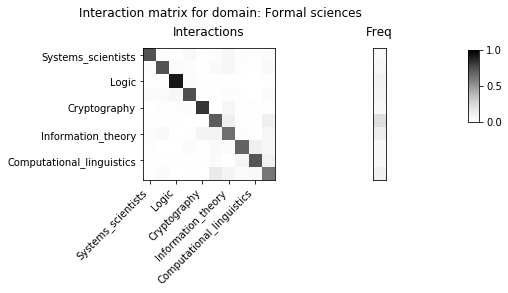

old domain idx
163
[688, 674, 675]
new domain idx
107
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_107.npz


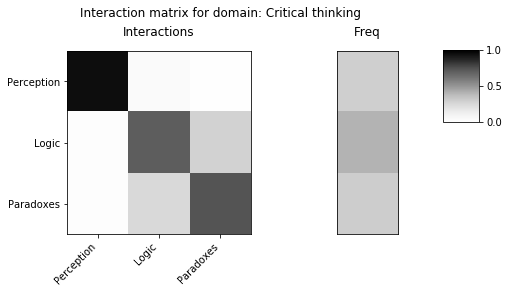

old domain idx
172
[6626, 6627, 4484, 10956, 2862, 10958, 16563]
new domain idx
108
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_108.npz


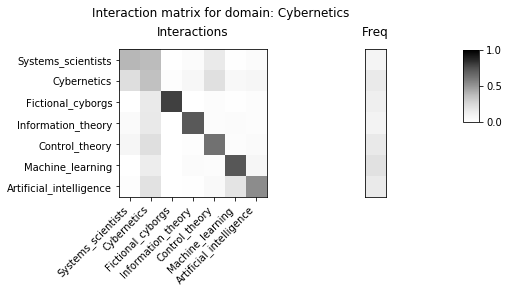

old domain idx
175
[688, 686, 10871]
new domain idx
109
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_109.npz


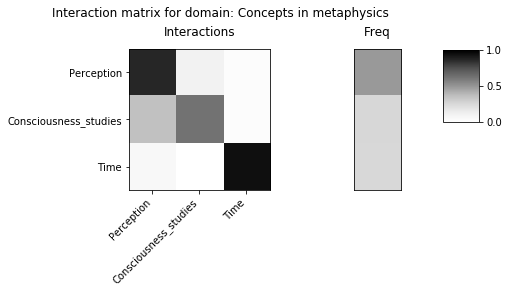

old domain idx
176
[4835, 687, 688, 7408, 6711, 4830]
new domain idx
110
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_110.npz


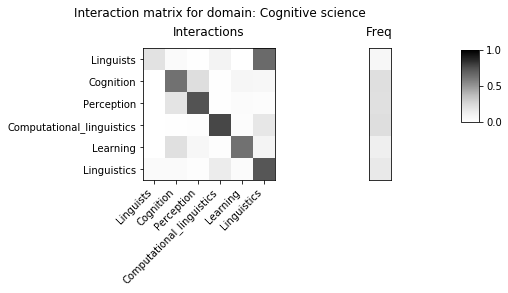

old domain idx
180
[6625, 6626, 12388]
new domain idx
111
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_111.npz


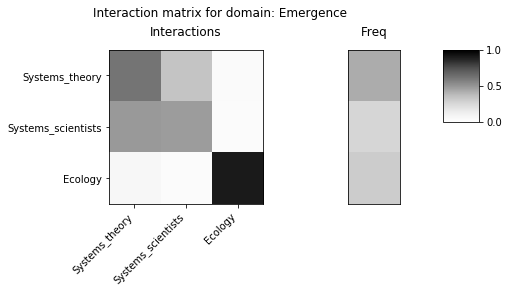

old domain idx
179
[11018, 11213, 10871]
new domain idx
112
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_112.npz


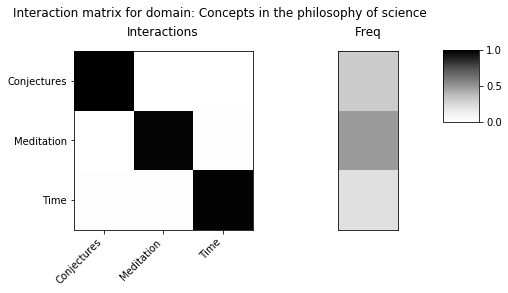

old domain idx
184
[13729, 1634, 6215, 4831]
new domain idx
113
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_113.npz


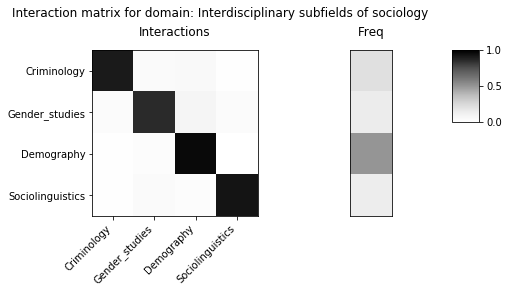

old domain idx
185
[15235, 6184, 12781, 719, 11097, 4958]
new domain idx
114
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_114.npz


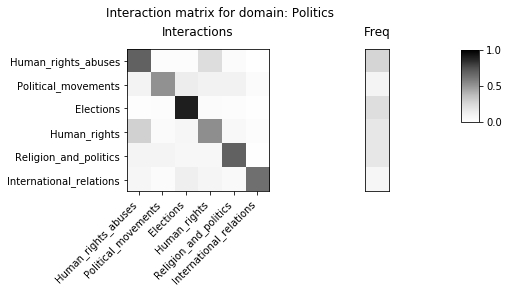

old domain idx
197
[6176, 11237, 1996, 17329, 16565, 13494, 16793, 15228, 6175]
new domain idx
115
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_115.npz


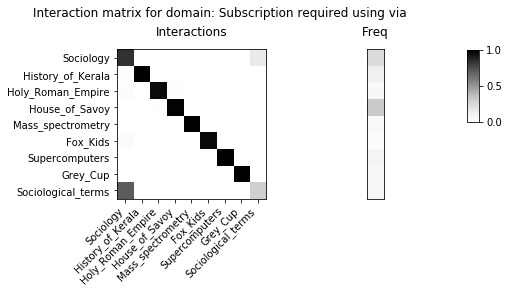

old domain idx
196
[6080, 6114, 11203, 6532, 14469, 4671, 6095, 5168, 11189, 11192, 16441, 6106, 8379, 6076, 11229, 6047]
new domain idx
116
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_116.npz


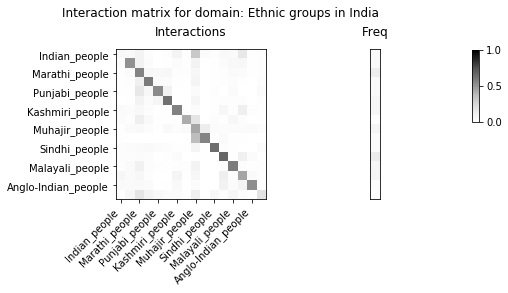

old domain idx
201
[4387, 5028, 7926, 4282, 5181]
new domain idx
117
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_117.npz


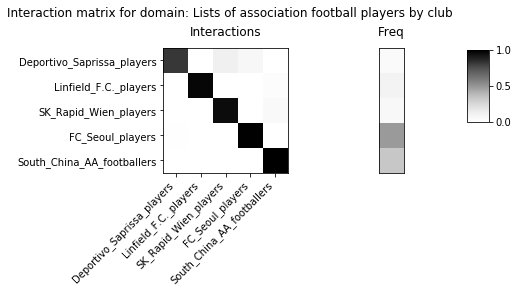

old domain idx
204
[14341, 16457, 16458, 16459, 1102]
new domain idx
118
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_118.npz


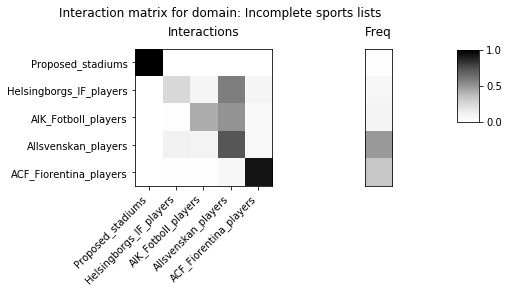

old domain idx
207
[12481, 13697, 13699, 13698, 15471, 15474]
new domain idx
119
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_119.npz


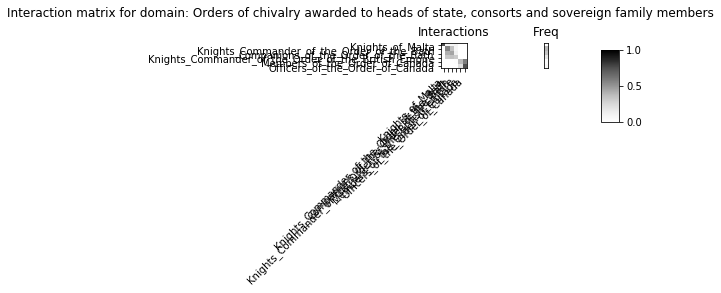

old domain idx
208
[1026, 996, 997, 1029, 1000, 1003, 1007, 1012, 1013, 1015, 1017]
new domain idx
120
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_120.npz


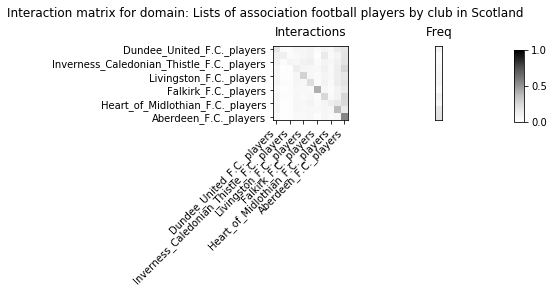

old domain idx
209
[8649, 10730, 10555, 14076]
new domain idx
121
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_121.npz


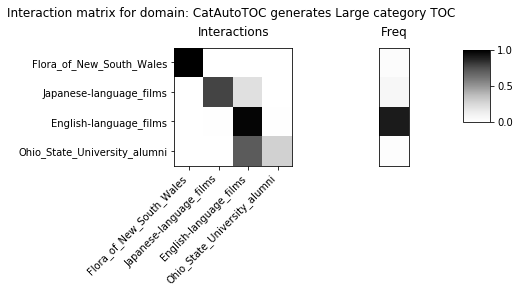

old domain idx
210
[1096, 1102, 1072, 1105, 1107, 1109, 1084]
new domain idx
122
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_122.npz


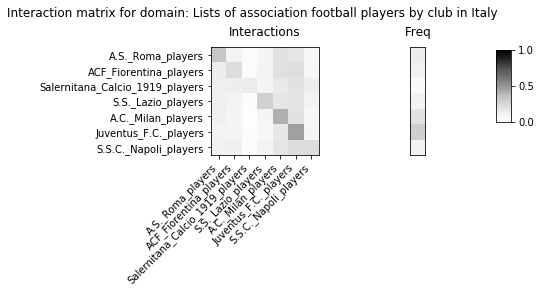

old domain idx
211
[15971, 4457, 7369, 16459, 1293]
new domain idx
123
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_123.npz


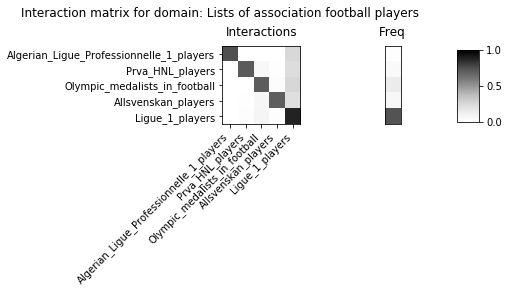

old domain idx
212
[8824, 5964, 4871]
new domain idx
124
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_124.npz


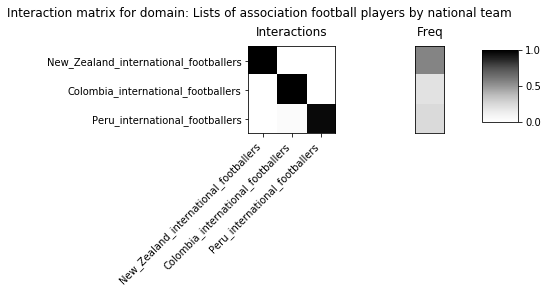

old domain idx
213
[13186, 6724, 3689, 1194, 17195, 3694, 14223]
new domain idx
125
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_125.npz


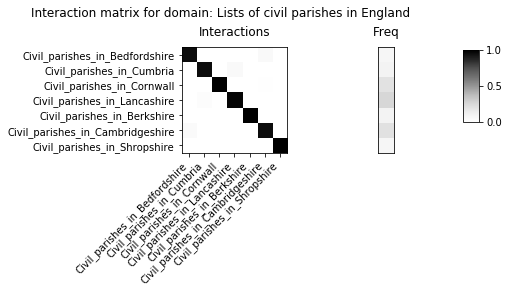

old domain idx
215
[4450, 16357, 6984, 5034, 1355, 11274, 3824, 2194, 4469, 13621, 12089, 11259]
new domain idx
126
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_126.npz


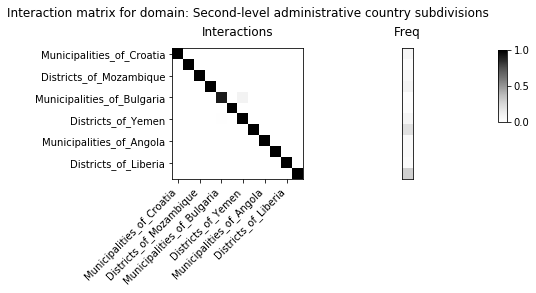

old domain idx
214
[4450, 6984, 6379, 8973, 9967, 3824, 2194, 4469]
new domain idx
127
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_127.npz


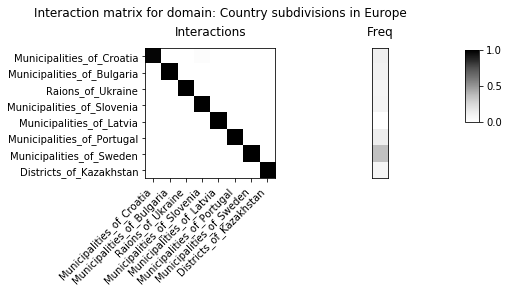

old domain idx
216
[1320, 1292, 1329, 1299, 1302]
new domain idx
128
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_128.npz


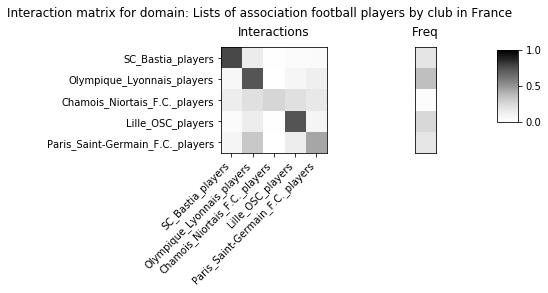

old domain idx
218
[5850, 1394, 1381, 14205]
new domain idx
129
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_129.npz


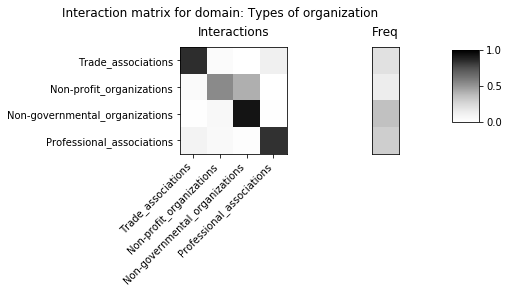

old domain idx
219
[11683, 16964, 11621, 4935, 2888, 2889, 16780, 2893, 6511, 12079, 16690, 11605, 9822, 8031]
new domain idx
130
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_130.npz


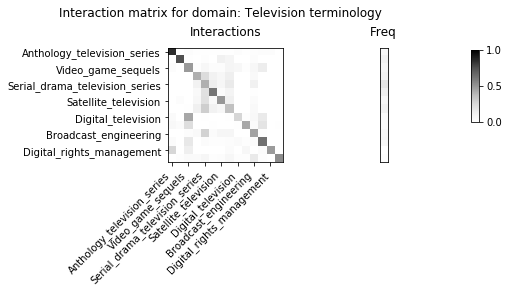

old domain idx
221
[13808, 13529, 11275, 13793]
new domain idx
131
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_131.npz


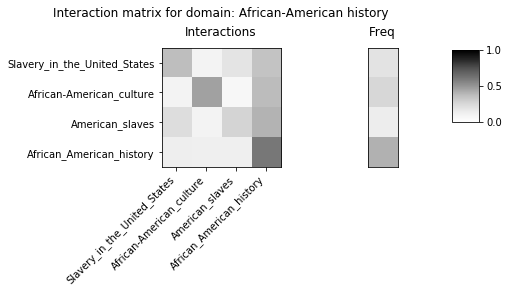

old domain idx
225
[4942, 4475, 4478]
new domain idx
132
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_132.npz


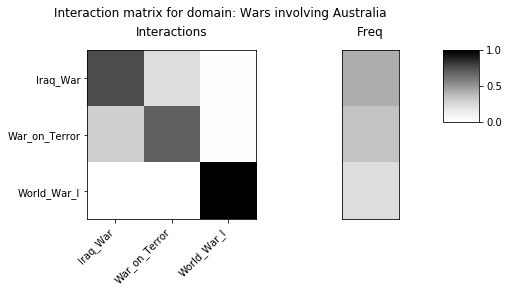

old domain idx
227
[4942, 4475, 4478]
new domain idx
133
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_133.npz


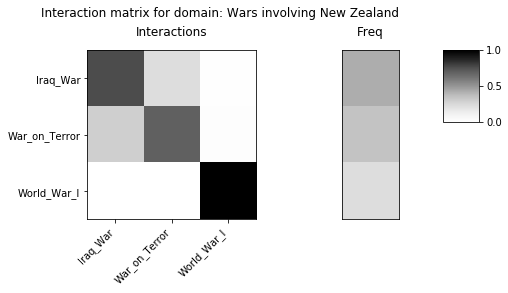

old domain idx
233
[5220, 5221, 5222, 16361, 3389]
new domain idx
134
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_134.npz


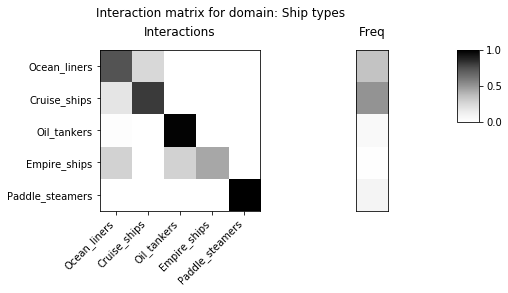

old domain idx
234
[6195, 13612, 12446, 10783]
new domain idx
135
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_135.npz


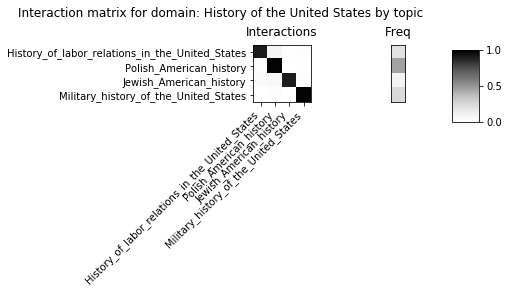

old domain idx
235
[9200, 14004, 1495]
new domain idx
136
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_136.npz


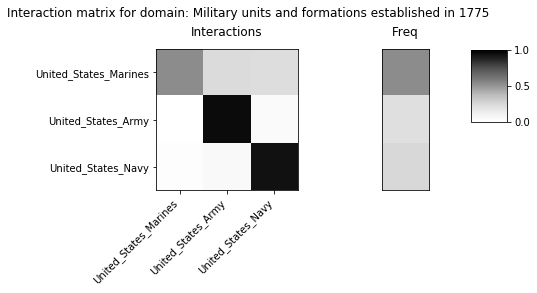

old domain idx
238
[2897, 7394, 2901]
new domain idx
137
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_137.npz


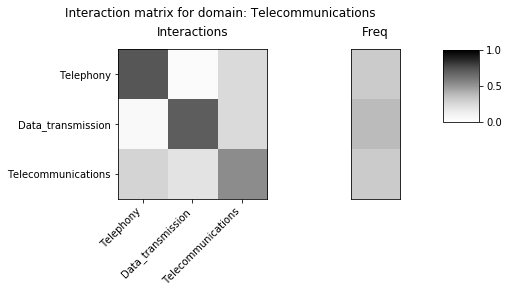

old domain idx
239
[8802, 16324, 14268, 2118]
new domain idx
138
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_138.npz


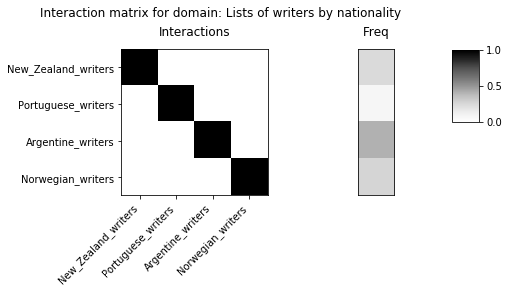

old domain idx
240
[8193, 7859, 1844]
new domain idx
139
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_139.npz


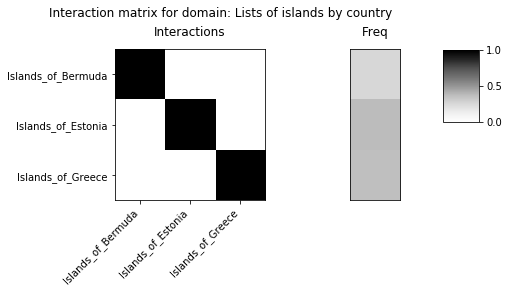

old domain idx
242
[14233, 12163, 5998]
new domain idx
140
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_140.npz


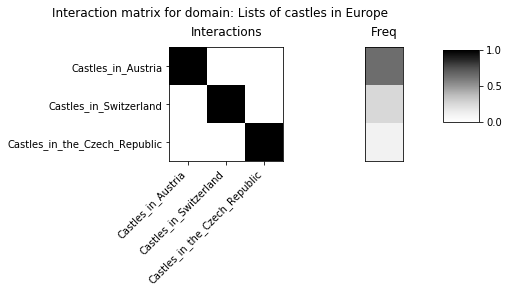

old domain idx
241
[14233, 12163, 5998]
new domain idx
141
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_141.npz


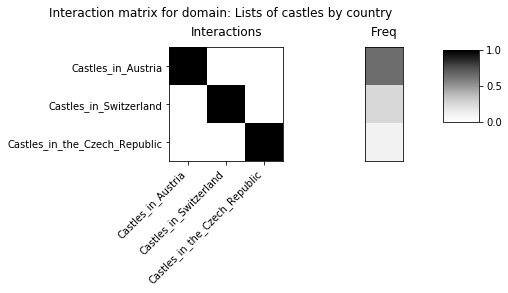

old domain idx
243
[7585, 13730, 6154, 9266, 7583]
new domain idx
142
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_142.npz


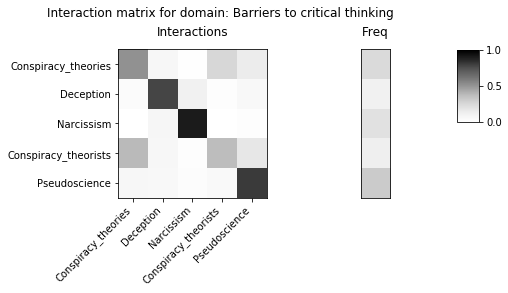

old domain idx
244
[8130, 8358, 8361, 8362, 12907, 17119, 8115, 8185, 8127]
new domain idx
143
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_143.npz


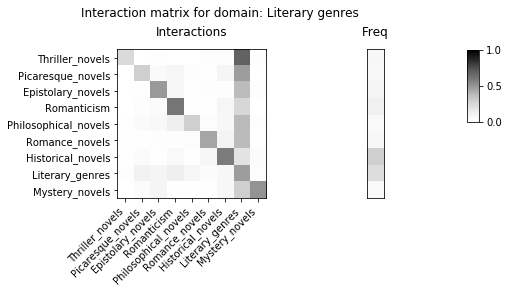

old domain idx
246
[2274, 11846, 7122, 11988, 11997]
new domain idx
144
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_144.npz


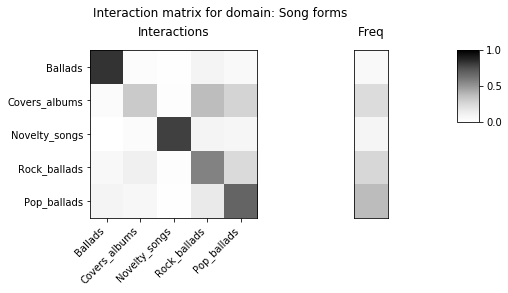

old domain idx
247
[4506, 2163, 7573, 7575]
new domain idx
145
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_145.npz


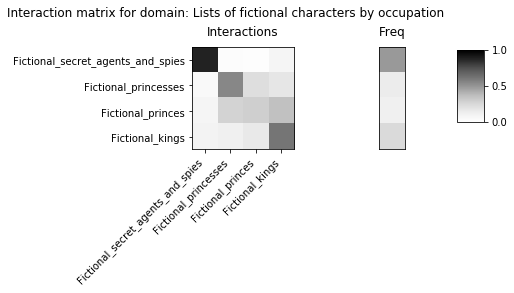

old domain idx
248
[1817, 1818, 2895]
new domain idx
146
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_146.npz


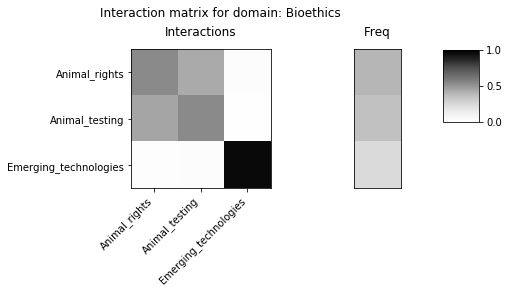

old domain idx
250
[12914, 6180, 6189]
new domain idx
147
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_147.npz


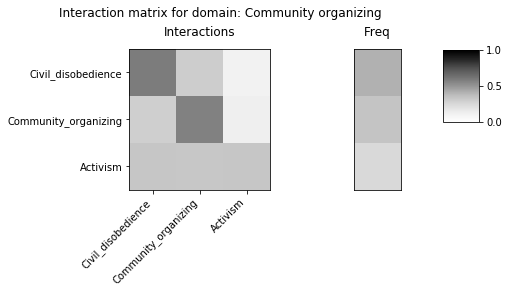

old domain idx
249
[16675, 6180, 16671]
new domain idx
148
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_148.npz


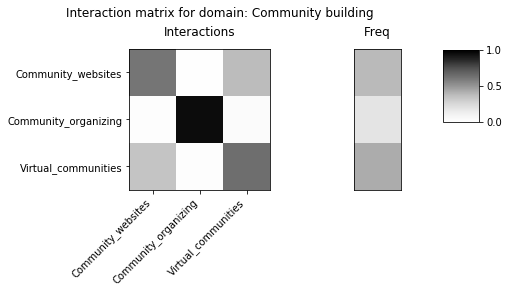

old domain idx
253
[1728, 5382, 5392, 5233, 5361]
new domain idx
149
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_149.npz


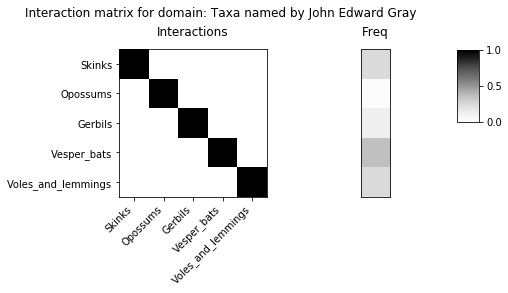

old domain idx
256
[2878, 12264, 2270, 14575]
new domain idx
150
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_150.npz


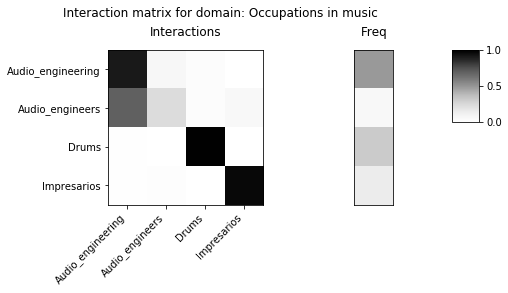

old domain idx
257
[6802, 8422, 13183]
new domain idx
151
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_151.npz


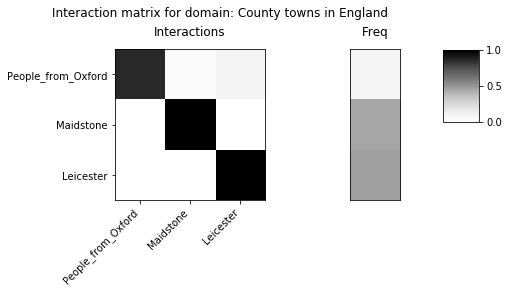

old domain idx
258
[3801, 3866, 11468, 11471]
new domain idx
152
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_152.npz


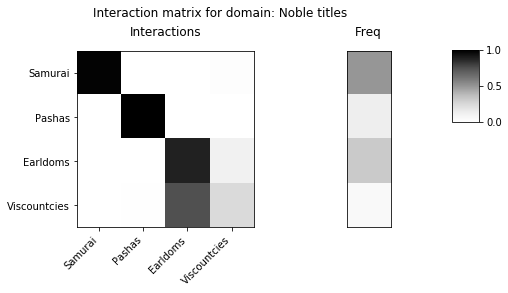

old domain idx
261
[11234, 11748, 3788, 16242, 7575]
new domain idx
153
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_153.npz


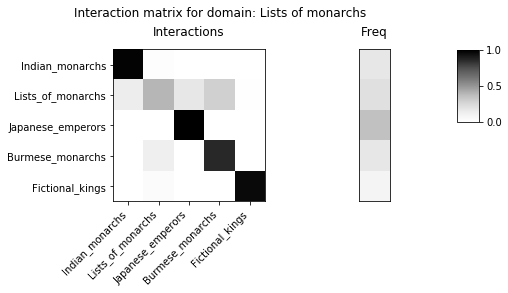

old domain idx
265
[14466, 2341, 12200, 8975, 7024, 15923, 8345]
new domain idx
154
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_154.npz


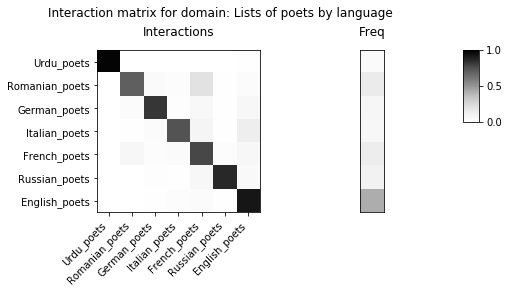

old domain idx
266
[14466, 8295, 6631, 8345, 9532, 9533]
new domain idx
155
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_155.npz


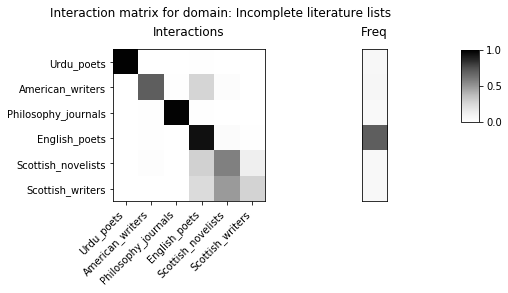

old domain idx
267
[8384, 15917, 15919, 15920, 7036]
new domain idx
156
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_156.npz


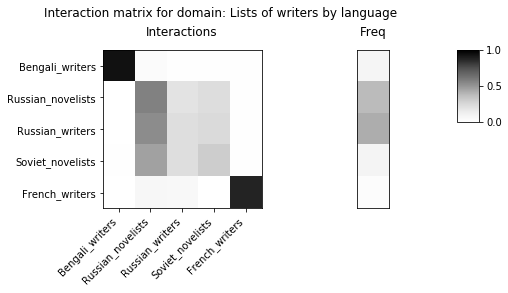

old domain idx
268
[9624, 16235, 14485, 9648]
new domain idx
157
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_157.npz


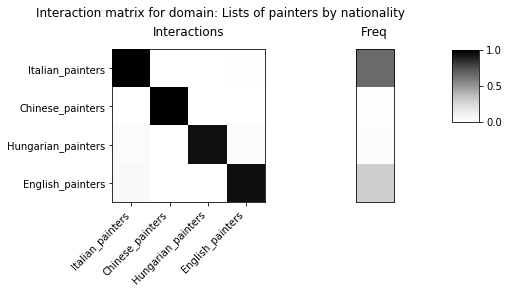

old domain idx
270
[13728, 16449, 13157, 11750, 4626]
new domain idx
158
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_158.npz


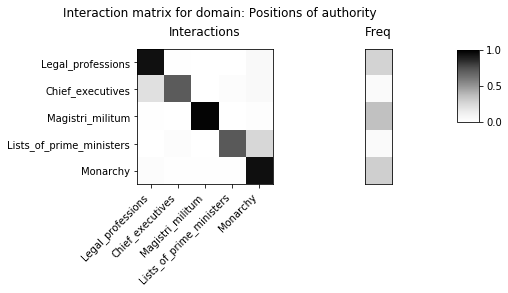

old domain idx
269
[4626, 4627, 17323]
new domain idx
159
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_159.npz


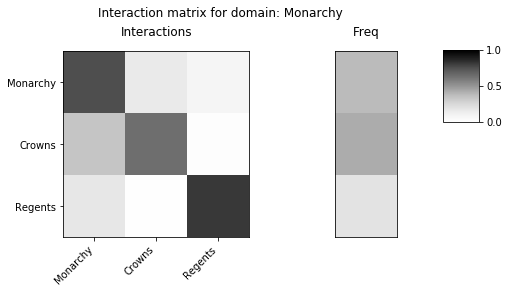

old domain idx
272
[1880, 4946, 9821]
new domain idx
160
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_160.npz


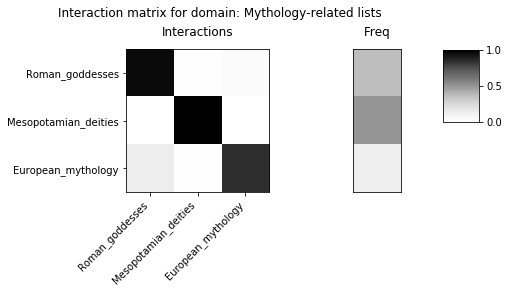

old domain idx
271
[1880, 4946, 16431]
new domain idx
161
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_161.npz


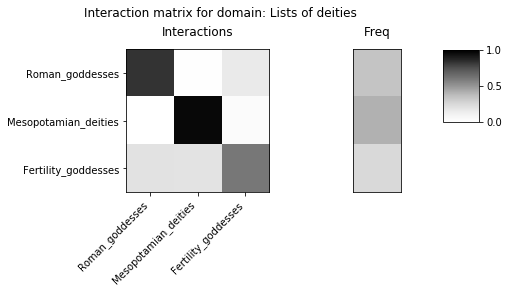

old domain idx
274
[4802, 6964, 17206, 11158, 4796]
new domain idx
162
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_162.npz


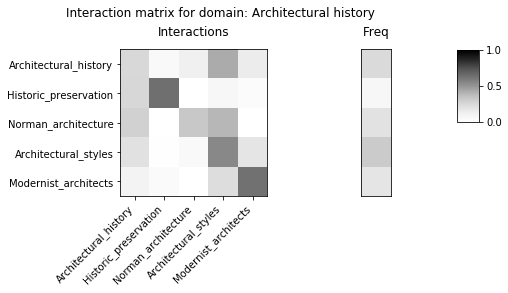

old domain idx
280
[11184, 5459, 4363]
new domain idx
163
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_163.npz


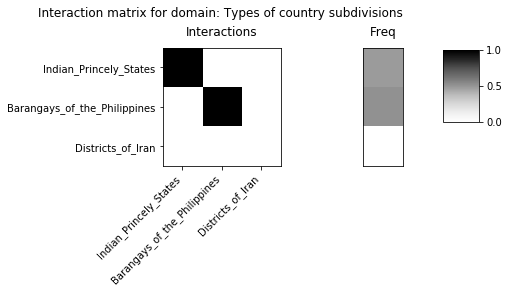

old domain idx
282
[9760, 9763, 12676, 9766, 9577, 16332, 9791, 9742, 9774, 9745, 9777, 6740, 9239, 9756, 14430, 9279]
new domain idx
164
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_164.npz


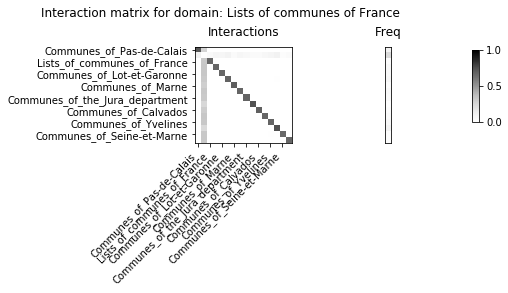

old domain idx
288
[4833, 8361, 9660, 9231]
new domain idx
165
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_165.npz


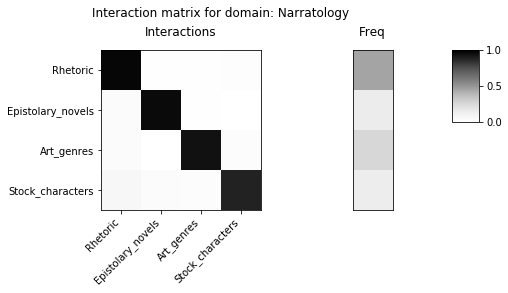

old domain idx
287
[10472, 10346, 12612, 10733]
new domain idx
166
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_166.npz


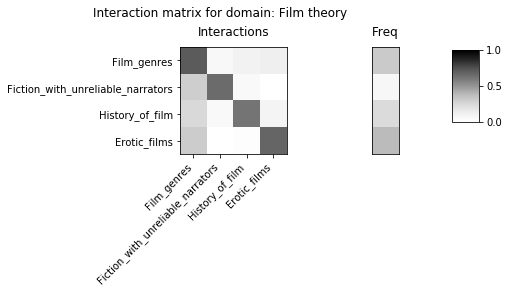

old domain idx
289
[10472, 12818, 9660, 17078]
new domain idx
167
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_167.npz


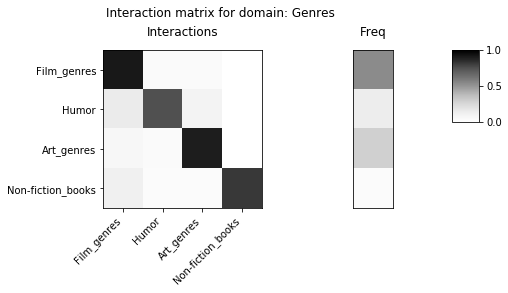

old domain idx
290
[8362, 2162, 16350]
new domain idx
168
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_168.npz


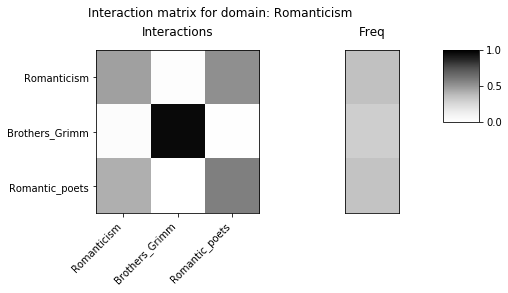

old domain idx
291
[17058, 6554, 4484, 8166]
new domain idx
169
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_169.npz


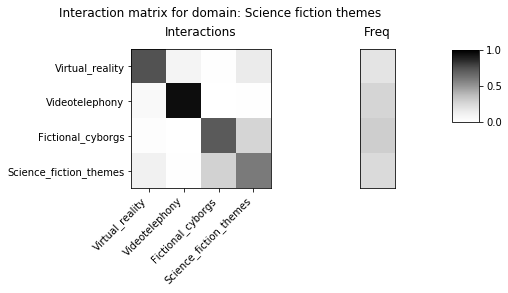

old domain idx
292
[15872, 9680, 14485, 15869, 15870]
new domain idx
170
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_170.npz


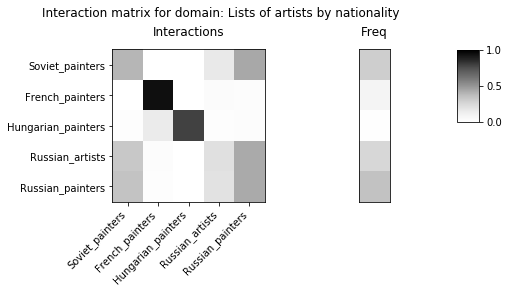

old domain idx
293
[5953, 4708, 13576, 8394, 7950, 9775, 15987, 13620, 6423, 12702]
new domain idx
171
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_171.npz


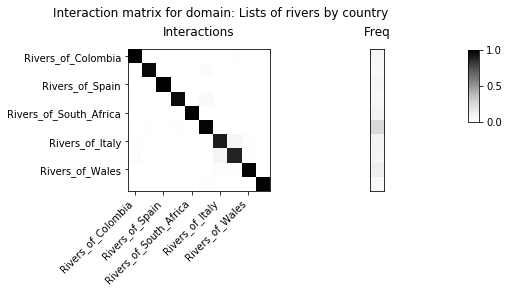

old domain idx
294
[4400, 12160, 15890, 3893]
new domain idx
172
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_172.npz


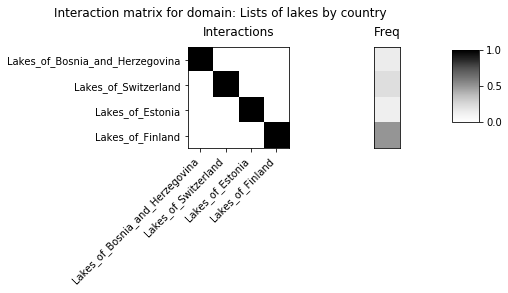

old domain idx
295
[7904, 4851, 13567]
new domain idx
173
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_173.npz


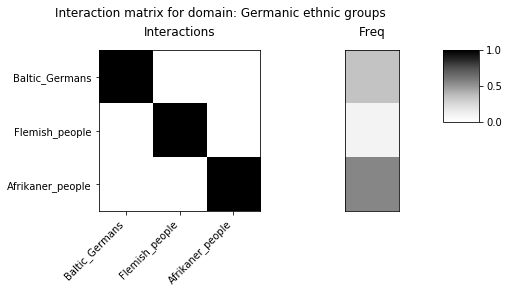

old domain idx
301
[2274, 11988, 11997]
new domain idx
174
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_174.npz


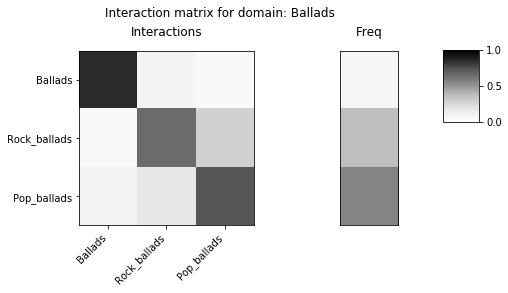

old domain idx
305
[11683, 2953, 16427, 11988, 7062, 11997]
new domain idx
175
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_175.npz


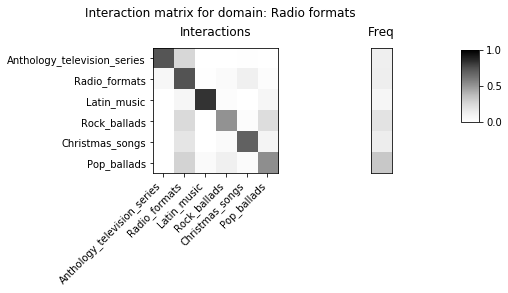

old domain idx
302
[11988, 6524, 11997]
new domain idx
176
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_176.npz


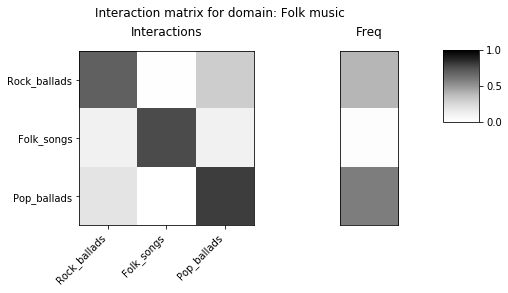

old domain idx
308
[15904, 15905, 15907]
new domain idx
177
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_177.npz


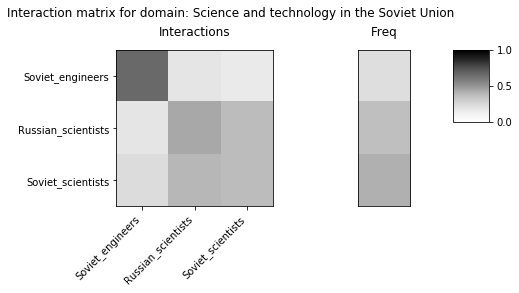

old domain idx
310
[12168, 3825, 4364, 7877]
new domain idx
178
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_178.npz


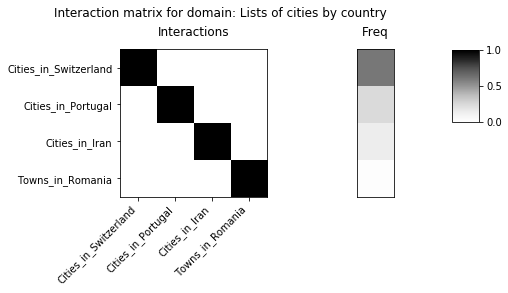

old domain idx
311
[12168, 6380, 7877]
new domain idx
179
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_179.npz


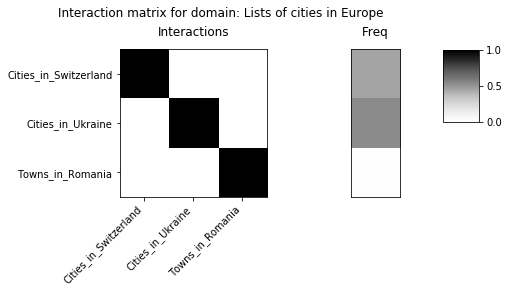

old domain idx
314
[2419, 2403, 2572]
new domain idx
180
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_180.npz


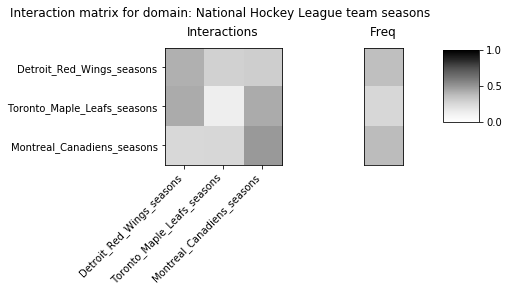

old domain idx
313
[2419, 2403, 2572]
new domain idx
181
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_181.npz


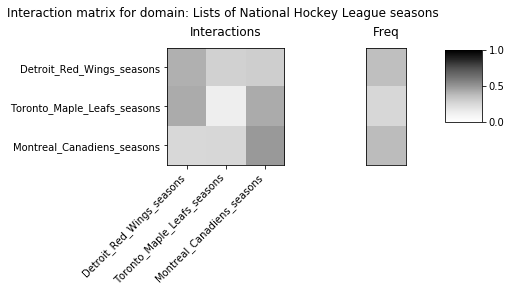

old domain idx
317
[2690, 3202, 3427, 14844, 13993, 3212, 3533, 2703, 12719, 3313, 3413, 2999, 3003, 4380]
new domain idx
182
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_182.npz


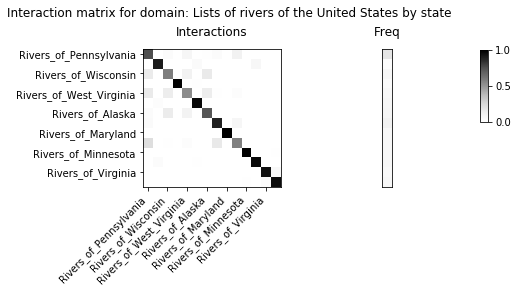

old domain idx
318
[14728, 7564, 3061, 14108]
new domain idx
183
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_183.npz


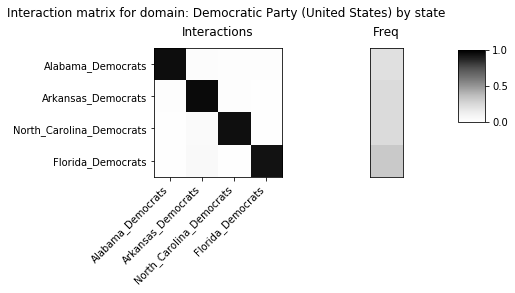

old domain idx
319
[14808, 12219, 14948, 13590]
new domain idx
184
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_184.npz


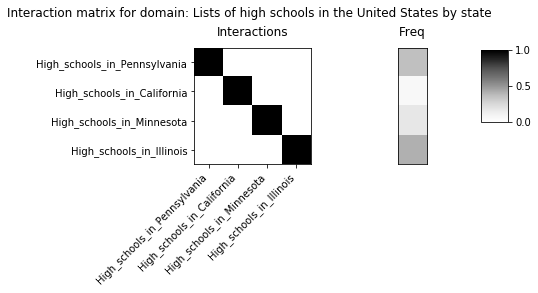

old domain idx
323
[3083, 3356, 13967]
new domain idx
185
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_185.npz


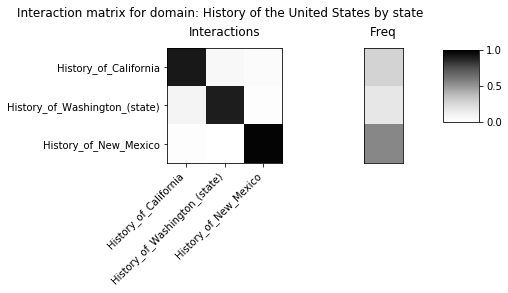

old domain idx
327
[14939, 14996, 14997]
new domain idx
186
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_186.npz


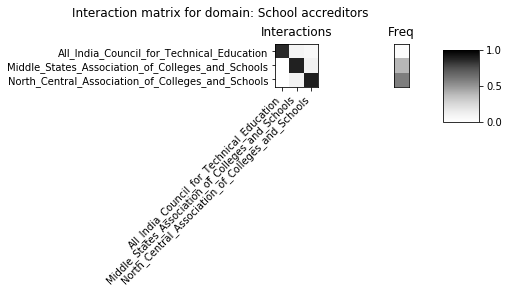

old domain idx
326
[14996, 14997, 14934]
new domain idx
187
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_187.npz


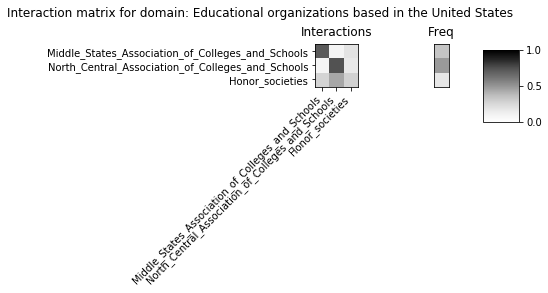

old domain idx
328
[14976, 15010, 8190]
new domain idx
188
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_188.npz


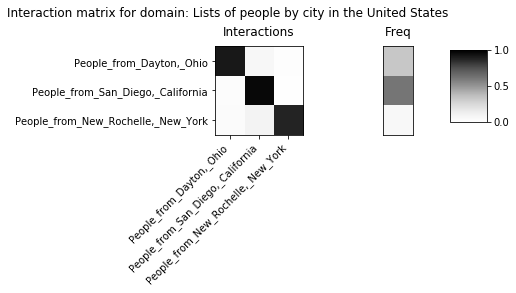

old domain idx
329
[2832, 3459, 3211, 2936]
new domain idx
189
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_189.npz


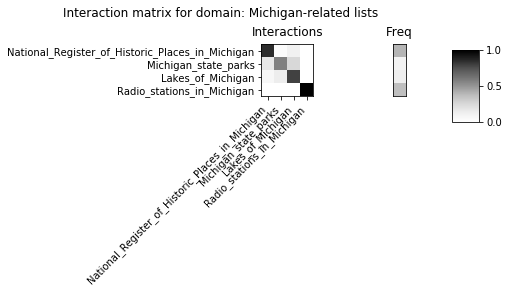

old domain idx
330
[12251, 4379, 3206]
new domain idx
190
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_190.npz


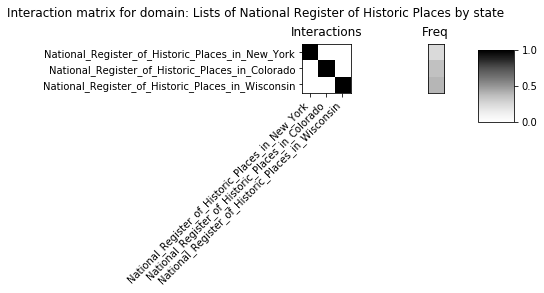

old domain idx
331
[16768, 7393, 17058, 2916, 16777, 8718, 10896, 16689, 16753, 16787, 16791, 16793, 8762]
new domain idx
191
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_191.npz


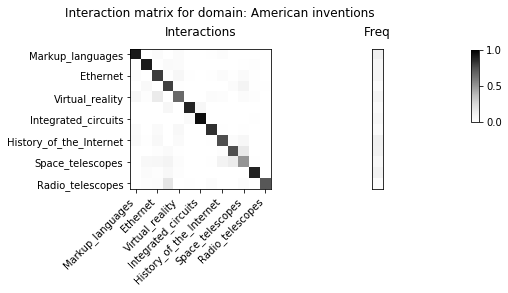

old domain idx
335
[2872, 2889, 2876, 2879]
new domain idx
192
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_192.npz


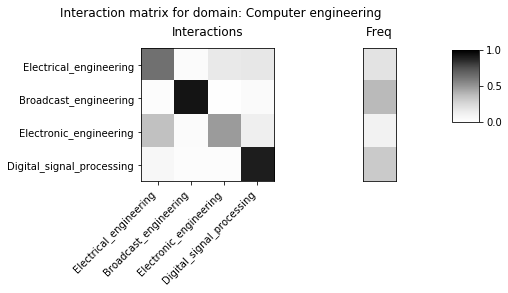

old domain idx
336
[2875, 16565, 2894]
new domain idx
193
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_193.npz


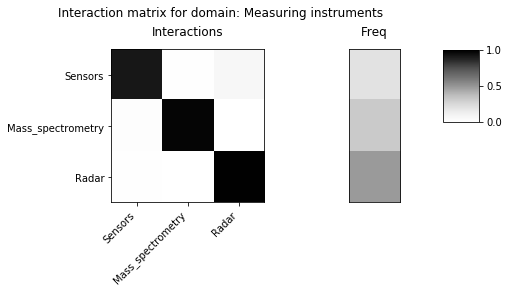

old domain idx
337
[2872, 2876, 11149, 2871]
new domain idx
194
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_194.npz


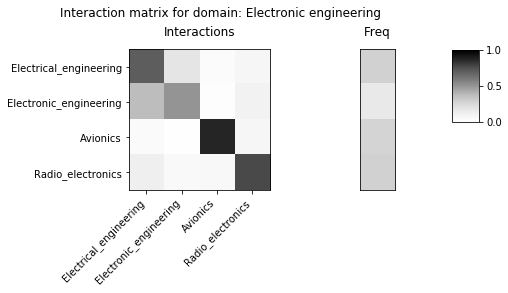

old domain idx
338
[14392, 7394, 2884, 2901]
new domain idx
195
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_195.npz


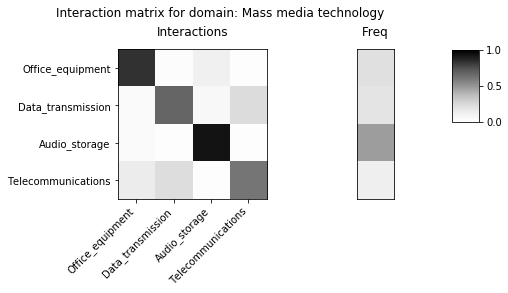

old domain idx
341
[2872, 2873, 2876]
new domain idx
196
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_196.npz


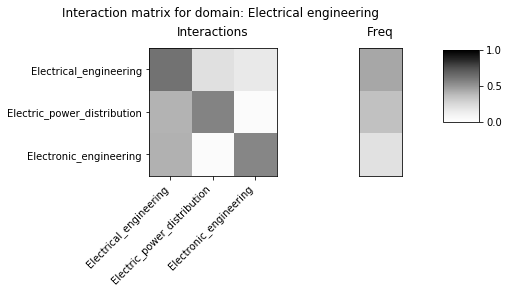

old domain idx
342
[6592, 10922, 6623]
new domain idx
197
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_197.npz


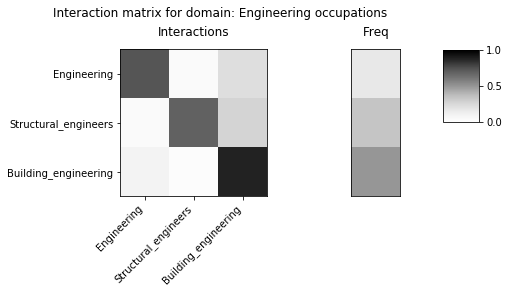

old domain idx
340
[12264, 2889, 2878]
new domain idx
198
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_198.npz


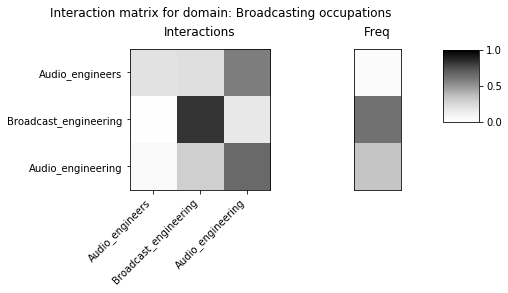

old domain idx
343
[16774, 2893, 2903, 2904, 2907, 16798]
new domain idx
199
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_199.npz


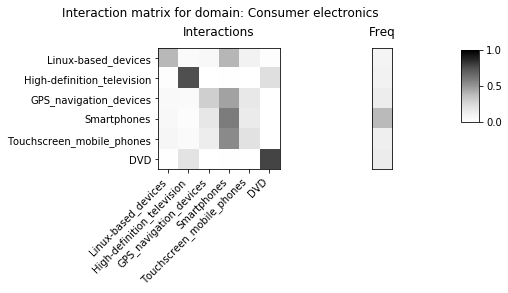

old domain idx
344
[12264, 14530, 2883, 2884]
new domain idx
200
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_200.npz


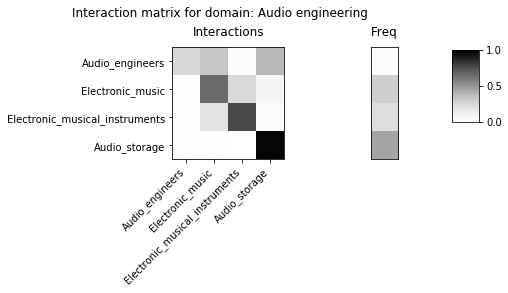

old domain idx
345
[12264, 5474, 10542]
new domain idx
201
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_201.npz


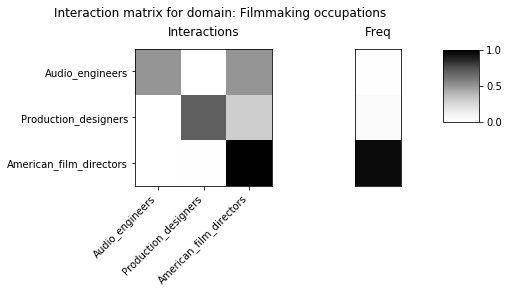

old domain idx
346
[12264, 6597, 10542]
new domain idx
202
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_202.npz


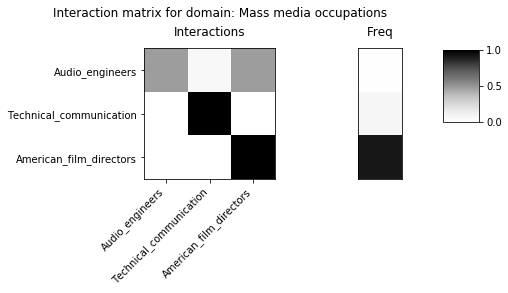

old domain idx
348
[2914, 2916, 16782, 16786]
new domain idx
203
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_203.npz


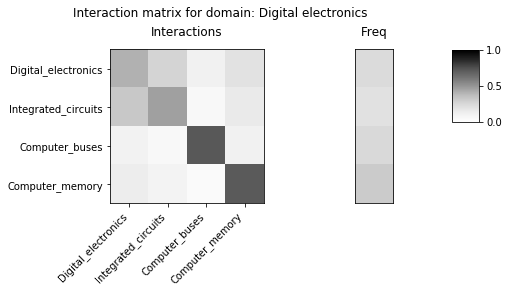

old domain idx
347
[6144, 10956, 6583]
new domain idx
204
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_204.npz


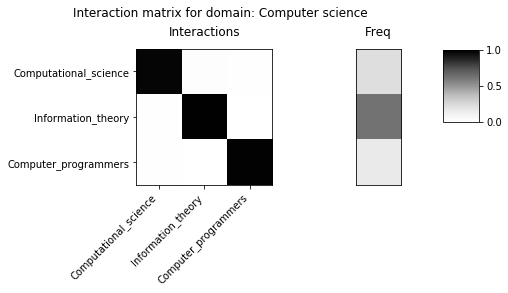

old domain idx
349
[14530, 11846, 7122, 11988, 11997]
new domain idx
205
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_205.npz


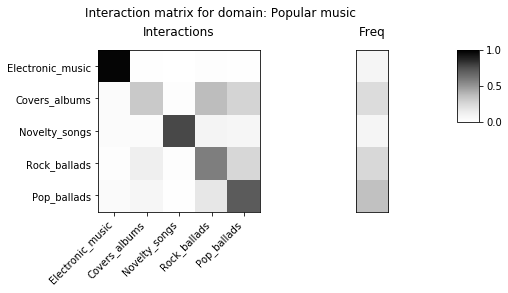

old domain idx
350
[2888, 2901, 2893, 4935]
new domain idx
206
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_206.npz


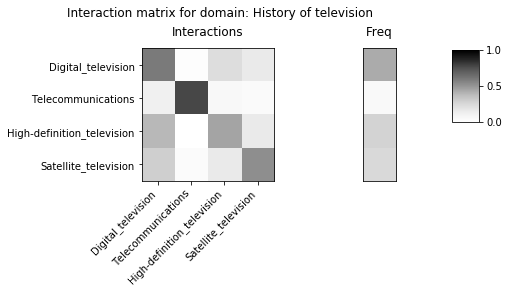

old domain idx
353
[3777, 2893, 16688, 16690, 6554, 10685]
new domain idx
207
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_207.npz


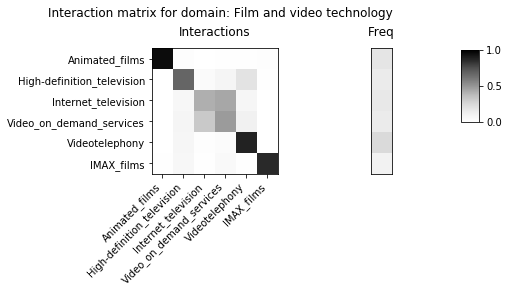

old domain idx
356
[16679, 16681, 16563, 6714, 6554]
new domain idx
208
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_208.npz


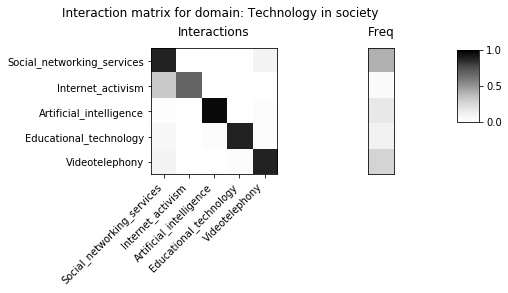

old domain idx
359
[16705, 8762, 2916, 9181]
new domain idx
209
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_209.npz


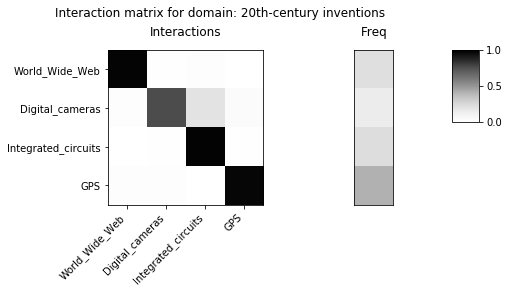

old domain idx
361
[2906, 2907, 6554]
new domain idx
210
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_210.npz


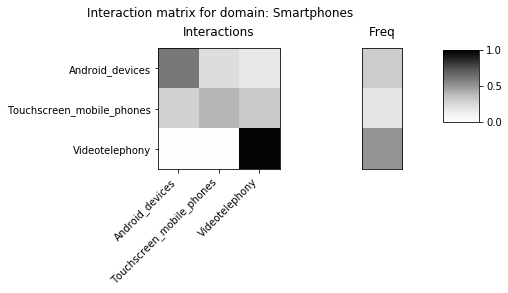

old domain idx
363
[16746, 16749, 6559]
new domain idx
211
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_211.npz


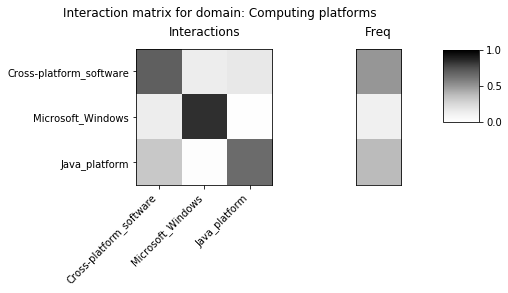

old domain idx
367
[10402, 3415, 3399]
new domain idx
212
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_212.npz


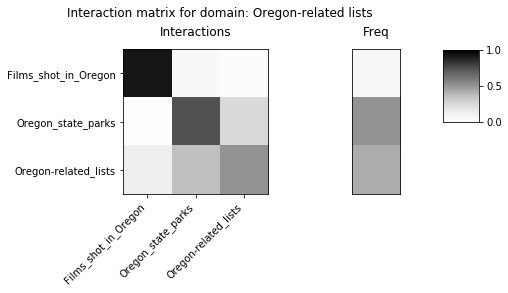

old domain idx
368
[3169, 3397, 7557, 3144, 3147, 7570, 3285, 4375, 3192, 3166]
new domain idx
213
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_213.npz


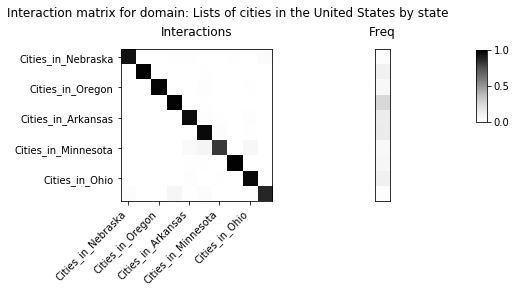

old domain idx
370
[3018, 3013, 3022]
new domain idx
214
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_214.npz


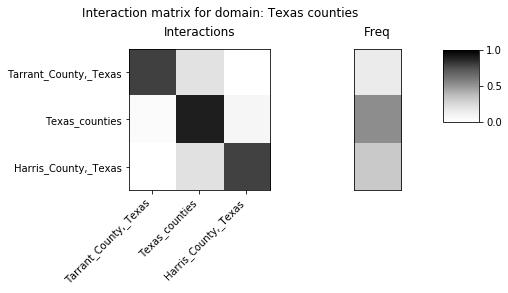

old domain idx
371
[3155, 3157, 3523, 7567]
new domain idx
215
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_215.npz


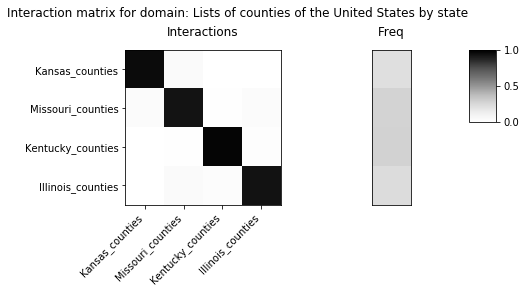

old domain idx
373
[3121, 3083, 3079]
new domain idx
216
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_216.npz


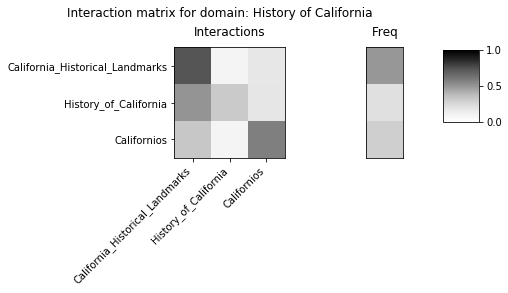

old domain idx
378
[13848, 13602, 14055]
new domain idx
217
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_217.npz


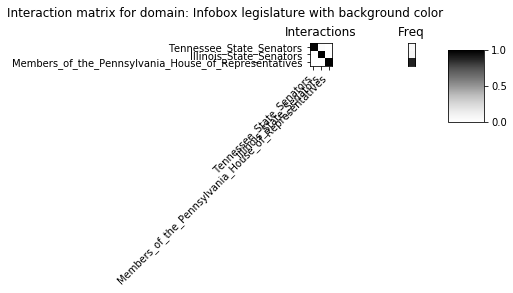

old domain idx
381
[3138, 3635, 3394]
new domain idx
218
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_218.npz


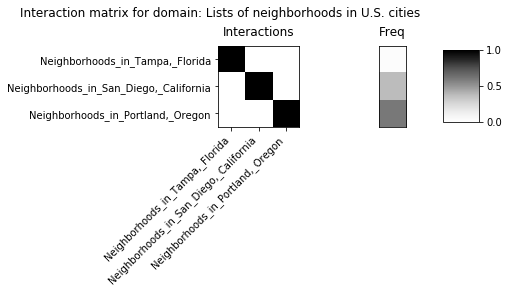

old domain idx
382
[3371, 3508, 12254, 14095]
new domain idx
219
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_219.npz


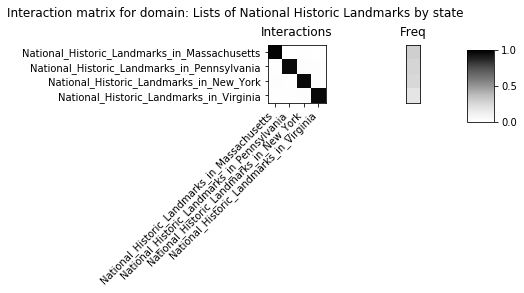

old domain idx
386
[16264, 14795, 3506, 3378, 13719, 10876, 5022]
new domain idx
220
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_220.npz


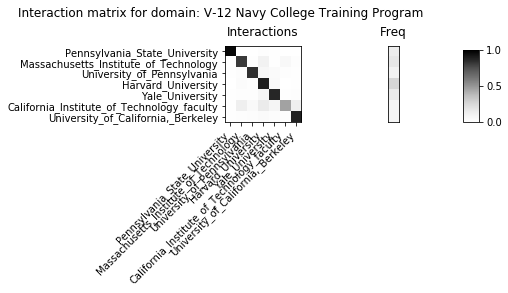

old domain idx
385
[3506, 3378, 13719]
new domain idx
221
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_221.npz


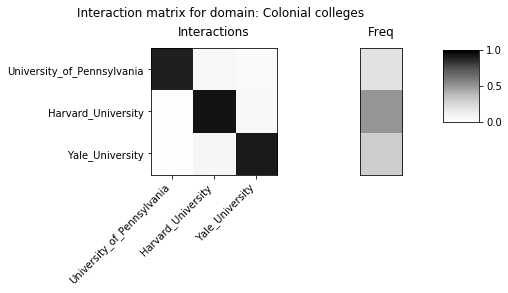

old domain idx
387
[9784, 5857, 14801, 3671]
new domain idx
222
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_222.npz


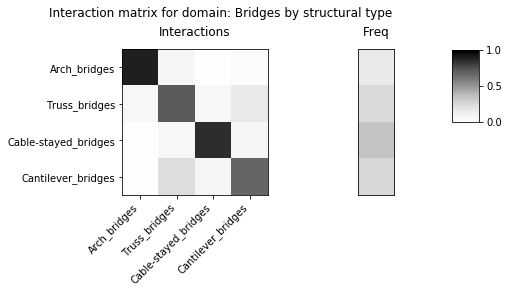

old domain idx
388
[12232, 11156, 11159, 11160, 17215]
new domain idx
223
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_223.npz


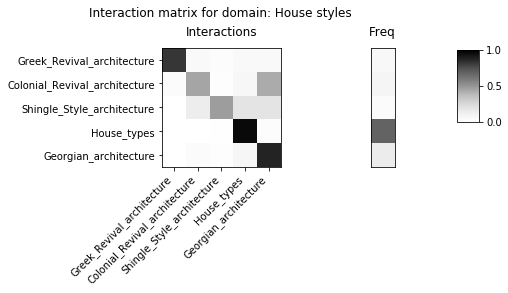

old domain idx
389
[12263, 12232, 6352, 11156, 6356]
new domain idx
224
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_224.npz


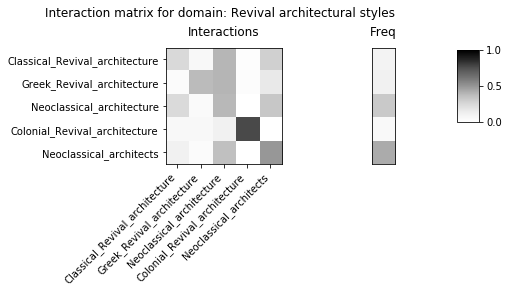

old domain idx
392
[3520, 8389, 4643, 8053]
new domain idx
225
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_225.npz


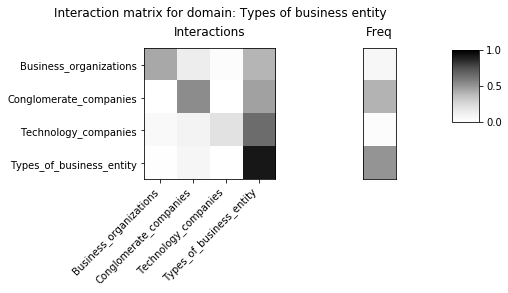

old domain idx
390
[3520, 8053, 14823]
new domain idx
226
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_226.npz


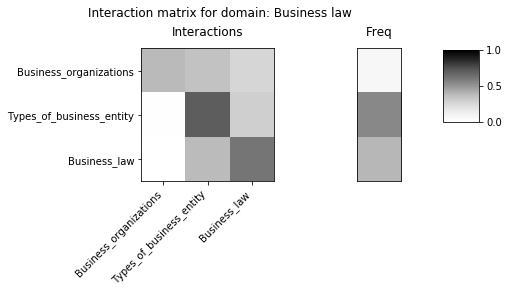

old domain idx
394
[14823, 8053, 8079]
new domain idx
227
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_227.npz


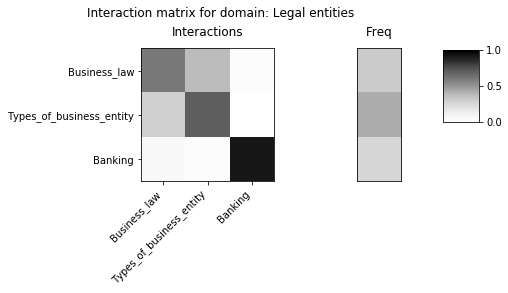

old domain idx
395
[10776, 10777, 16375, 15607]
new domain idx
228
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_228.npz


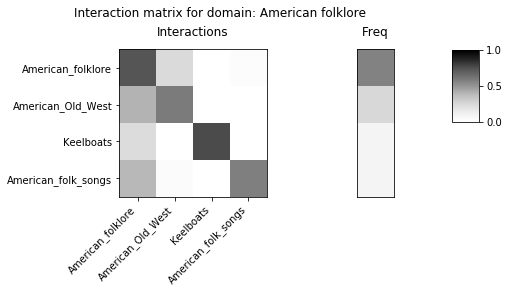

old domain idx
397
[4481, 10917, 10809]
new domain idx
229
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_229.npz


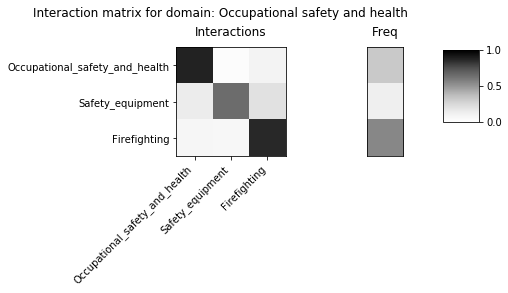

old domain idx
399
[3753, 10698, 13462]
new domain idx
230
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_230.npz


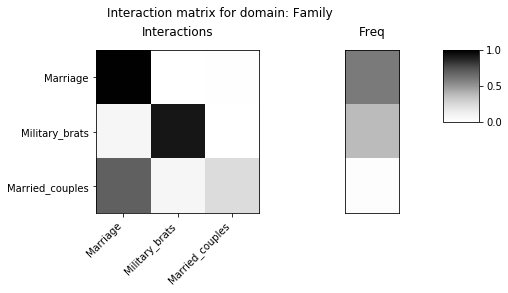

old domain idx
401
[6214, 6215, 14189, 13462, 8059]
new domain idx
231
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_231.npz


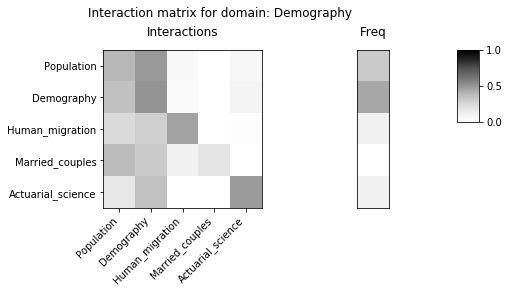

old domain idx
404
[10722, 10794, 16830, 10718]
new domain idx
232
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_232.npz


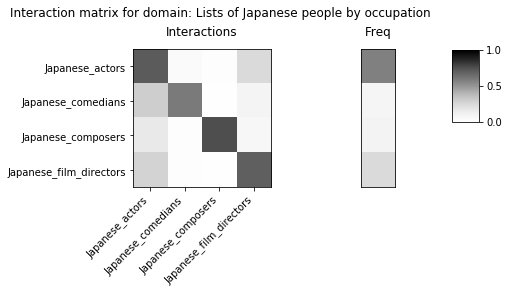

old domain idx
407
[17144, 6082, 10538, 9733]
new domain idx
233
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_233.npz


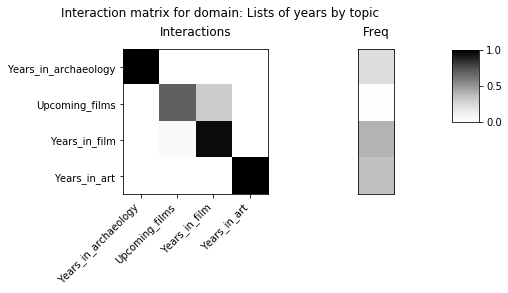

old domain idx
408
[3809, 3802, 3804]
new domain idx
234
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_234.npz


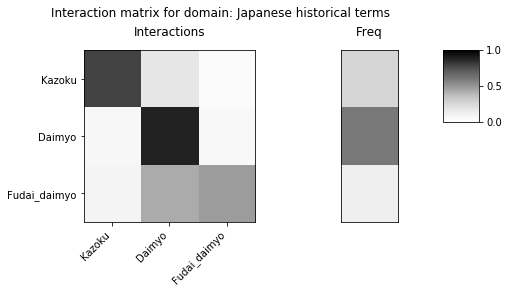

old domain idx
413
[6352, 6356, 17215, 12263]
new domain idx
235
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_235.npz


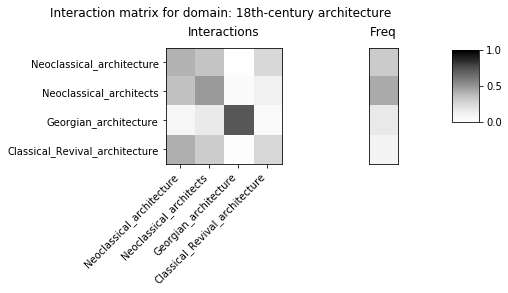

old domain idx
414
[6352, 6356, 17215, 12263]
new domain idx
236
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_236.npz


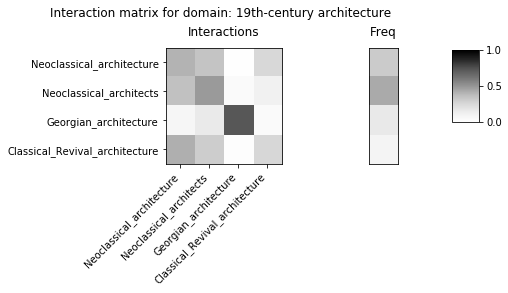

old domain idx
415
[6352, 6356, 12263]
new domain idx
237
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_237.npz


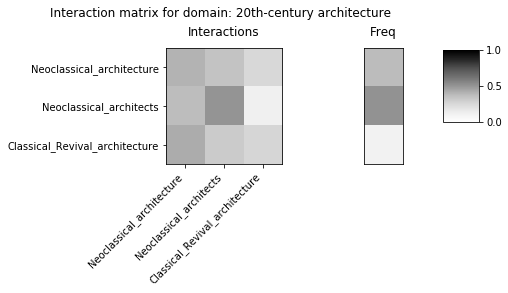

old domain idx
418
[4058, 4006, 4041, 4073, 3979, 4044, 3984, 4049, 4055, 4056, 4025, 3994, 4093]
new domain idx
238
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_238.npz


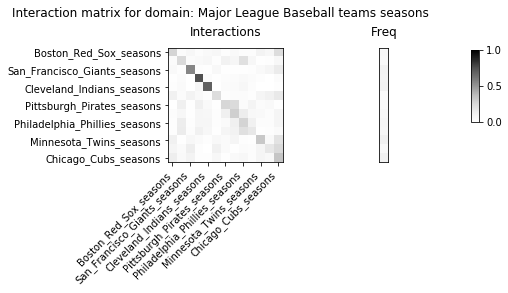

old domain idx
421
[15177, 5489, 13050]
new domain idx
239
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_239.npz


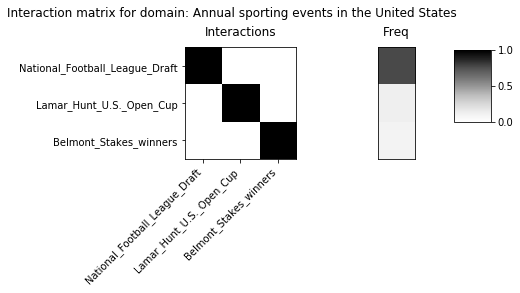

old domain idx
422
[11938, 11940, 12039, 11945, 11947, 11922]
new domain idx
240
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_240.npz


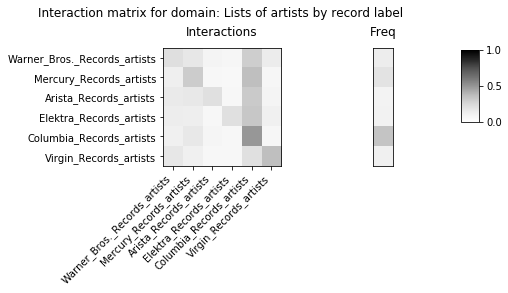

old domain idx
424
[16386, 16388, 6231, 16407, 16409, 16415]
new domain idx
241
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_241.npz


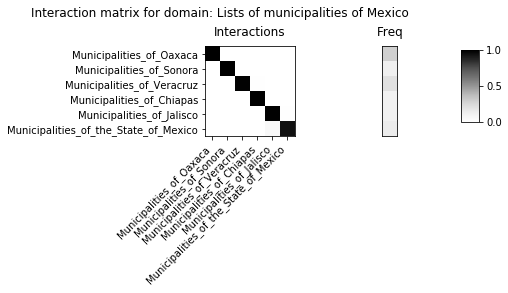

old domain idx
425
[10722, 12299, 6034, 10331, 17117, 5438]
new domain idx
242
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_242.npz


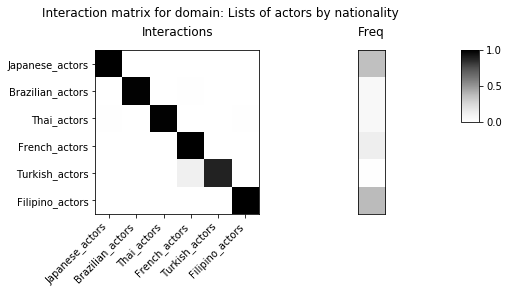

old domain idx
426
[10924, 10923, 4396, 9196]
new domain idx
243
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_243.npz


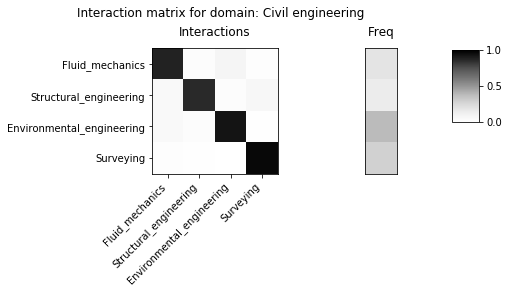

old domain idx
427
[12387, 4396, 12383]
new domain idx
244
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_244.npz


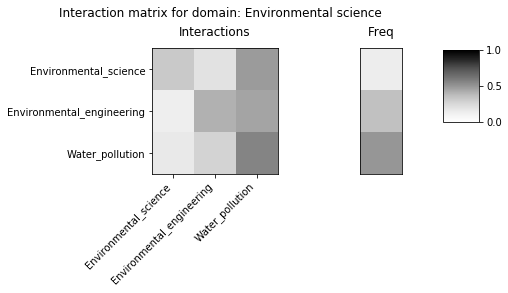

old domain idx
429
[8990, 10283, 10284, 13235, 15286, 15927, 5431, 6073, 14273, 10435, 10564, 10310, 10697, 6108, 10717, 10334, 10595, 10608, 10616]
new domain idx
245
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_245.npz


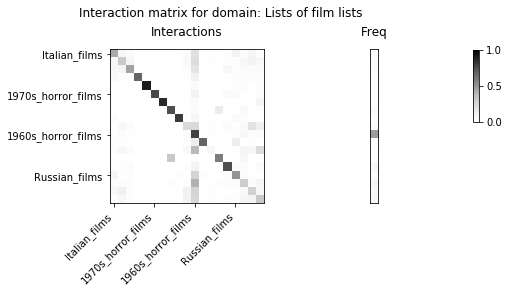

old domain idx
430
[10717, 10564, 15927, 13235, 15286, 5431, 15258, 12445, 8990]
new domain idx
246
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_246.npz


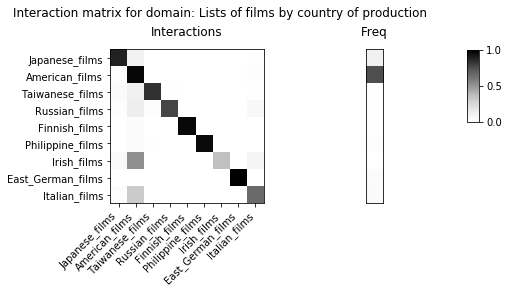

old domain idx
431
[16261, 5034, 5424, 14354, 12089]
new domain idx
247
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_247.npz


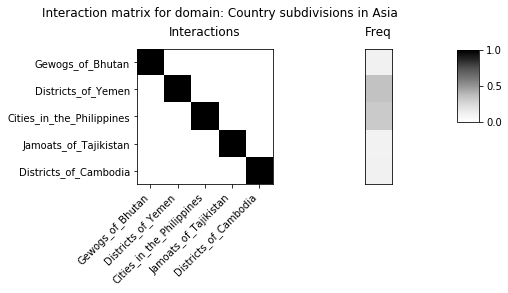

old domain idx
434
[4942, 4476, 4478]
new domain idx
248
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_248.npz


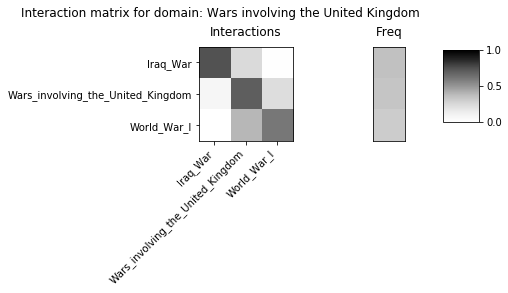

old domain idx
437
[10346, 5938, 7530]
new domain idx
249
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_249.npz


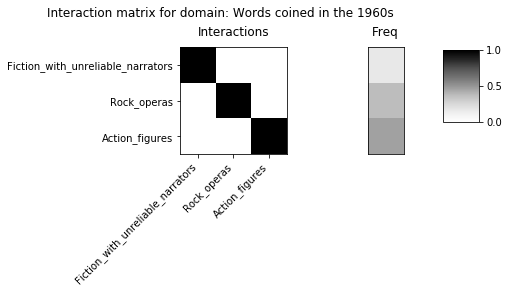

old domain idx
438
[10137, 12140, 8295]
new domain idx
250
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_250.npz


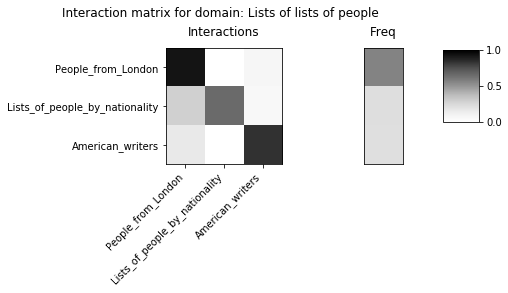

old domain idx
439
[8504, 8469, 17087]
new domain idx
251
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_251.npz


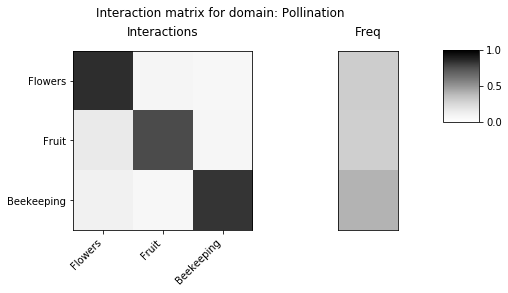

old domain idx
441
[13704, 5577, 5665]
new domain idx
252
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_252.npz


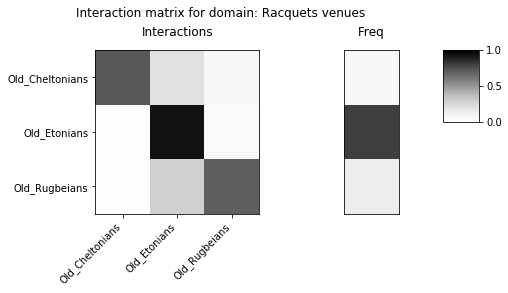

old domain idx
440
[5665, 10114, 14855, 13704, 5577, 7325, 13661]
new domain idx
253
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_253.npz


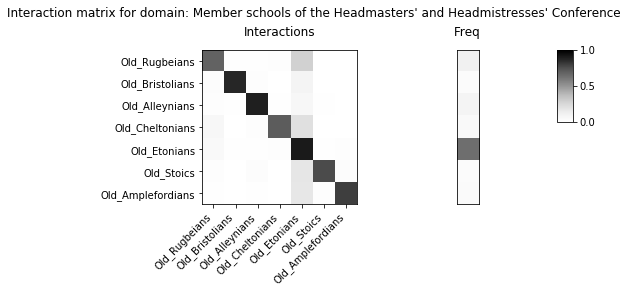

old domain idx
446
[17290, 17323, 11750]
new domain idx
254
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_254.npz


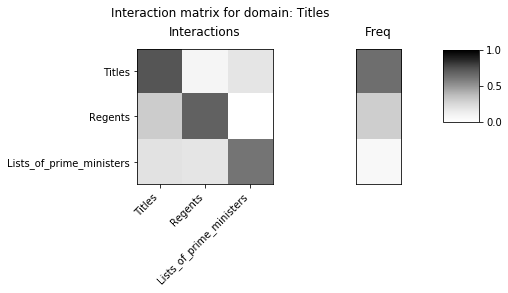

old domain idx
447
[11203, 6532, 6376, 4664, 11257, 8379]
new domain idx
255
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_255.npz


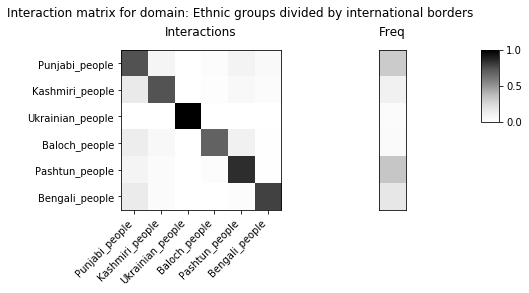

old domain idx
449
[11203, 14469, 11189, 4662, 4664, 11257, 4671]
new domain idx
256
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_256.npz


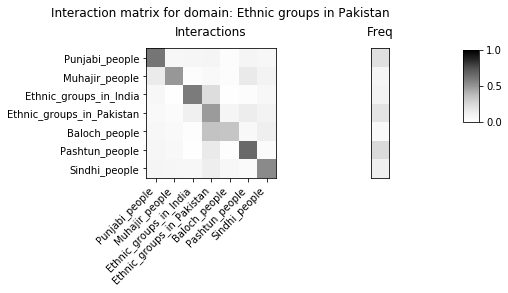

old domain idx
454
[6114, 11203, 17350, 8379, 6047]
new domain idx
257
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_257.npz


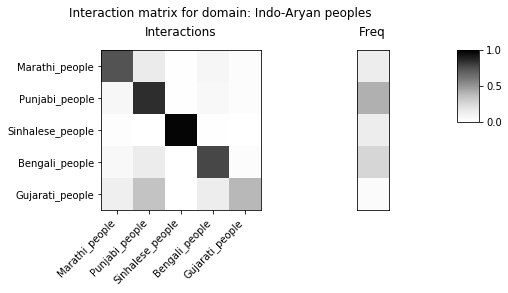

old domain idx
455
[10306, 8388, 4679]
new domain idx
258
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_258.npz


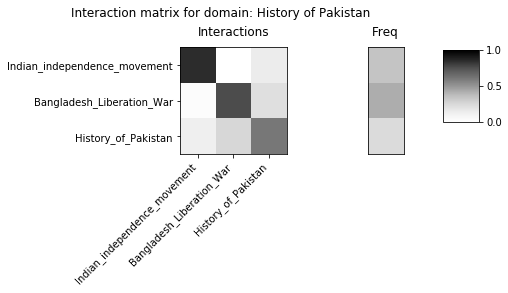

old domain idx
457
[4721, 8857, 4723]
new domain idx
259
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_259.npz


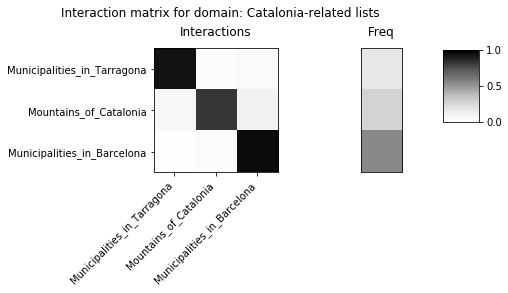

old domain idx
459
[13200, 6802, 17194]
new domain idx
260
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_260.npz


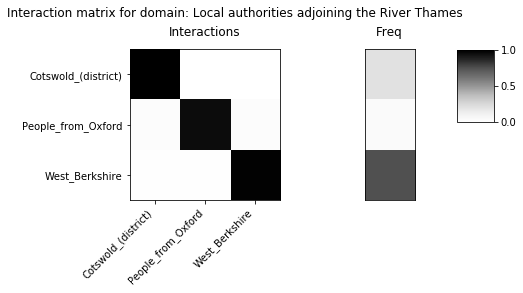

old domain idx
460
[7941, 5598, 11399]
new domain idx
261
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_261.npz


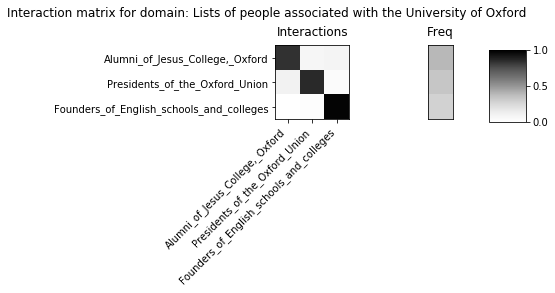

old domain idx
461
[4802, 6613, 11158, 6623]
new domain idx
262
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_262.npz


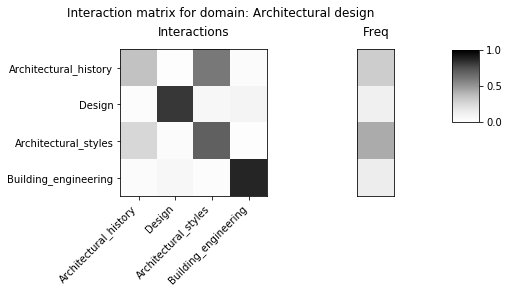

old domain idx
463
[4827, 7117, 16182]
new domain idx
263
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_263.npz


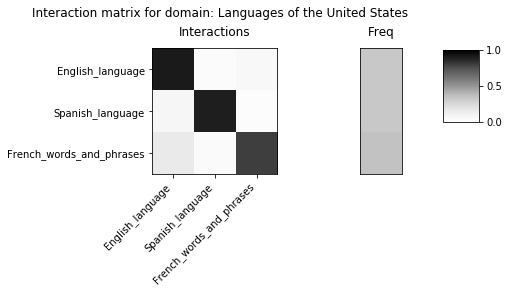

old domain idx
468
[13362, 13548, 16468]
new domain idx
264
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_264.npz


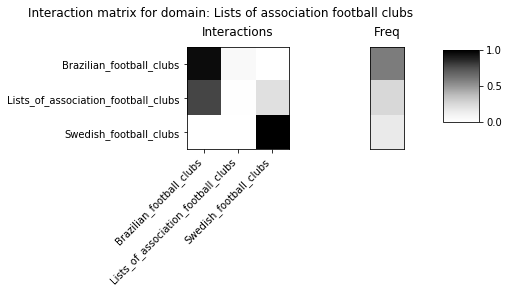

old domain idx
469
[14449, 8411, 14444, 16417]
new domain idx
265
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_265.npz


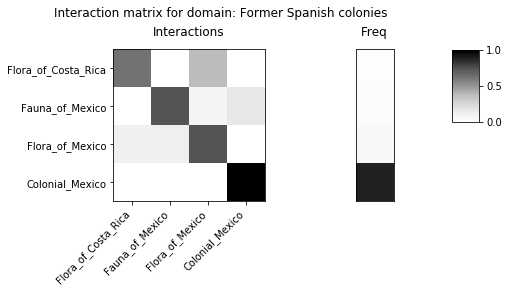

old domain idx
474
[16778, 10957, 7409, 10962, 16563]
new domain idx
266
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_266.npz


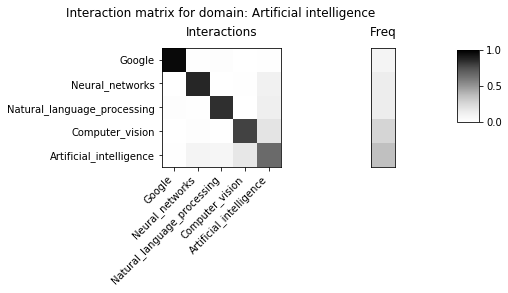

old domain idx
477
[15494, 9257, 8845, 8593, 8564]
new domain idx
267
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_267.npz


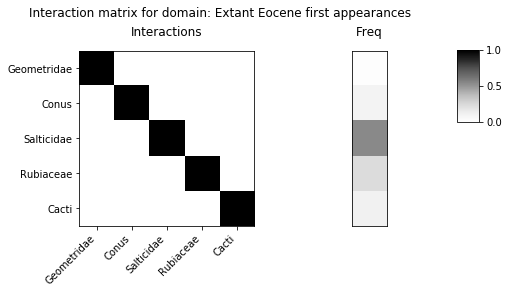

old domain idx
479
[5376, 5378, 5255, 5256, 5257, 5383]
new domain idx
268
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_268.npz


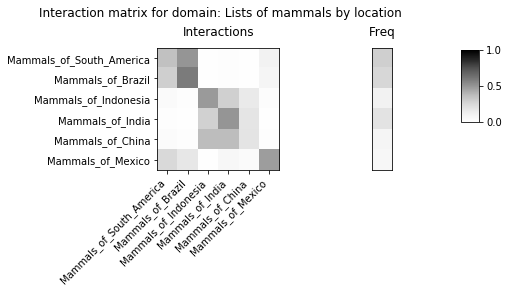

old domain idx
478
[5252, 5258, 14449, 5363, 5333, 5304]
new domain idx
269
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_269.npz


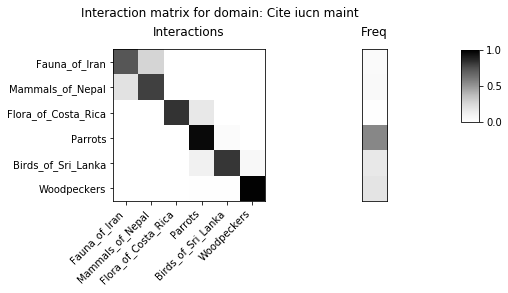

old domain idx
480
[11378, 5244, 5359]
new domain idx
270
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_270.npz


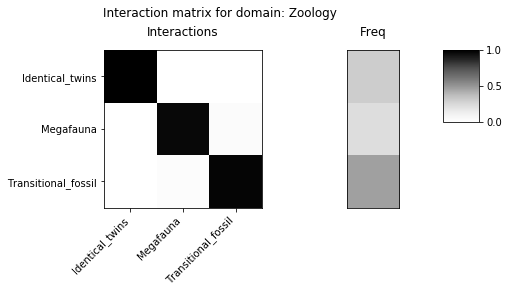

old domain idx
481
[6464, 13448, 5258, 14450, 8635, 6463]
new domain idx
271
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_271.npz


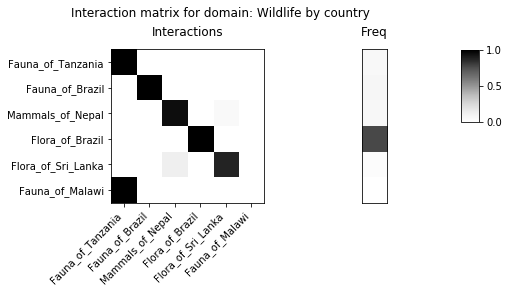

old domain idx
485
[5313, 5320, 5289, 5292, 5293, 5330, 5333, 5272, 5273, 5309]
new domain idx
272
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_272.npz


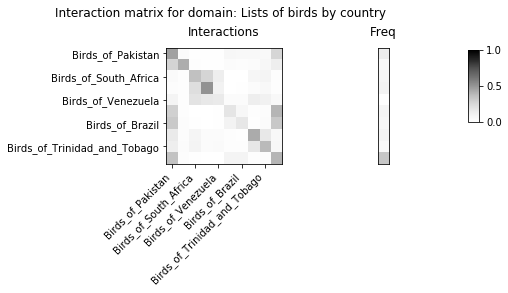

old domain idx
487
[16295, 5382, 13447]
new domain idx
273
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_273.npz


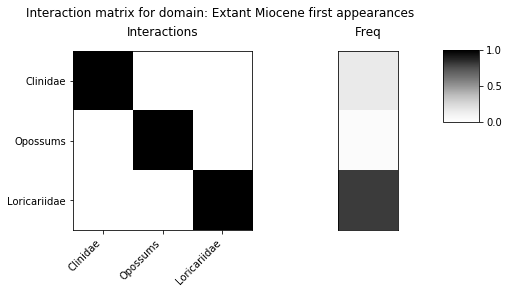

old domain idx
488
[5313, 5330, 5333]
new domain idx
274
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_274.npz


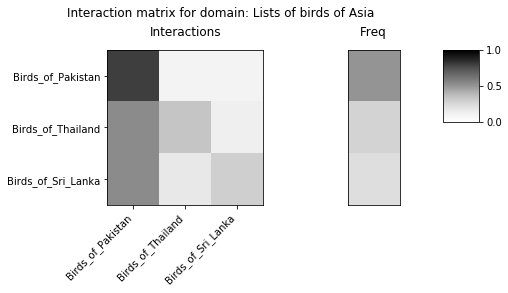

old domain idx
494
[16720, 9609, 6613]
new domain idx
275
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_275.npz


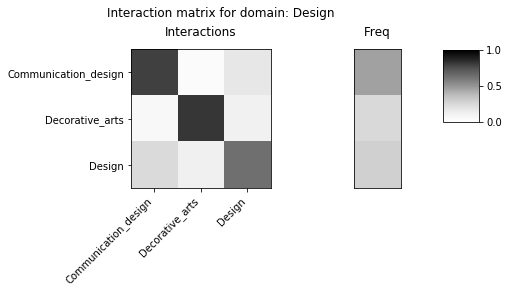

old domain idx
497
[15768, 15745, 14238]
new domain idx
276
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_276.npz


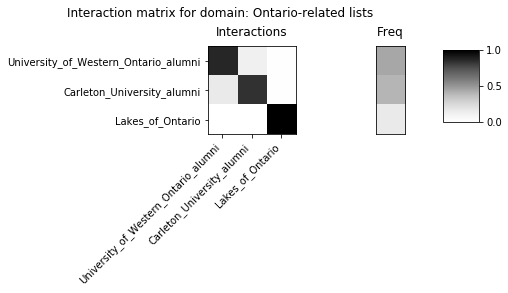

old domain idx
500
[5673, 10123, 8364, 5677, 6738, 17237, 5694]
new domain idx
277
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_277.npz


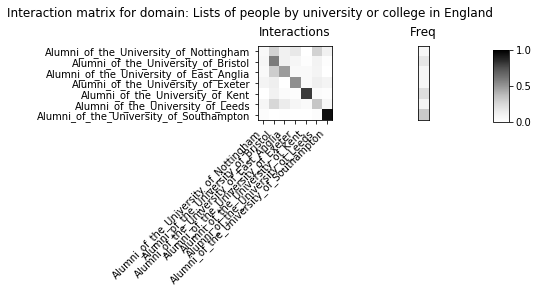

old domain idx
502
[12801, 13674, 14529, 6926]
new domain idx
278
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_278.npz


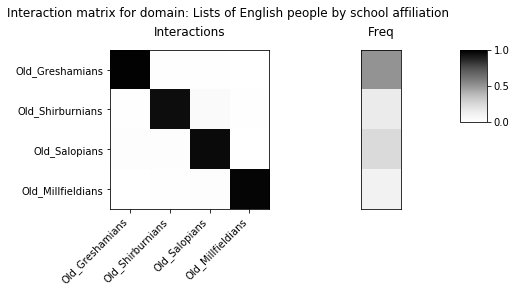

old domain idx
503
[14819, 13735, 5704, 13726, 13727]
new domain idx
279
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_279.npz


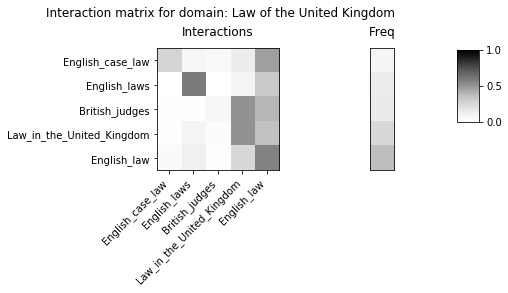

old domain idx
504
[12800, 10913, 13728, 14116, 6693, 6206]
new domain idx
280
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_280.npz


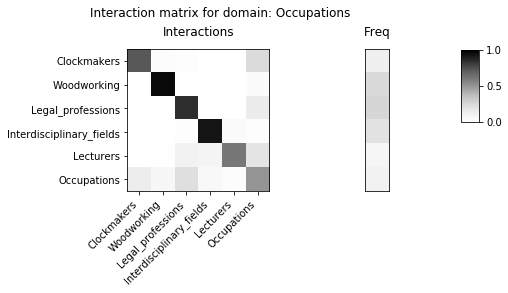

old domain idx
508
[5987, 6019, 5989, 6021, 6023, 6001, 6002, 6011, 6013]
new domain idx
281
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_281.npz


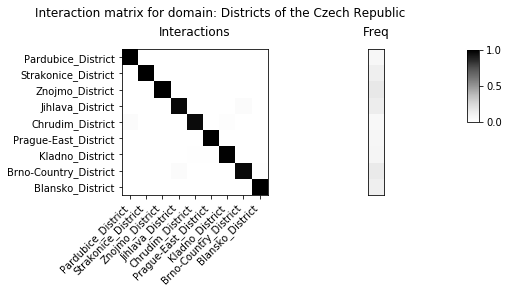

old domain idx
509
[7785, 8379, 14469, 11203]
new domain idx
282
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_282.npz


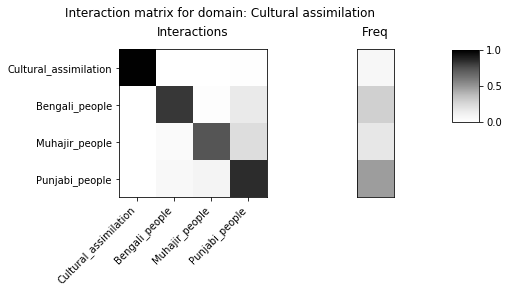

old domain idx
513
[6080, 6114, 11203, 6532, 11189, 11192, 11257, 8379]
new domain idx
283
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_283.npz


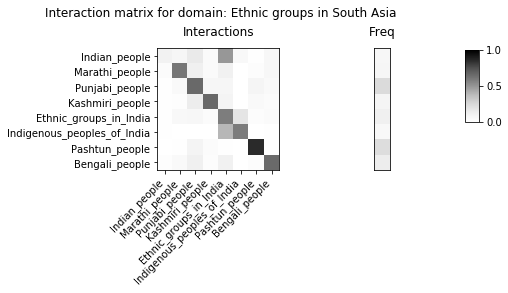

old domain idx
515
[8353, 10538, 9733]
new domain idx
284
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_284.npz


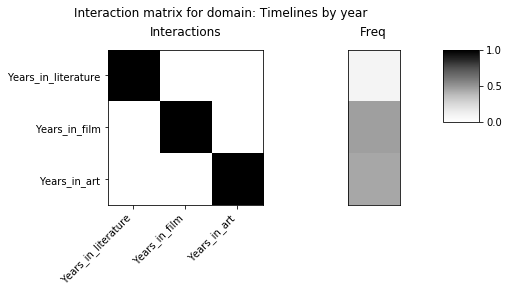

old domain idx
517
[16194, 16164, 11210, 8306, 9689, 16187, 16188]
new domain idx
285
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_285.npz


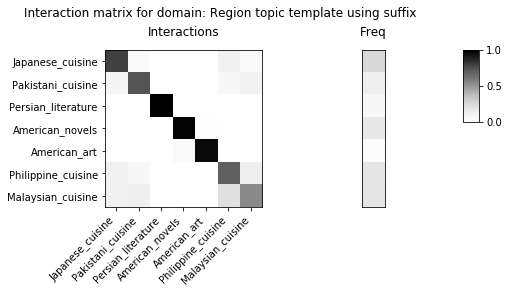

old domain idx
518
[10945, 7408, 7409, 10897, 16563, 10942]
new domain idx
286
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_286.npz


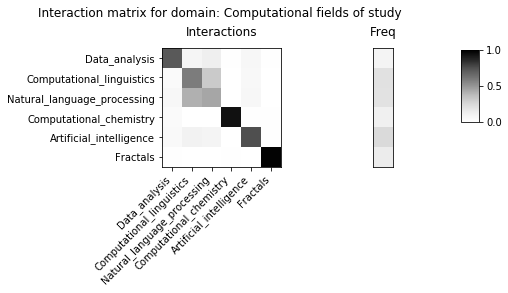

old domain idx
520
[16629, 8059, 8083, 11029]
new domain idx
287
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_287.npz


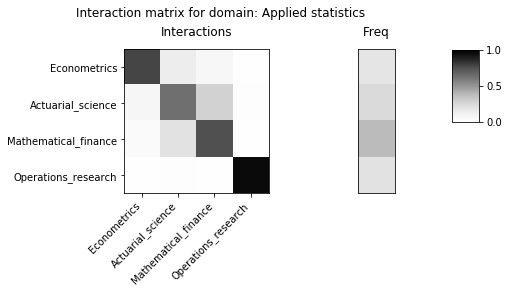

old domain idx
521
[14931, 6710, 6711]
new domain idx
288
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_288.npz


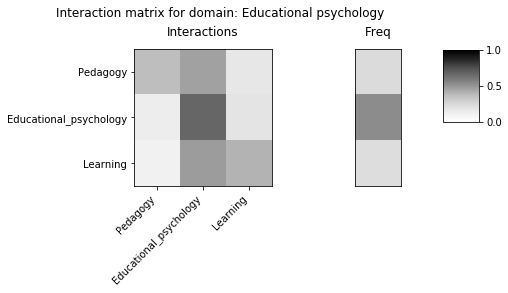

old domain idx
522
[10802, 13373, 10221, 11007]
new domain idx
289
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_289.npz


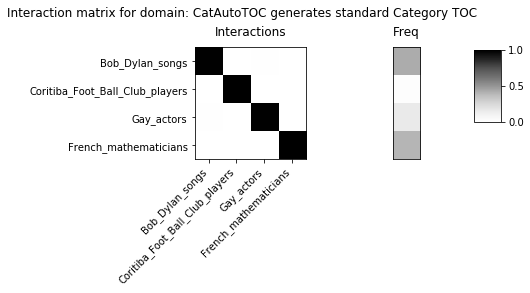

old domain idx
528
[8066, 8059, 10947]
new domain idx
290
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_290.npz


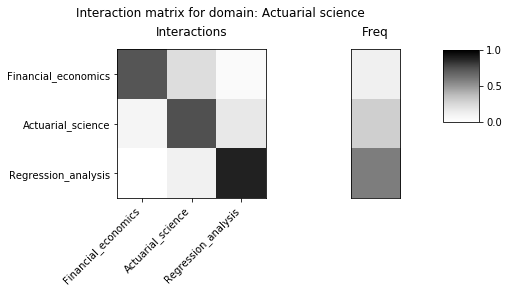

old domain idx
530
[6336, 6328, 6329, 6330, 6331]
new domain idx
291
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_291.npz


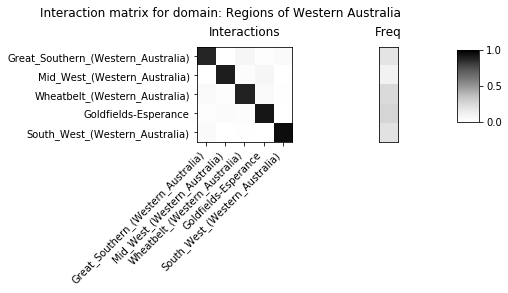

old domain idx
531
[12232, 6356, 12263]
new domain idx
292
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_292.npz


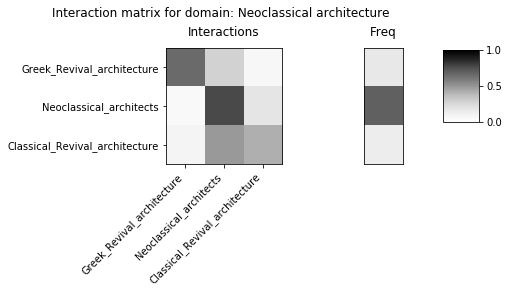

old domain idx
534
[11273, 11373, 12366, 7759, 12143, 12498, 14354, 7127, 12154, 11293]
new domain idx
293
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_293.npz


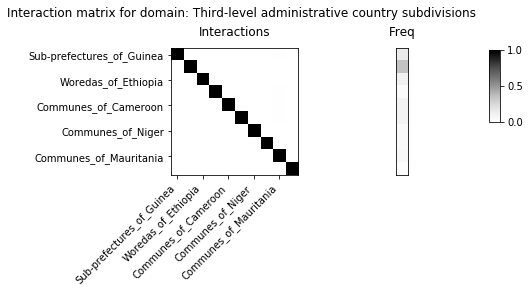

old domain idx
538
[11023, 10886, 10975]
new domain idx
294
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_294.npz


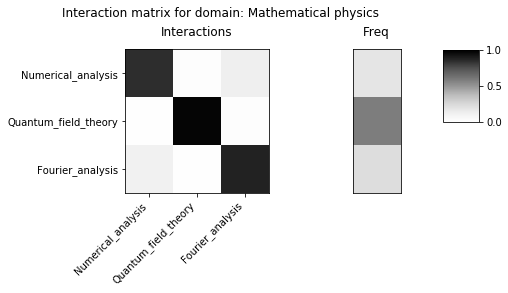

old domain idx
541
[6568, 6569, 6572, 6614]
new domain idx
295
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_295.npz


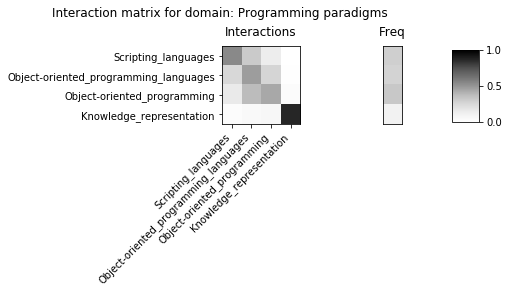

old domain idx
543
[14616, 14202, 9646]
new domain idx
296
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_296.npz


/Users/ruairidh/miniconda3/envs/blockmodels/lib/python3.7/site-packages/matplotlib/_constrained_layout.py:226: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  warnings.warn('constrained_layout not applied.  At least '


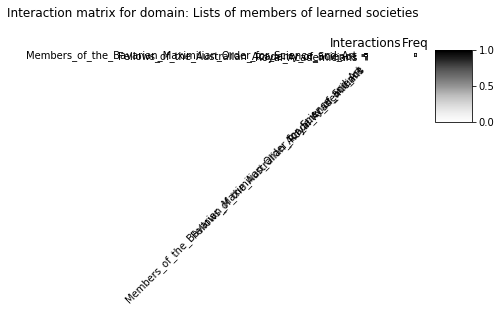

old domain idx
546
[16665, 6606, 16703]
new domain idx
297
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_297.npz


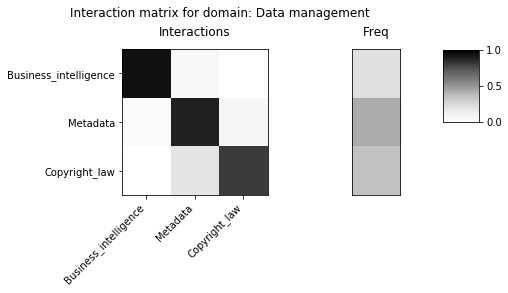

old domain idx
555
[6660, 6676, 14431]
new domain idx
298
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_298.npz


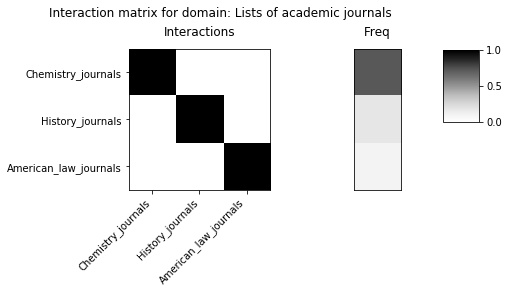

old domain idx
557
[16579, 11564, 12398, 15825, 14931, 14805, 6715]
new domain idx
299
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_299.npz


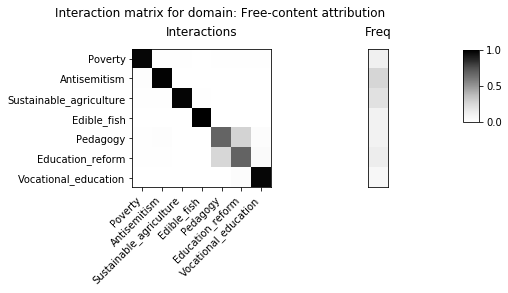

old domain idx
558
[16579, 11564, 14931, 14805, 6715]
new domain idx
300
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_300.npz


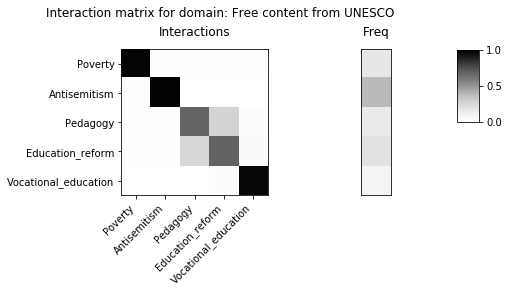

old domain idx
559
[13730, 13731, 7583]
new domain idx
301
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_301.npz


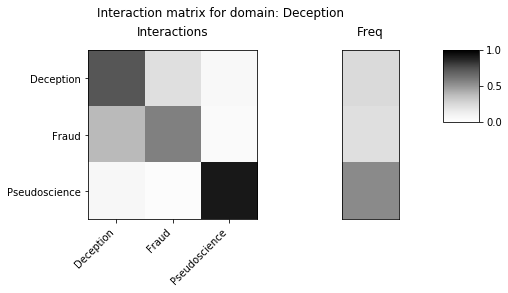

old domain idx
564
[9275, 15323, 7190]
new domain idx
302
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_302.npz


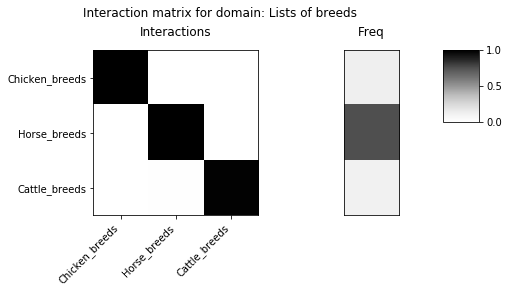

old domain idx
568
[7712, 16502, 15352]
new domain idx
303
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_303.npz


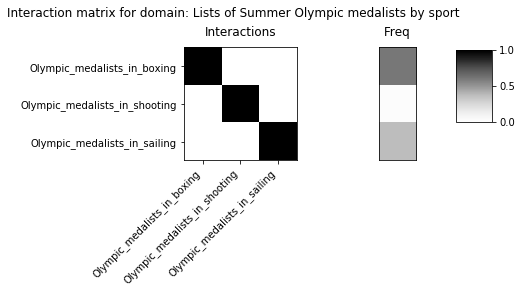

old domain idx
570
[16777, 7410, 16715]
new domain idx
304
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_304.npz


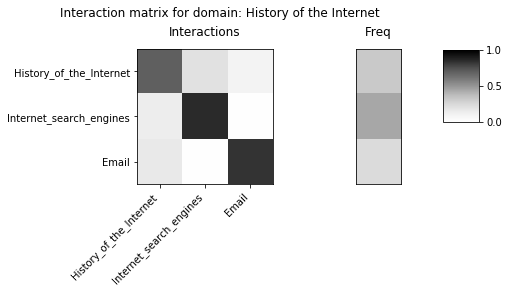

old domain idx
573
[7585, 7587, 7588, 9266, 16701]
new domain idx
305
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_305.npz


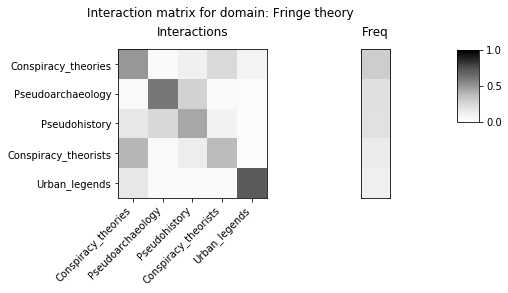

old domain idx
576
[14433, 7970, 7971, 14434, 7976, 7977]
new domain idx
306
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_306.npz


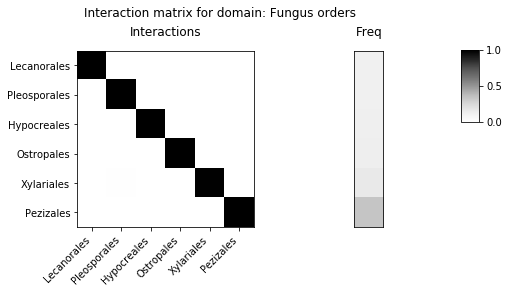

old domain idx
579
[8449, 16179, 16189]
new domain idx
307
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_307.npz


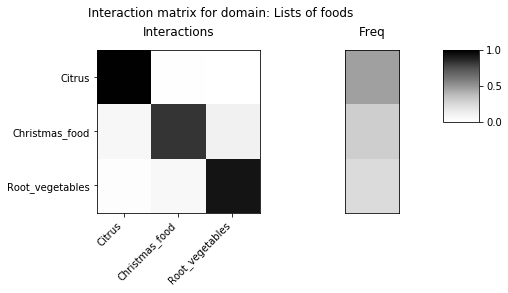

old domain idx
580
[8608, 16580, 9030, 17354, 17356, 17069, 16239, 16240, 17071, 17138, 16435, 17081, 17080, 8601]
new domain idx
308
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_308.npz


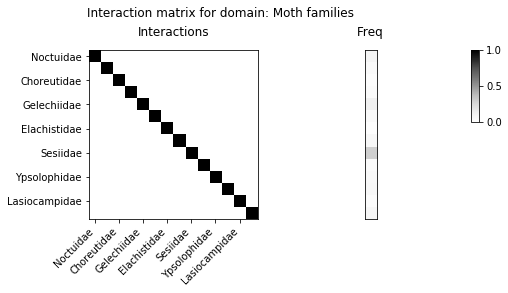

old domain idx
581
[16720, 8033, 16721]
new domain idx
309
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_309.npz


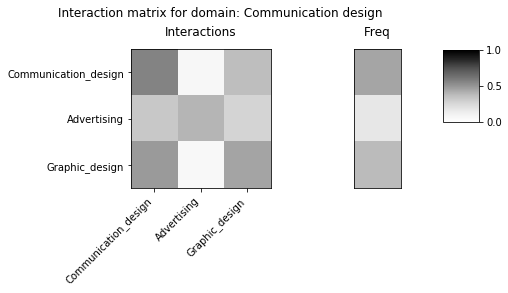

old domain idx
582
[8033, 8034, 8031]
new domain idx
310
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_310.npz


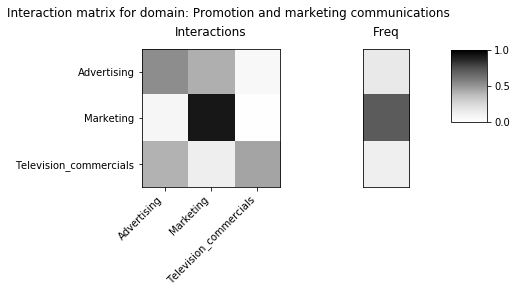

old domain idx
584
[10852, 9023, 14998, 8047]
new domain idx
311
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_311.npz


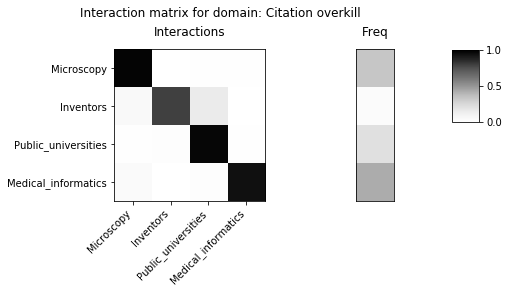

old domain idx
586
[10849, 17187, 10852, 8070, 8106, 8074, 14091, 16369, 16798]
new domain idx
312
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_312.npz


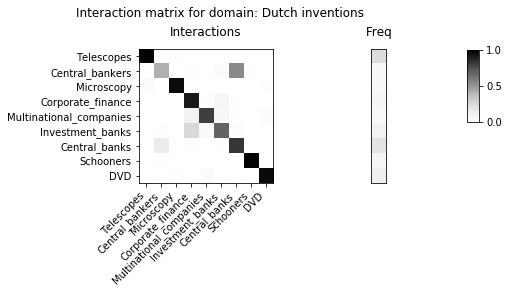

old domain idx
585
[17187, 14091, 8070]
new domain idx
313
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_313.npz


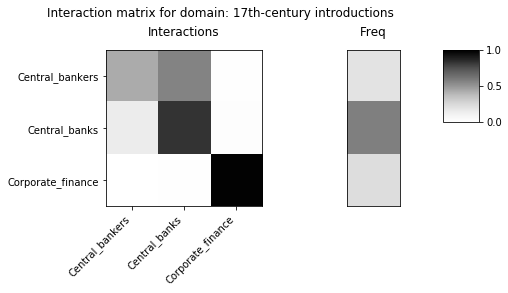

old domain idx
589
[10403, 11683, 11621, 10153, 9994, 9996, 10573, 11605, 11710]
new domain idx
314
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_314.npz


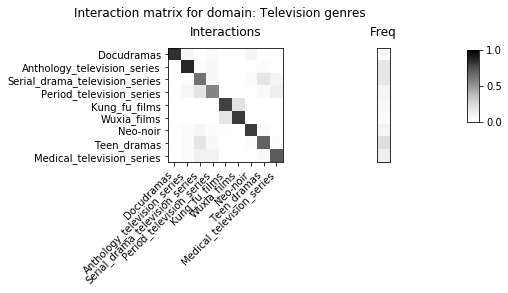

old domain idx
594
[15920, 9532, 15917]
new domain idx
315
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_315.npz


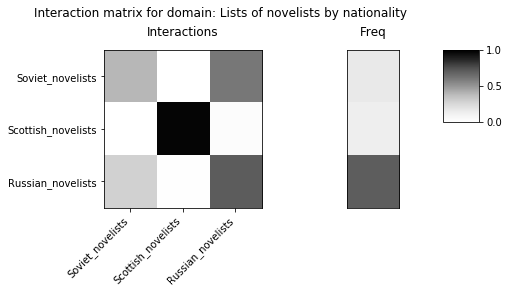

old domain idx
593
[9012, 8278, 8295]
new domain idx
316
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_316.npz


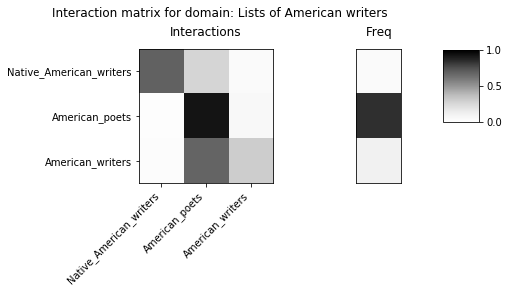

old domain idx
596
[9697, 9698, 15874, 9636, 9673, 9694, 15871]
new domain idx
317
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_317.npz


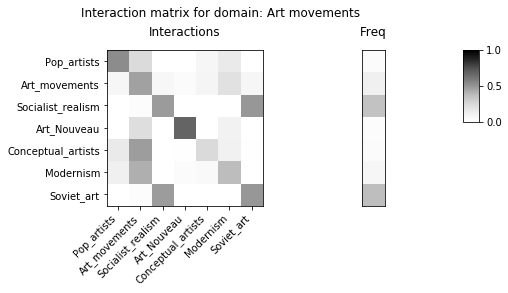

old domain idx
598
[10661, 9990, 10256, 10258, 10615, 10393]
new domain idx
318
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_318.npz


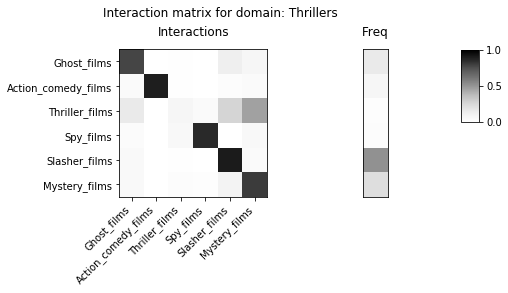

old domain idx
597
[10661, 9990, 10258, 10615, 10393]
new domain idx
319
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_319.npz


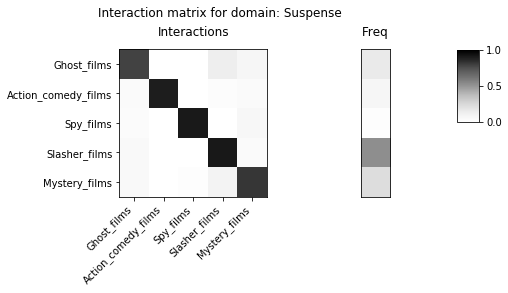

old domain idx
599
[10306, 8388, 11205, 11206]
new domain idx
320
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_320.npz


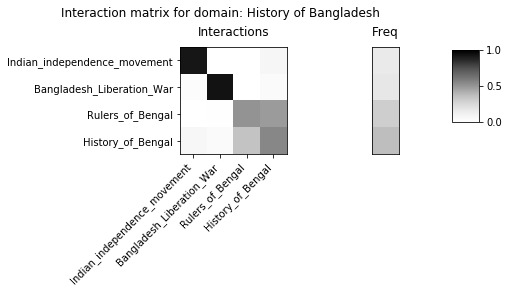

old domain idx
600
[8388, 11205, 11206]
new domain idx
321
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_321.npz


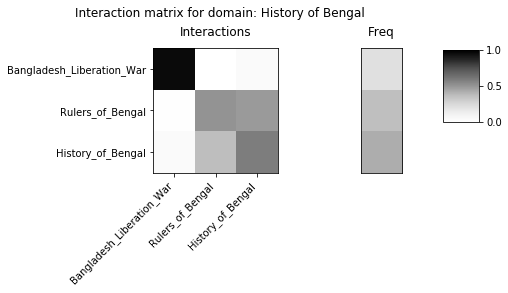

old domain idx
602
[8400, 8401, 8403, 8405, 8407, 8410]
new domain idx
322
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_322.npz


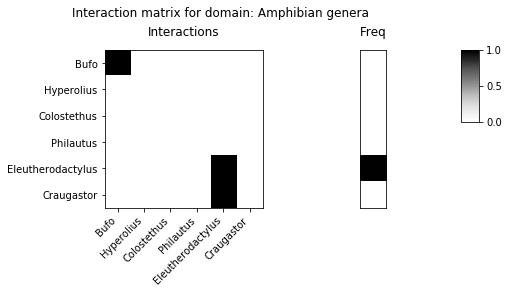

old domain idx
605
[14449, 14444, 16417]
new domain idx
323
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_323.npz


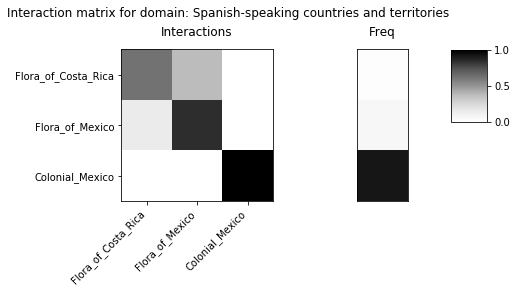

old domain idx
604
[11752, 14449, 14444]
new domain idx
324
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_324.npz


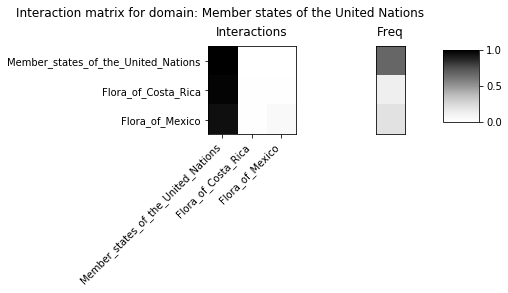

old domain idx
606
[14164, 16557, 16558]
new domain idx
325
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_325.npz


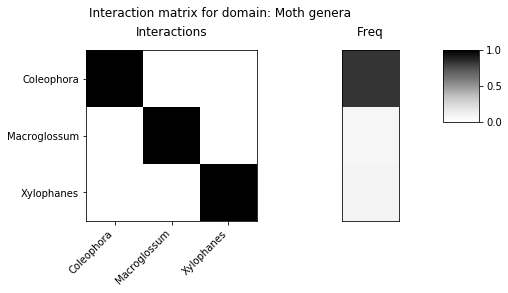

old domain idx
609
[8504, 8483, 14255]
new domain idx
326
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_326.npz


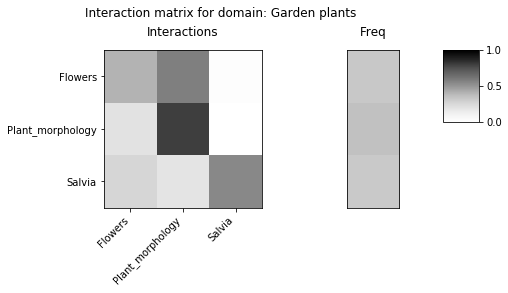

old domain idx
610
[8502, 8641, 8486]
new domain idx
327
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_327.npz


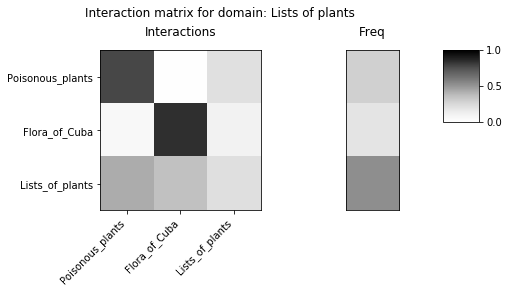

old domain idx
611
[10913, 8458, 8475]
new domain idx
328
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_328.npz


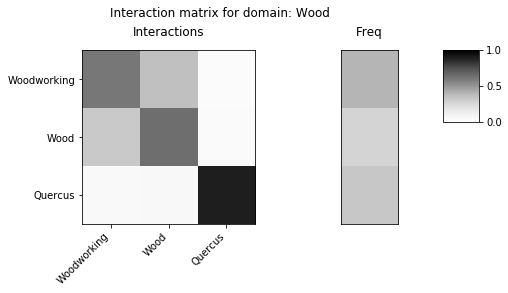

old domain idx
612
[16193, 8475, 8597]
new domain idx
329
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_329.npz


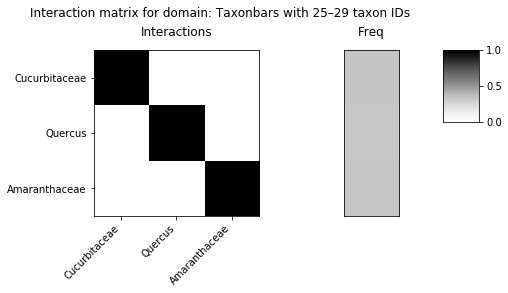

old domain idx
613
[8579, 8580, 14847]
new domain idx
330
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_330.npz


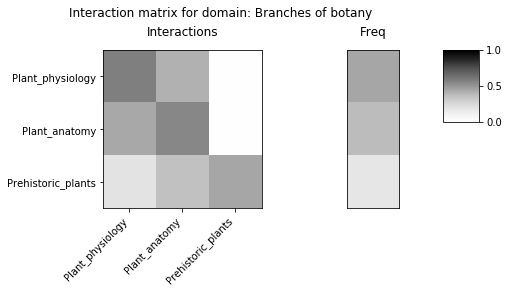

old domain idx
614
[8504, 9025, 8581]
new domain idx
331
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_331.npz


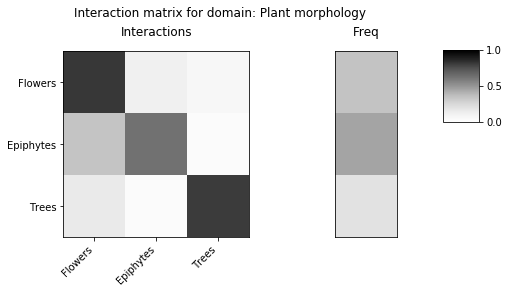

old domain idx
619
[8608, 8610, 8614, 8615, 8618]
new domain idx
332
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_332.npz


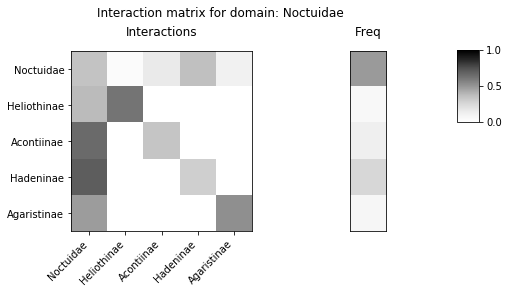

old domain idx
620
[8616, 8605, 8606]
new domain idx
333
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_333.npz


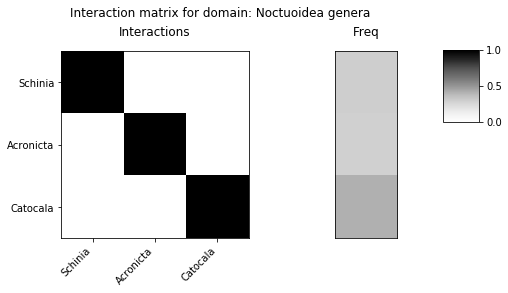

old domain idx
621
[17120, 17121, 17123, 8617, 16297, 8619, 14155, 14160, 14161, 8626, 14162, 15543, 8632, 15865]
new domain idx
334
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_334.npz


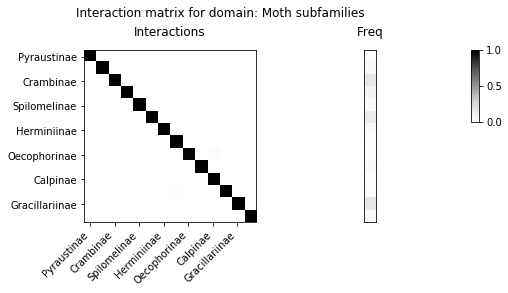

old domain idx
624
[10881, 10883, 10888, 8720, 8722]
new domain idx
335
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_335.npz


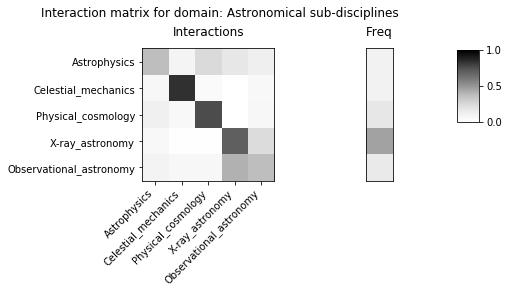

old domain idx
625
[8710, 8712, 8683, 8685, 8686, 8687, 8689, 8692]
new domain idx
336
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_336.npz


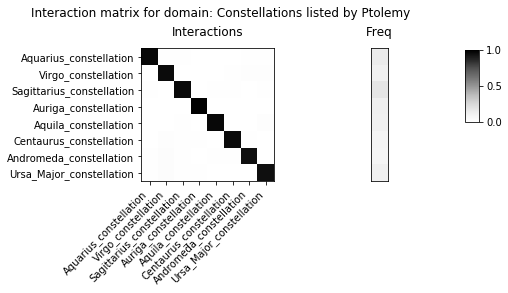

old domain idx
626
[8689, 8692, 8685]
new domain idx
337
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_337.npz


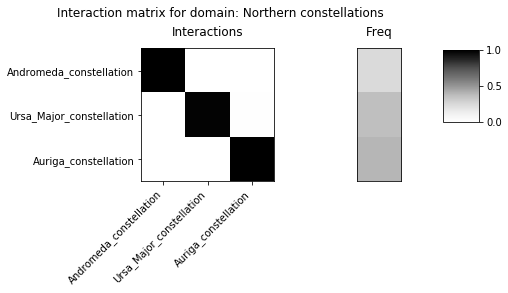

old domain idx
627
[8710, 8711, 8712, 8685, 8687, 8689, 8692]
new domain idx
338
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_338.npz


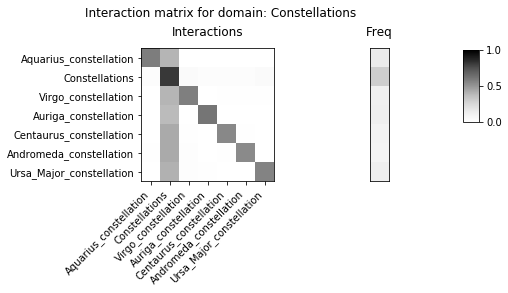

old domain idx
631
[15423, 10821, 10823]
new domain idx
339
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_339.npz


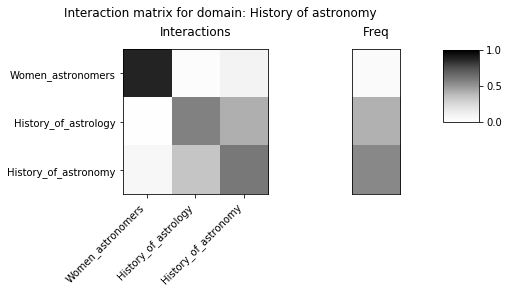

old domain idx
640
[8928, 8931, 8933, 8965, 8910, 8943, 8944, 8913, 8946, 8915, 8947, 8951, 8920, 8953, 8955, 8958, 8959]
new domain idx
340
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_340.npz


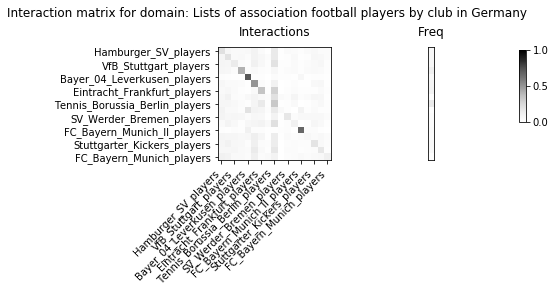

old domain idx
642
[14456, 14445, 14446, 14447]
new domain idx
341
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_341.npz


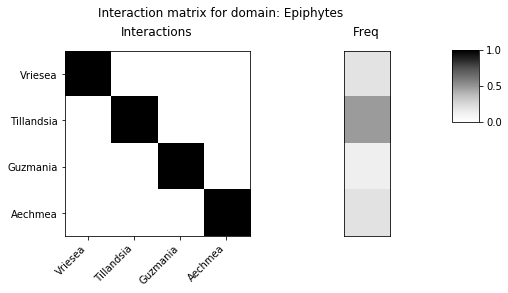

old domain idx
643
[9088, 9089, 9090]
new domain idx
342
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_342.npz


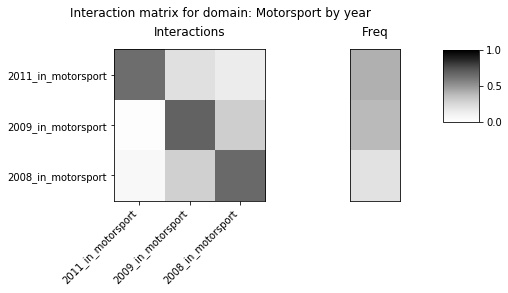

old domain idx
644
[9135, 9131, 9125, 9127]
new domain idx
343
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_343.npz


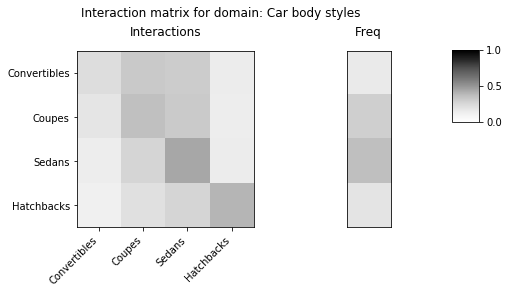

old domain idx
645
[9125, 9126, 9127, 9128, 9129, 9130, 9137, 9170, 9139, 9149]
new domain idx
344
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_344.npz


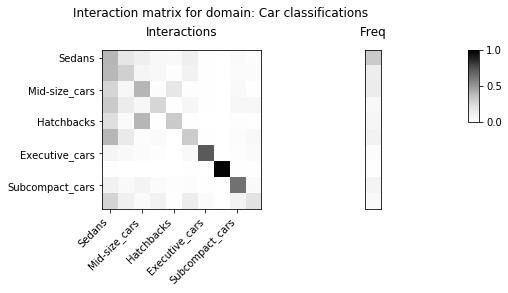

old domain idx
648
[9609, 9675, 9673, 9655]
new domain idx
345
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_345.npz


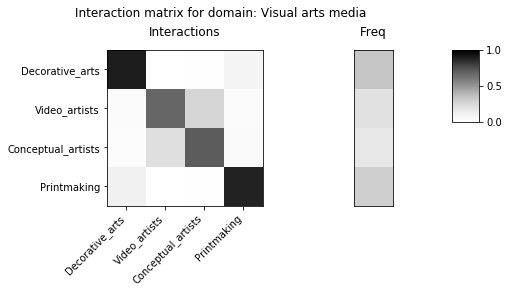

old domain idx
650
[15905, 15907, 9206]
new domain idx
346
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_346.npz


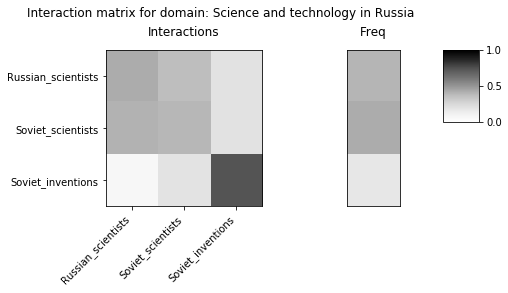

old domain idx
654
[9260, 9262, 16471]
new domain idx
347
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_347.npz


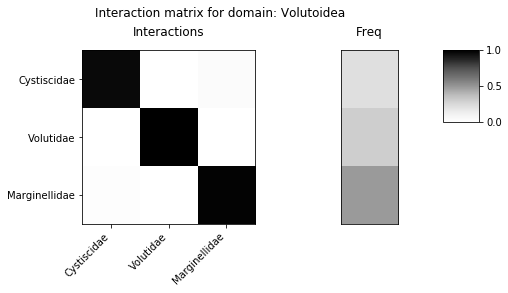

old domain idx
653
[14372, 9258, 9260, 9262, 16597, 15548, 15551]
new domain idx
348
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_348.npz


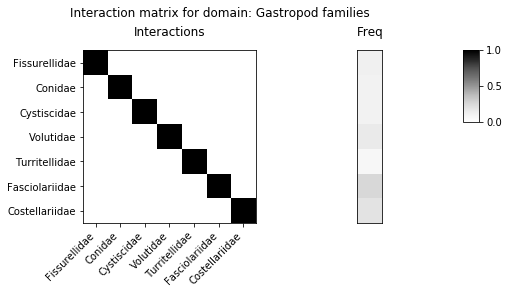

old domain idx
661
[9728, 9689, 9697, 9613]
new domain idx
349
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_349.npz


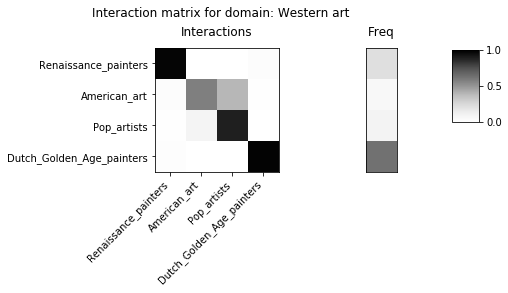

old domain idx
660
[12910, 10251, 12747]
new domain idx
350
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_350.npz


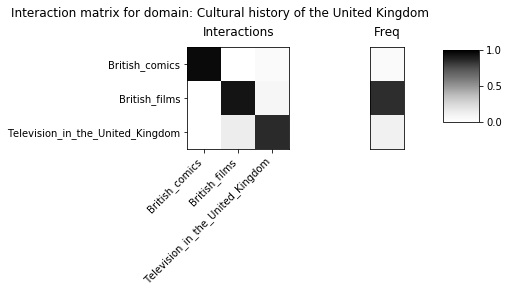

old domain idx
662
[9648, 10417, 9662]
new domain idx
351
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_351.npz


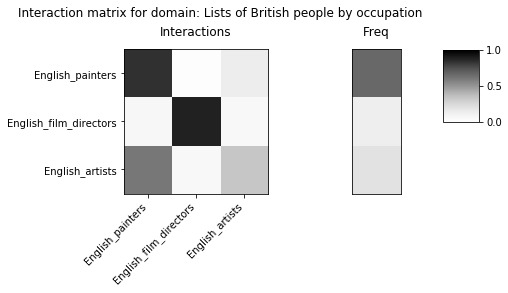

old domain idx
664
[9702, 9697, 15868, 9694]
new domain idx
352
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_352.npz


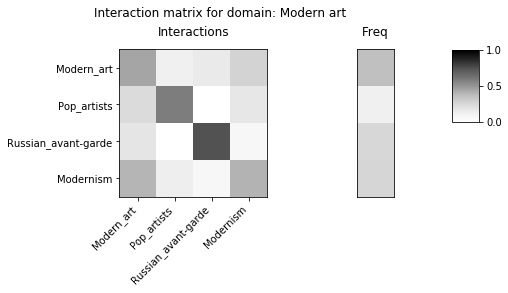

old domain idx
665
[9697, 9675, 9677]
new domain idx
353
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_353.npz


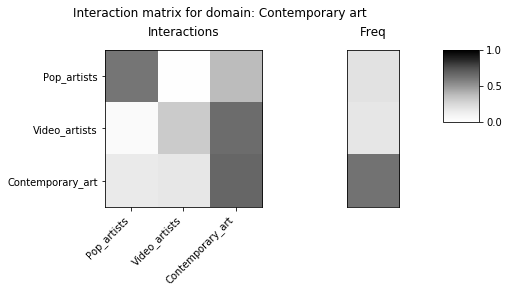

old domain idx
669
[17058, 14530, 16678, 16686, 16690]
new domain idx
354
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_354.npz


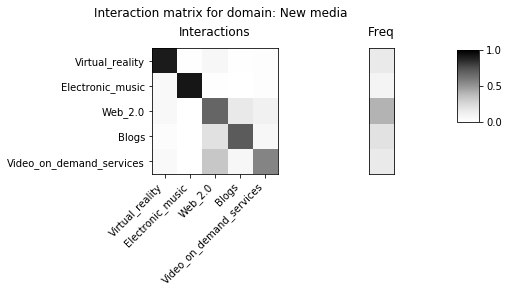

old domain idx
671
[16616, 10657, 17358, 11294]
new domain idx
355
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_355.npz


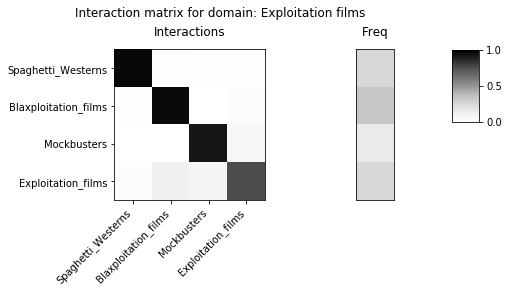

old domain idx
672
[12347, 12348, 14532]
new domain idx
356
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_356.npz


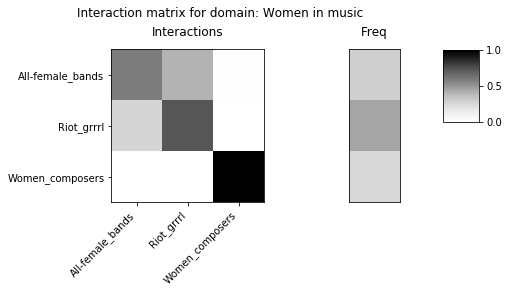

old domain idx
675
[10435, 10697, 10284, 10608, 10293, 10616]
new domain idx
357
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_357.npz


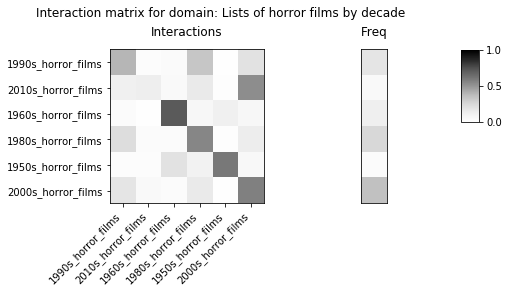

old domain idx
677
[15947, 10941, 16686]
new domain idx
358
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_358.npz


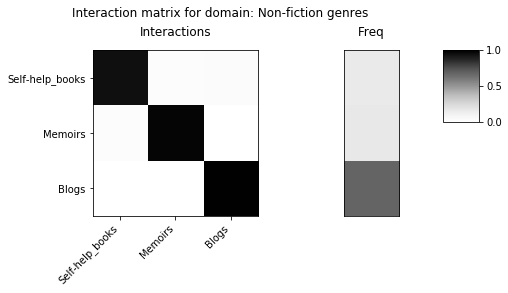

old domain idx
678
[11810, 16964, 17360, 10482, 11674]
new domain idx
359
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_359.npz


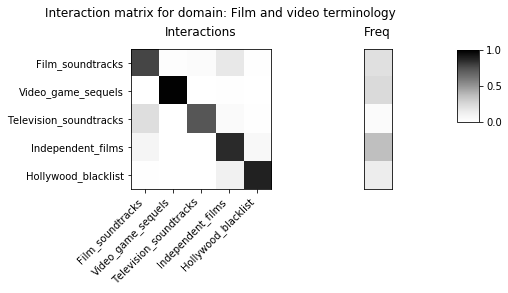

old domain idx
679
[11674, 12612, 12637, 12606]
new domain idx
360
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_360.npz


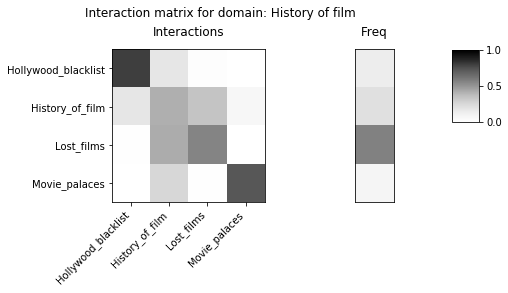

old domain idx
680
[10718, 10710, 13231]
new domain idx
361
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_361.npz


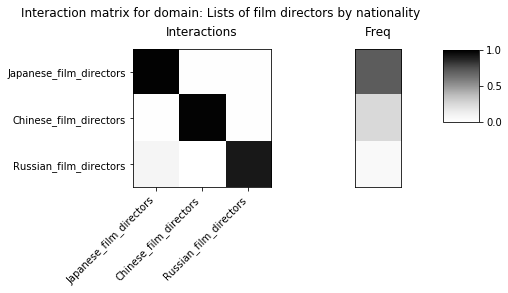

old domain idx
681
[10650, 10533, 10525]
new domain idx
362
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_362.npz


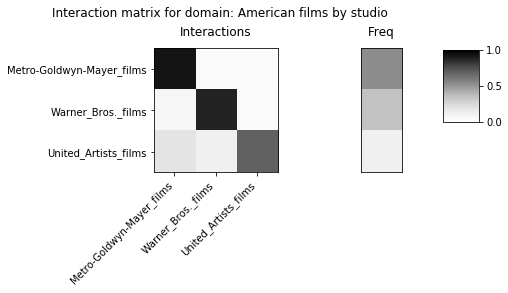

old domain idx
682
[10650, 10533, 10525]
new domain idx
363
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_363.npz


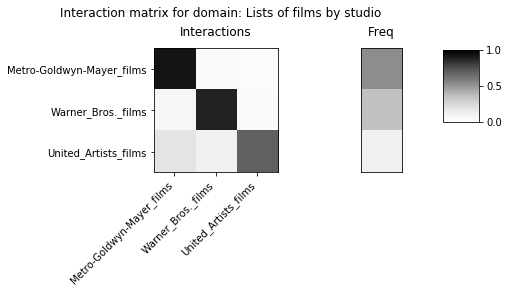

old domain idx
683
[17059, 17060, 17063]
new domain idx
364
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_364.npz


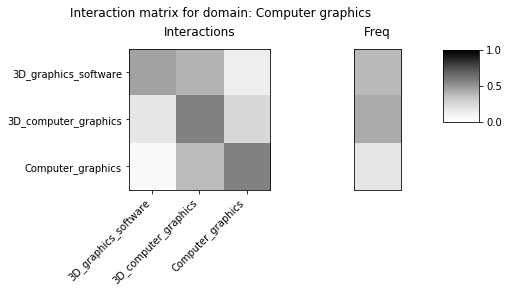

old domain idx
686
[17057, 17059, 17060]
new domain idx
365
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_365.npz


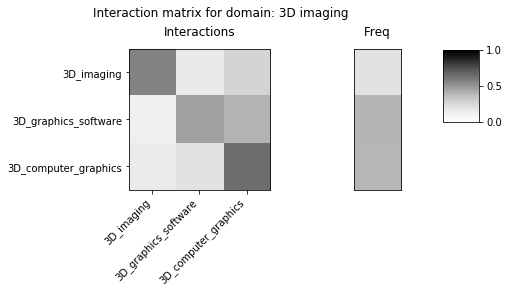

old domain idx
689
[15905, 15907, 10901]
new domain idx
366
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_366.npz


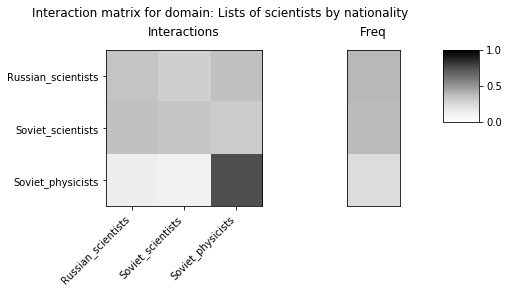

old domain idx
690
[10946, 16643, 10949, 11029, 16629, 11035, 10943]
new domain idx
367
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_367.npz


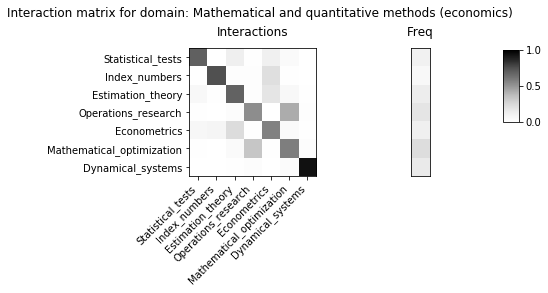

old domain idx
692
[14352, 11041, 11042]
new domain idx
368
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_368.npz


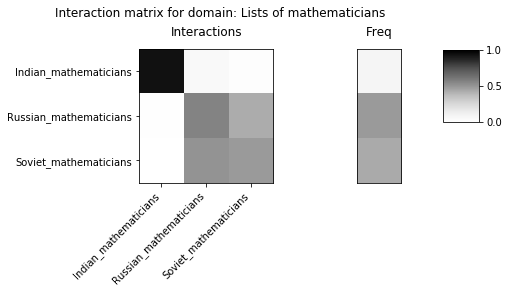

old domain idx
693
[11088, 11084, 11100]
new domain idx
369
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_369.npz


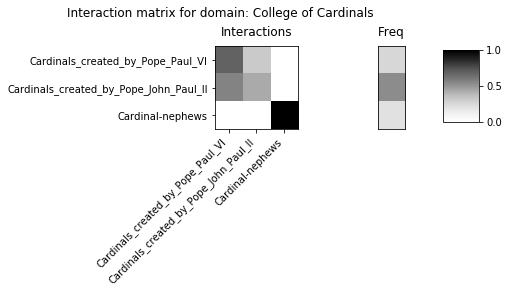

old domain idx
702
[12907, 11540, 11543]
new domain idx
370
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_370.npz


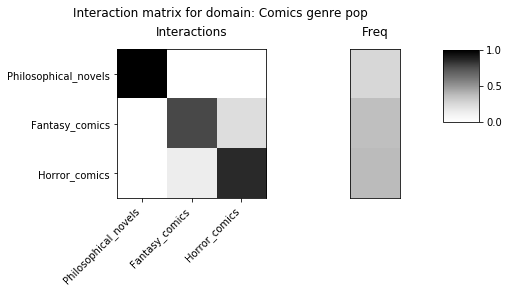

old domain idx
704
[16179, 13124, 13126]
new domain idx
371
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_371.npz


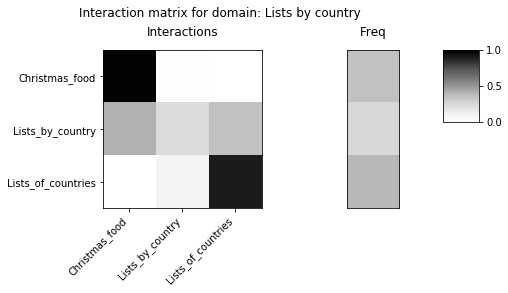

old domain idx
708
[14530, 16427, 12339, 11988, 11997]
new domain idx
372
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_372.npz


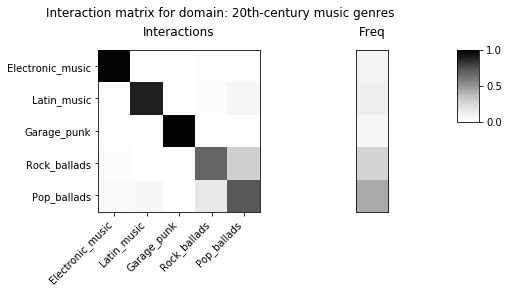

old domain idx
709
[14530, 11988, 11997]
new domain idx
373
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_373.npz


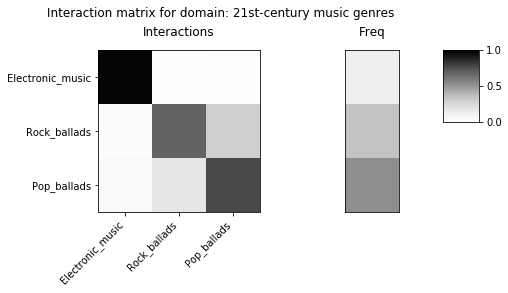

old domain idx
712
[12169, 12174, 12167]
new domain idx
374
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_374.npz


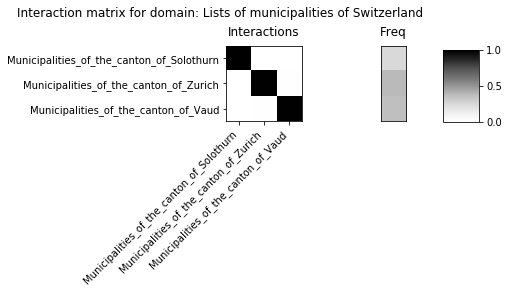

old domain idx
714
[16427, 12348, 15607]
new domain idx
375
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_375.npz


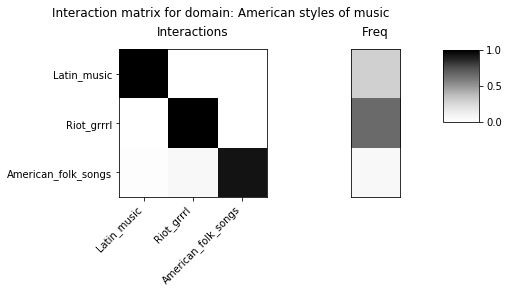

old domain idx
716
[12507, 12508, 12501, 12510]
new domain idx
376
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_376.npz


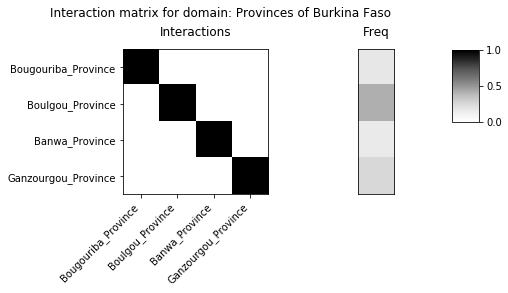

old domain idx
718
[12784, 12785, 13728]
new domain idx
377
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_377.npz


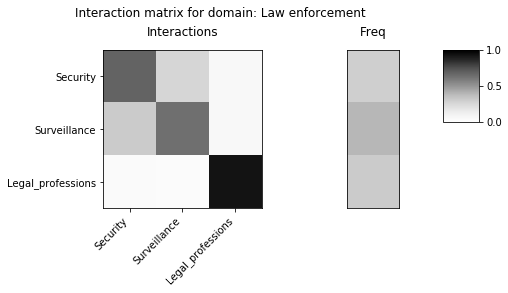

old domain idx
726
[16675, 16677, 16678, 16695, 16671]
new domain idx
378
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_378.npz


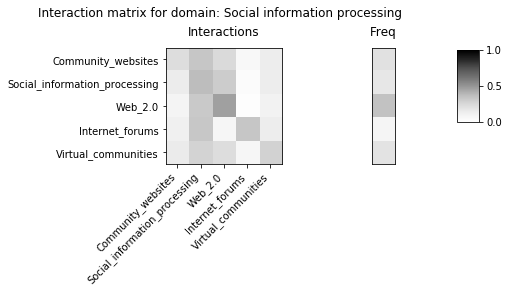

old domain idx
733
[13753, 14819, 14823, 13735]
new domain idx
379
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_379.npz


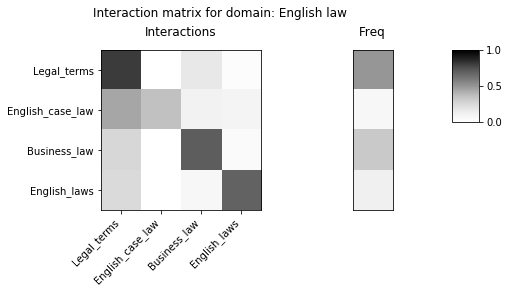

old domain idx
731
[14819, 14811, 14812, 13735]
new domain idx
380
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_380.npz


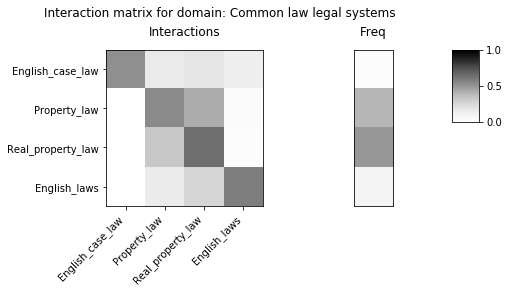

old domain idx
741
[15494, 14161, 14162, 15543, 15865]
new domain idx
381
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_381.npz


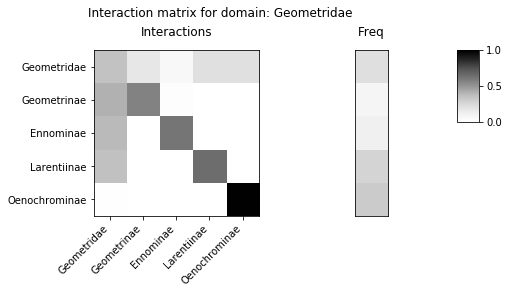

old domain idx
747
[14446, 14447, 14448, 14454, 14456]
new domain idx
382
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_382.npz


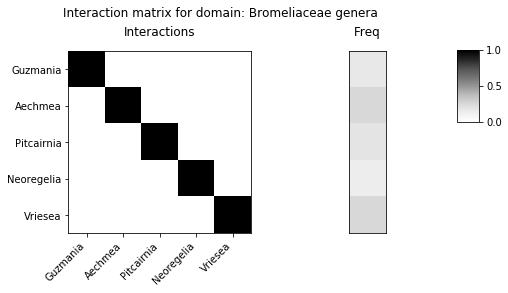

old domain idx
751
[14996, 14997, 15001, 15002, 15003]
new domain idx
383
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_383.npz


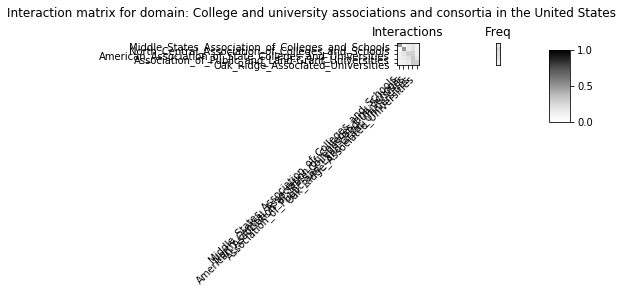

old domain idx
752
[15146, 15162, 15148, 15143]
new domain idx
384
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_384.npz


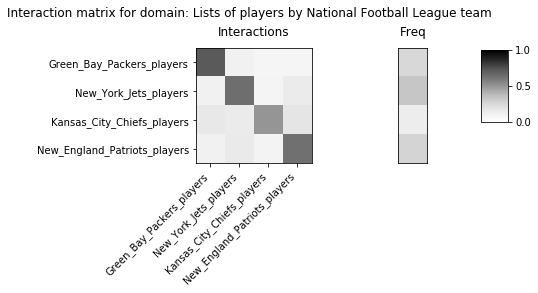

old domain idx
755
[15872, 15870, 15871]
new domain idx
385
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_385.npz


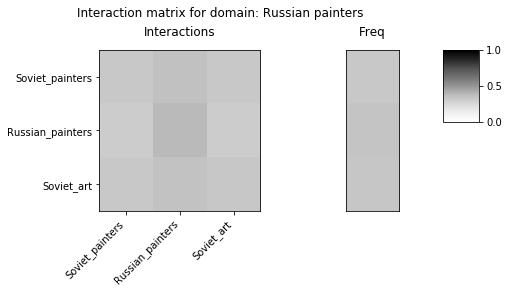

old domain idx
756
[15920, 15923, 15917, 15919]
new domain idx
386
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_386.npz


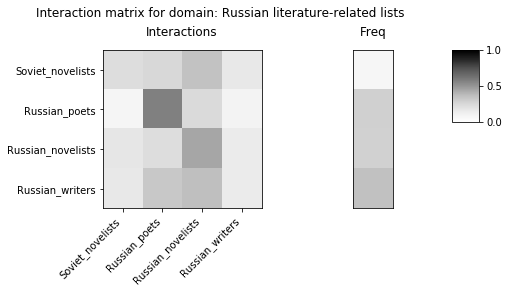

old domain idx
761
[16248, 16245, 16246]
something wrong with building freq or int mat: freqVec sum not 1: instead, [nan nan nan], nan
old domain idx
760
[16248, 16245, 16246]
something wrong with building freq or int mat: freqVec sum not 1: instead, [nan nan nan], nan
old domain idx
763
[16997, 16675, 16837, 16766]
new domain idx
387
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_387.npz


/Users/ruairidh/miniconda3/envs/blockmodels/lib/python3.7/site-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in true_divide


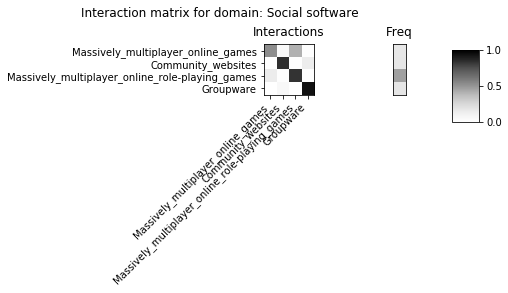

old domain idx
764
[17058, 16730, 16675]
new domain idx
388
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_388.npz


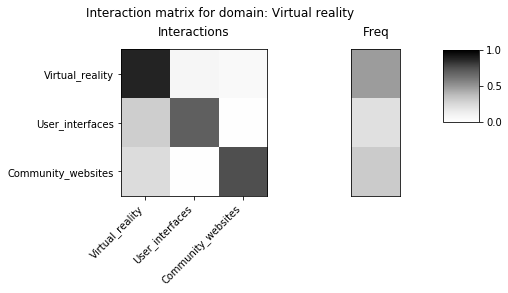

old domain idx
765
[17058, 16771, 16765, 16775]
new domain idx
389
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_389.npz


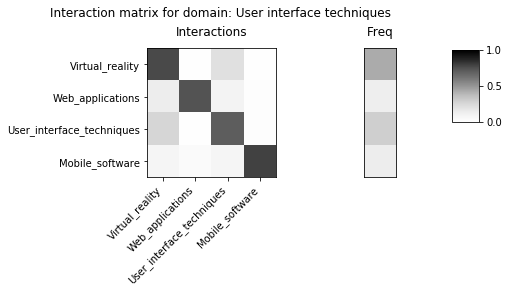

old domain idx
768
[16906, 16907, 16844, 16813, 16814, 16815, 16973, 16915, 16918, 16951, 16988, 16957, 16927]
new domain idx
390
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_390.npz


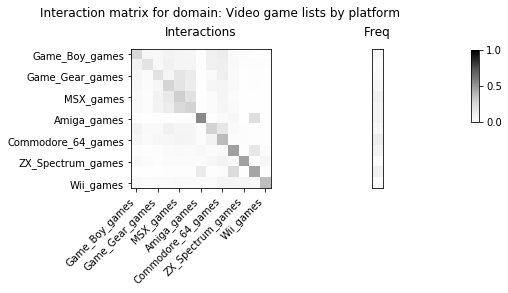

old domain idx
770
[16880, 16968, 16924]
new domain idx
391
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_391.npz


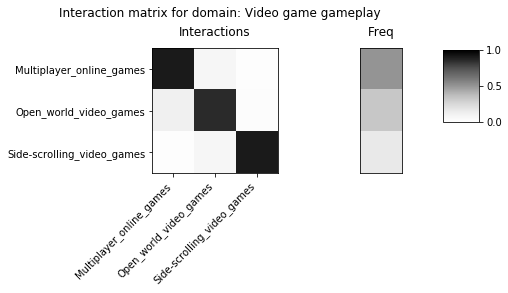

old domain idx
771
[16985, 16941, 16943]
new domain idx
392
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_392.npz


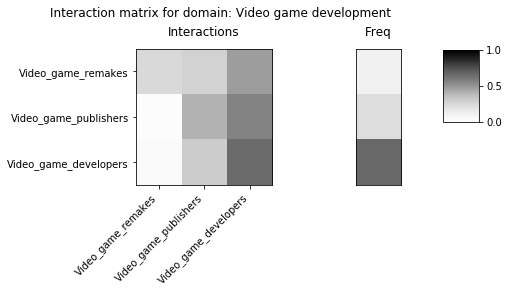

old domain idx
773
[16914, 16940, 16981, 16959]
new domain idx
393
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_393.npz


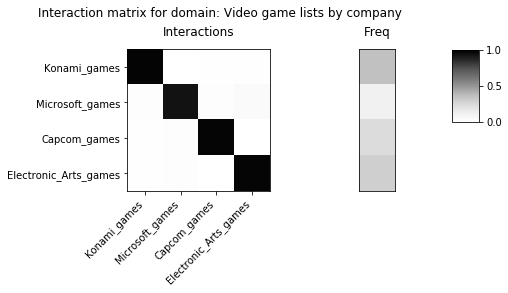

old domain idx
774
[16906, 16973, 16915, 16918, 16988, 16990]
new domain idx
394
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_394.npz


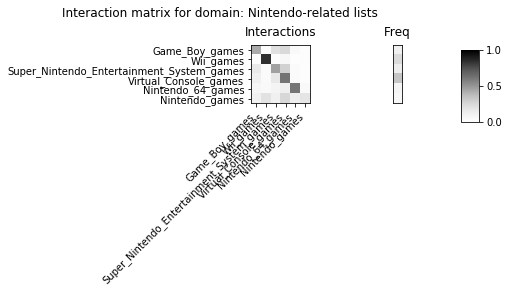

old domain idx
777
[17053, 17005, 17042, 17020, 17021, 17054]
new domain idx
395
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_395.npz


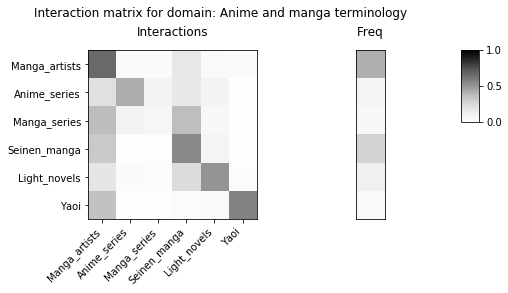

old domain idx
780
[17259, 17260, 17262, 17263]
new domain idx
396
saving data in: ../../../WIKIdata/matrices2020/wikipedia_system_396.npz


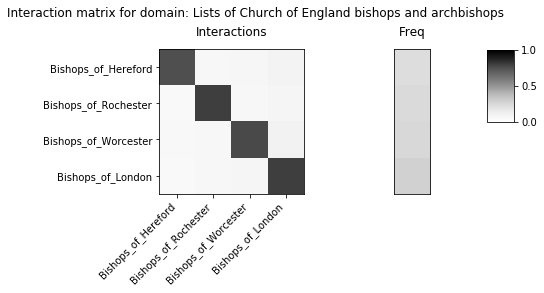

In [8]:
counter = 0
for domain in list(domainDict.values()):
    domain.reduce_categories(categoryNames)
    if domain.C >=3 and domain.C <= 20:
        domain.reduce_edges()
        print('old domain idx')
        print(domain.idx)
        print(domain.categories)
        try:
            domain.create_frequency_matrix()
            domain.create_interaction_matrix()
        except Exception as e:
            print('something wrong with building freq or int mat: {}'.format(e))
            continue
        domain.idx = counter
        print('new domain idx')
        print(domain.idx)
        domain.save_matrices('{0}/{1}/wikipedia_system_{2}.npz'.format(dataDir, matDir, domain.idx))
        
        #domain.save_matrices('{0}/{1}/wikipedia_system_{2}_C_{3}.npz'.format(dataDir, matDir, domain.idx, domain.C))
        domain.plot_interaction_matrix('{0}/{1}/{2}_{3}_figs'.format(dataDir, figDir, domain.name, domain.idx))
        plt.close('all')
        
        counter += 1